In [1]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import os
import numpy as np
import matplotlib.pyplot as plt
import copy
import sys
import itertools
import pickle as pkl
import json
from sklearn.metrics import roc_auc_score, balanced_accuracy_score, confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import SplineTransformer
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import RidgeClassifierCV
from aeon.classification.convolution_based import MiniRocketClassifier
import matplotlib.animation as anim
from IPython.display import HTML
from warnings import filterwarnings
from joblib import Parallel, delayed
filterwarnings("ignore")
os.chdir('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm')

# Use the current working directory as the base path
sys.path.append(os.path.abspath(os.path.join('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm\\tests', '..','..')))

from ml_edm.classification.classifiers_collection import ClassifiersCollection
from ml_edm.utils import check_timestamps 
from ml_edm.early_classifier import EarlyClassifier
from ml_edm.cost_matrices import CostMatrices
from ml_edm.trigger import *


In [2]:
def load_dataset(dataset_name, split, unb=False,z_normalize=False):
    if not unb :
        os.chdir('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm\\orange_cylinder\\')
    else:
        os.chdir('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm\\wholes_cylinders\\')
    data_train = np.loadtxt(f'{dataset_name}\\{dataset_name}_TRAIN.txt')
    data_test = np.loadtxt(f'{dataset_name}\\{dataset_name}_TEST.txt')
    
    X_train, X_test = (data_train[:, 1:], data_test[:, 1:])
    y_train, y_test = (data_train[:, 0], data_test[:, 0])

    if split != 'default':
        X_ = np.concatenate((X_train, X_test), axis=0)
        y_ = np.concatenate((y_train, y_test), axis=0)
        
        X_train, X_test, y_train, y_test = train_test_split(X_, y_, train_size=split, random_state=44, stratify=y_)
    
    if z_normalize:
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

    lb = LabelEncoder()
    y_train = lb.fit_transform(y_train)
    y_test = lb.transform(y_test)

    data_dict  = {
        "X_train": X_train,
        "y_train": y_train,
        "X_test": X_test,
        "y_test": y_test
    }
    
    return data_dict

In [37]:

def monitor_accuracy(dataset,clf_type='ridge',clf_method='sigmoid'):
    data_dict=load_dataset(dataset, split=0.8, z_normalize=False)
    X_train = data_dict['X_train']
    y_train = data_dict['y_train']
    X_test = data_dict['X_test']
    y_test = data_dict['y_test']
    X_classif, X_trigger, y_classif, y_trigger = train_test_split(X_train, y_train, test_size=0.4, random_state=44)
    
    sampling_ratio = 0.05
    max_T = X_train.shape[1] 
    timestamps = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
    # delete potential duplicates, O's 
    timestamps=check_timestamps(timestamps)
    if clf_type=='rocket' and clf_method=='isotonic':
        collection_clf = ClassifiersCollection(
                        base_classifier=MiniRocketClassifier(n_jobs=-1),
                        timestamps=timestamps,
                        cv_method='isotonic'
                        )
    elif clf_type=='rocket' and clf_method=='sigmoid':
        collection_clf = ClassifiersCollection(
                        base_classifier=MiniRocketClassifier(n_jobs=-1),
                        timestamps=timestamps,
                        cv_method='sigmoid'
                        )
    elif clf_type=='ridge' and clf_method=='isotonic':
        clf = make_pipeline(
        SplineTransformer(),
        CalibratedClassifierCV(RidgeClassifierCV(), method="isotonic") 
        )
        collection_clf = ClassifiersCollection(
        base_classifier=clf,
        timestamps=timestamps,
        calibration=False
        )
    else:
        # Ridge with sigmoid calibration
        collection_clf = ClassifiersCollection(
        base_classifier=RidgeClassifierCV(),
        feature_extraction={"method": "minirocket", "path": "models/", "params": {"random_state":42, "n_jobs": -1}},
        timestamps=timestamps,
        cv_method='isotonic' # change it to isotonic after testing
    )
    classes, counts = np.unique(y_train, return_counts=True)

    collection_clf.fit(X_classif, y_classif)
    accuracies = [collection_clf.score(X_test[:, :l], y_test) for l in timestamps]
    if len(np.unique(y_test)) > 2:
        aucs = [roc_auc_score(y_test, collection_clf.predict_proba(X_test[:, :l]), multi_class='ovr') for l in timestamps]
    else:
        aucs = [roc_auc_score(y_test, collection_clf.predict_proba(X_test[:, :l])[:, 1]) for l in timestamps]
    
    balanced_acc = [balanced_accuracy_score(y_test, collection_clf.predict(X_test[:, :l])) for l in timestamps]

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15,6))

    colors = itertools.cycle(plt.cm.tab10.colors)
    axes[0].plot(timestamps, accuracies, c=next(colors), label="Accuracy")
    axes[1].plot(timestamps, balanced_acc, c=next(colors), label="Balanced Accuracy")
    axes[2].plot(timestamps, aucs, c=next(colors), label="AUC")
    for ax in axes:
        ax.grid()
        ax.legend()
        ax.set_xlabel("Timestamps")
        ax.set_ylabel("Score")
        ax.set_title(f"Dataset: {dataset}")
    plt.tight_layout()
    
    
    
    plt.savefig(f'C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\classification_performance_{dataset}.pdf')
    plt.show()
    # get intra class accuracy
    confusion_matrices = [confusion_matrix(y_test, collection_clf.predict(X_test[:, :l])) for l in timestamps]
    acc_scores = [confusion_matrices[i].diagonal() / confusion_matrices[i].sum(axis=1) for i in range(len(timestamps))]
    acc_scores = np.array(acc_scores)
    fig, axes = plt.subplots(nrows=1, ncols=len(classes), figsize=(15,6))
    for i, cls in enumerate(classes):
        axes[i].plot(timestamps, acc_scores[:,i], c=next(colors), label=f"Accuracy, class {cls}")
        axes[i].set_ylim(0.1)
        axes[i].set_xlabel("timestamps")
    for ax in axes:
        ax.grid()
        ax.legend()
    plt.show()
    


## AluminiumConcentration Dataset

In [40]:
data_dict_alu = load_dataset('HouseholdPowerConsumption1', split=0.8, z_normalize=False)

In [41]:
X_train_alu = data_dict_alu['X_train']
y_train_alu = data_dict_alu['y_train']
X_test_alu = data_dict_alu['X_test']
y_test_alu = data_dict_alu['y_test']

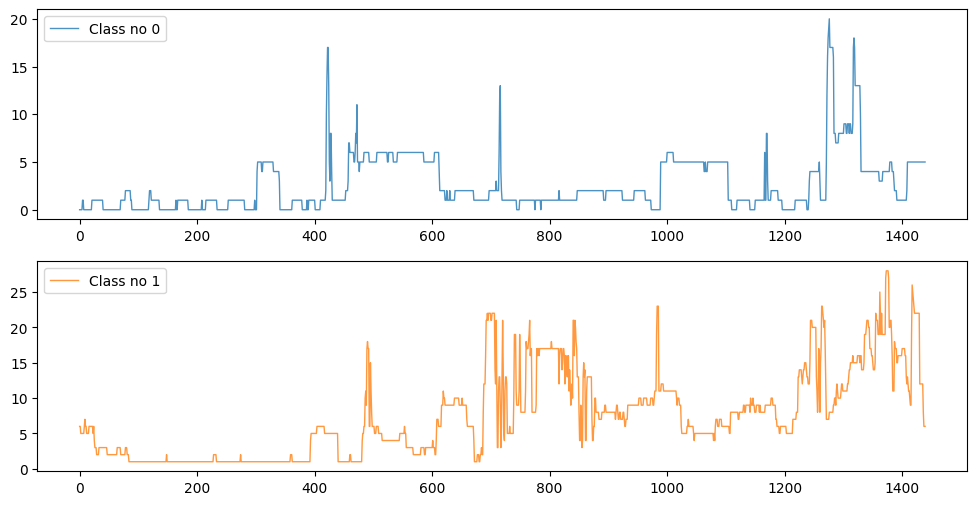

In [46]:

classes_alu, counts_alu = np.unique(y_train_alu, return_counts=True)
colors = itertools.cycle(plt.cm.tab10.colors)

# vizualisation of the dataset
fig, axes = plt.subplots(nrows=len(classes_alu), ncols=1, figsize=(12,6))

for i, cls in enumerate(classes_alu):
    rd_idx = np.random.choice(np.where(y_train_alu==cls)[0], size=1)
    c = next(colors)
    for j, idx in enumerate(rd_idx):
        axes[i].plot(X_train_alu[idx].squeeze(), color=c, alpha=0.8, lw=1,
                     label=f"Class no {cls}" if j == 0 else "")
        if j == 0:
            axes[i].legend()

plt.savefig('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\training_time_series_HouseholdPowerConsumption1.pdf')
plt.show()

In [6]:
print("Number of classes in train set: ", len(classes_alu))
print("Number of samples in train set: ", len(y_train_alu))
print("Number of features in train set: ", X_train_alu.shape[1])
print("Number of samples per class in train set: ", counts_alu)
print("Number of samples in test set: ", len(y_test_alu))
print("Number of features in test set: ", X_test_alu.shape[1])
print("Number of samples per class in test set: ", np.unique(y_test_alu, return_counts=True)[1])
print("Number of classes in test set: ", len(np.unique(y_test_alu)))



Number of classes in train set:  2
Number of samples in train set:  503
Number of features in train set:  2542
Number of samples per class in train set:  [251 252]
Number of samples in test set:  126
Number of features in test set:  2542
Number of samples per class in test set:  [63 63]
Number of classes in test set:  2


In [6]:
# transform balanced dataset to unbalanced dataset
from sklearn.utils import resample

def transform_to_unbalanced(X, y, n_samples_per_class):
    """"
    "Transform a balanced dataset into an unbalanced dataset by randomly selecting samples from each class."
    ""
    "Parameters:"
    "X : array-like, shape (n_samples, n_features)"
    "The input samples.""
    "y : array-like, shape (n_samples,)""
    "The target values (class labels)."""
    "n_samples_per_class : int or list of int"
    "The number of samples to select from each class. If a list is provided, it should have the same length as the number of classes."
    """"
    "Returns:""
    "X_unbalanced : array-like, shape (n_samples, n_features)""
    "The unbalanced input samples."""
    "y_unbalanced : array-like, shape (n_samples,)"
    "The unbalanced target values (class labels)."""
    # Get the unique classes and their counts
    classes, counts = np.unique(y, return_counts=True)
    n_classes = len(classes)

    # If n_samples_per_class is an integer, create a list with the same value for all classes
    if isinstance(n_samples_per_class, int):
        n_samples_per_class = [n_samples_per_class] * n_classes
    elif len(n_samples_per_class) != n_classes:
        raise ValueError("Length of n_samples_per_class must match the number of classes.")
    
    # Initialize empty lists to store the unbalanced samples and labels
    X_unbalanced = []

    y_unbalanced = []
    # Iterate through each class and randomly select samples
    for cls, n_samples in zip(classes, n_samples_per_class):
        # Get the indices of the samples belonging to the current class
        class_indices = np.where(y == cls)[0]
        
        # Randomly select samples from the current class
        selected_indices = np.random.choice(class_indices, size=n_samples)
        
        # Append the selected samples and labels to the unbalanced lists
        X_unbalanced.append(X[selected_indices])
        y_unbalanced.append(y[selected_indices])
    # Concatenate the unbalanced samples and labels into arrays 
    X_unbalanced = np.concatenate(X_unbalanced, axis=0)
    y_unbalanced = np.concatenate(y_unbalanced, axis=0)
    return X_unbalanced, y_unbalanced


In [7]:
X_unbalanced_train_alu, y_unbalanced_train_alu = transform_to_unbalanced(X_train_alu, y_train_alu, n_samples_per_class=[int(len(y_train_alu)*0.2),int(len(y_train_alu)*0.8)])
X_unbalanced_test_alu, y_unbalanced_test_alu = transform_to_unbalanced(X_test_alu, y_test_alu, n_samples_per_class=[int(len(y_test_alu)*0.2),int(len(y_test_alu)*0.8)])


In [8]:

print("Number of samples per class in train set: ", np.unique(y_unbalanced_train_alu, return_counts=True)[1])
print("Number of samples in train set: ", len(y_unbalanced_train_alu))
print("Number of classes in train set: ", len(np.unique(y_unbalanced_train_alu)))


Number of samples per class in train set:  [100 402]
Number of samples in train set:  502
Number of classes in train set:  2


## SmoothSubSpace

In [3]:
os.chdir('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm\\orange_cylinder')
data_dict_smooth = load_dataset('SmoothSubspace', split=0.8, z_normalize=True)

In [4]:
X_train_smooth = data_dict_smooth['X_train']
y_train_smooth = data_dict_smooth['y_train']
X_test_smooth = data_dict_smooth['X_test']
y_test_smooth = data_dict_smooth['y_test']

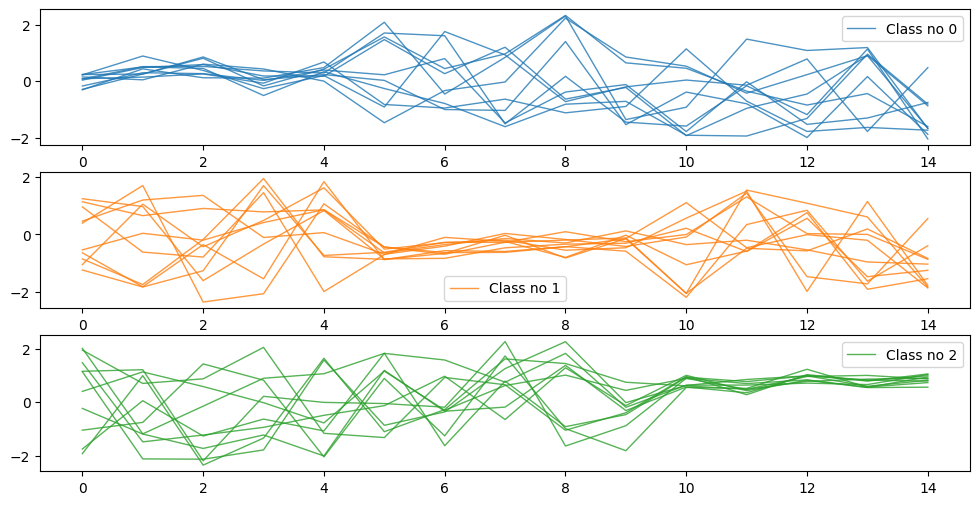

In [5]:
classes_smooth, counts_smooth = np.unique(y_train_smooth, return_counts=True)
colors = itertools.cycle(plt.cm.tab10.colors)

# vizualisation of the dataset
fig, axes = plt.subplots(nrows=len(classes_smooth), ncols=1, figsize=(12,6))

for i, cls in enumerate(classes_smooth):
    rd_idx = np.random.choice(np.where(y_train_smooth==cls)[0], size=10)
    c = next(colors)
    for j, idx in enumerate(rd_idx):
        axes[i].plot(X_train_smooth[idx].squeeze(), color=c, alpha=0.8, lw=1,
                     label=f"Class no {cls}" if j == 0 else "")
        if j == 0:
            axes[i].legend()
plt.show()


In [6]:
print("Number of classes in train set: ", len(classes_smooth))
print("Number of samples in train set: ", len(y_train_smooth))
print("Number of features in train set: ", X_train_smooth.shape[1])
print("Number of samples per class in train set: ", counts_smooth)
print("Number of samples in test set: ", len(y_test_smooth))
print("Number of features in test set: ", X_test_smooth.shape[1])
print("Number of samples per class in test set: ", np.unique(y_test_smooth, return_counts=True)[1])
print("Number of classes in test set: ", len(np.unique(y_test_smooth)))

Number of classes in train set:  3
Number of samples in train set:  240
Number of features in train set:  15
Number of samples per class in train set:  [80 80 80]
Number of samples in test set:  60
Number of features in test set:  15
Number of samples per class in test set:  [20 20 20]
Number of classes in test set:  3


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:110: UserWarning: Removed duplicates in argument 'timestamps'.
  warn("Removed duplicates in argument 'timestamps'.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:114: UserWarning: Removed 0 from 'timestamps', first valid timestamps is usually 1.
  warn("Removed 0 from 'timestamps', first valid timestamps is usually 1.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\features_engineering\features_extraction.py:48: UserWarning: Time series provided are too short, (length = 1) for minirocket, using timestamps as features
  warn(f"Time series provided are too short, (length = {X.shape[1]}) for {self.method},"
C:\Users

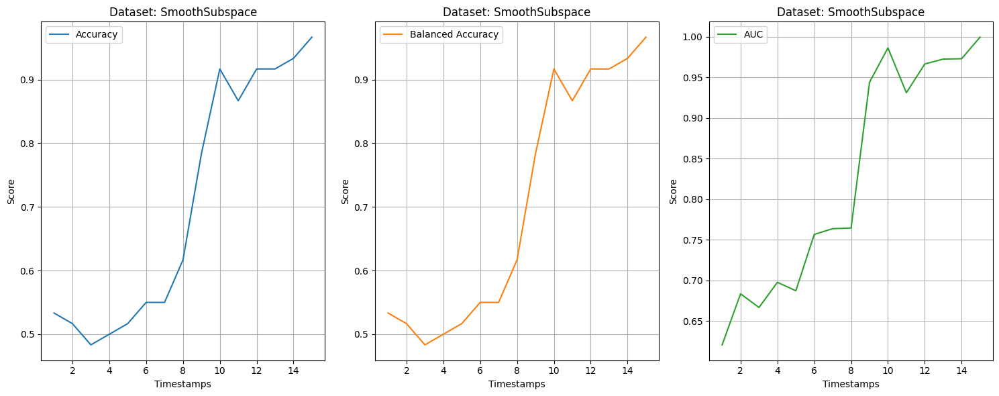

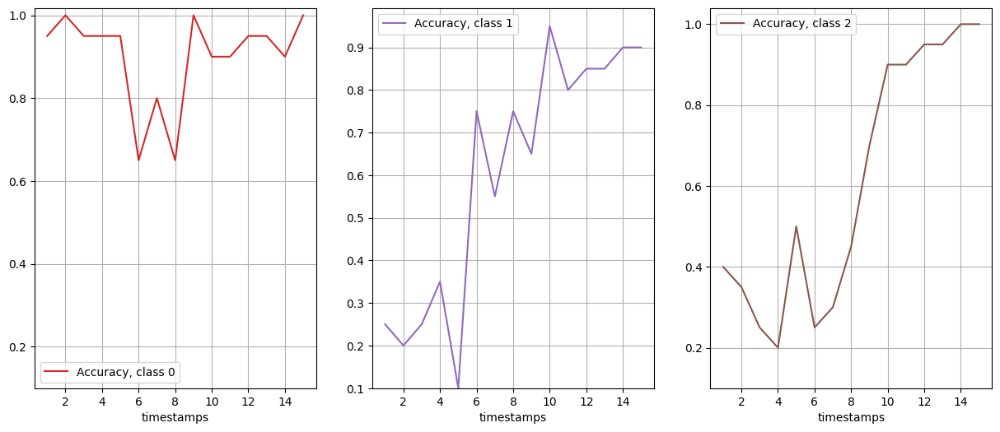

In [55]:
monitor_accuracy('SmoothSubspace', clf_type='ridge', clf_method='sigmoid')

## EOGVerticalSignal Dataset :

In [15]:
data_dict_EOG = load_dataset('EOGVerticalSignal', split=0.8, z_normalize=True)

In [16]:
X_train_EOG = data_dict_EOG['X_train']

y_train_EOG = data_dict_EOG['y_train']
X_test_EOG = data_dict_EOG['X_test']
y_test_EOG = data_dict_EOG['y_test']

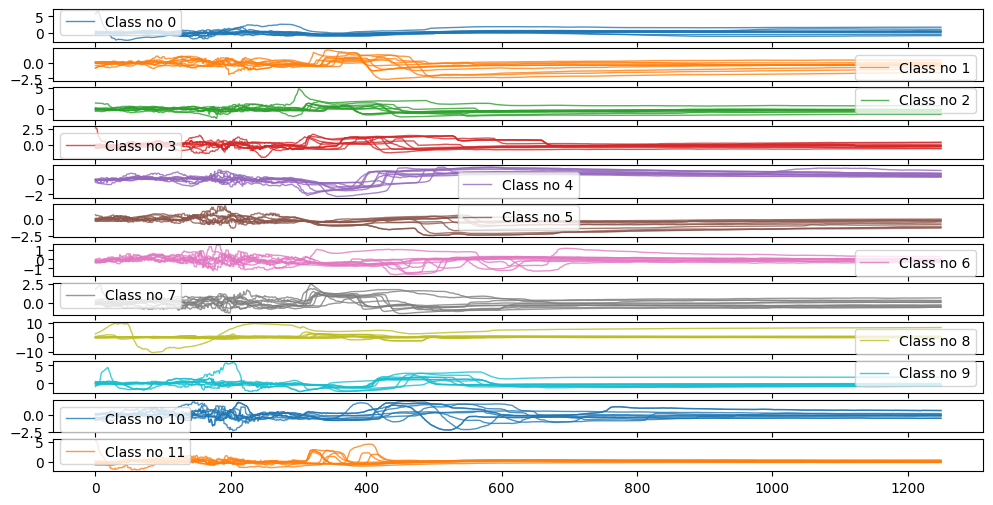

In [17]:
classes_EOG, counts_EOG = np.unique(y_train_EOG, return_counts=True)
colors = itertools.cycle(plt.cm.tab10.colors)

# vizualisation of the dataset
fig, axes = plt.subplots(nrows=len(classes_EOG), ncols=1, figsize=(12,6))

for i, cls in enumerate(classes_EOG):
    rd_idx = np.random.choice(np.where(y_train_EOG==cls)[0], size=10)
    c = next(colors)
    for j, idx in enumerate(rd_idx):
        axes[i].plot(X_train_EOG[idx].squeeze(), color=c, alpha=0.8, lw=1,
                     label=f"Class no {cls}" if j == 0 else "")
        if j == 0:
            axes[i].legend()
plt.show()


In [18]:
print("Number of classes in train set: ", len(classes_EOG))
print("Number of samples in train set: ", len(y_train_EOG))
print("Number of features in train set: ", X_train_EOG.shape[1])
print("Number of samples per class in train set: ", counts_EOG)
print("Number of samples in test set: ", len(y_test_EOG))
print("Number of features in test set: ", X_test_EOG.shape[1])
print("Number of samples per class in test set: ", np.unique(y_test_EOG, return_counts=True)[1])
print("Number of classes in test set: ", len(np.unique(y_test_EOG)))

Number of classes in train set:  12
Number of samples in train set:  579
Number of features in train set:  1250
Number of samples per class in train set:  [48 48 48 48 49 49 49 48 48 48 49 47]
Number of samples in test set:  145
Number of features in test set:  1250
Number of samples per class in test set:  [12 12 12 12 12 12 12 12 13 12 12 12]
Number of classes in test set:  12


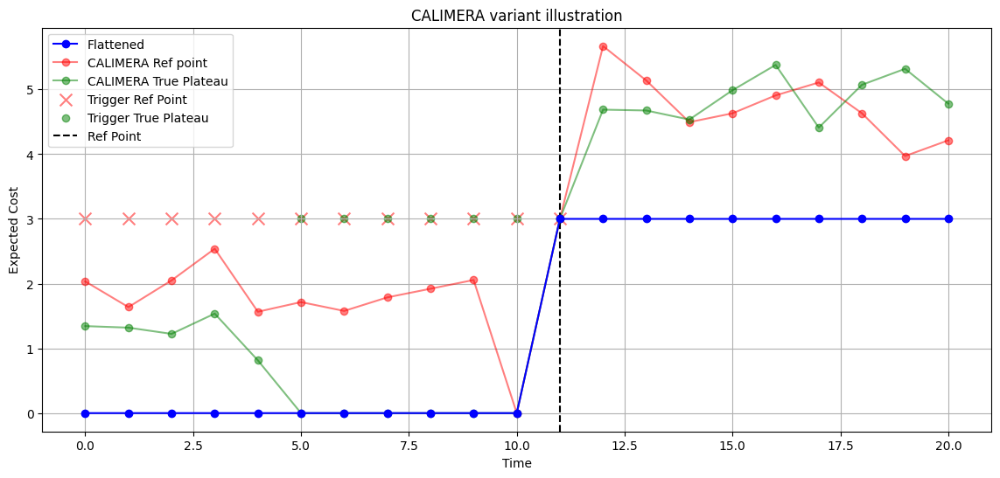

In [10]:
# generate 20points separated by 1 
t = np.linspace(0, 20, 21)
# simulate a step function
# between 0 and 5 , f(t) = 0
# between 5 and 10, f(t) = t
# between 10 and 20, f(t) = 10
def step_function(t):
    if t < 10:
        return 0
    elif t < 11:
        return t-10
    else:
        return 3
noise = np.random.normal(1,0.5,size=t.shape)
c=np.zeros(t.shape)
c[t<10]=c[t<10]+0.5+noise[t<10]
#c[t>10 ]=c[t>10]+t[t>10]-10
c[11]=3
c[t>11]=4+noise[t>11]

noise = np.random.normal(1,0.5,size=t.shape)
a=np.zeros(t.shape)
a[t<5]=a[t<5]+0.5+noise[t<5]
a[11]=3
#a[t>10 ]=a[t>10]+t[t>10]-10
a[t>11]=4+noise[t>11]
# apply the step function to the array t
y_step = np.array([step_function(ti) for ti in t])
# plot the step function
plt.figure(figsize=(14, 6))
plt.plot(t, y_step, marker='o', linestyle='-', color='b',zorder=10,label='Flattened')
plt.plot(t, c, marker='o', linestyle='-', color='r', alpha=0.5,label='CALIMERA Ref point')
plt.plot(t, a, marker='o', linestyle='-', color='g', alpha=0.5, label = 'CALIMERA True Plateau')
plt.scatter(t[t<=11],[3]*12, color='red', alpha=0.5,marker='x', s=100,label='Trigger Ref Point')
plt.scatter(t[(t>=5) & (t<=11)], [3]*np.sum((t>=5) & (t<=11)), color='green', alpha=0.5, label='Trigger True Plateau')
plt.axvline(11, color='black', linestyle='--', label='Ref Point')
plt.title('CALIMERA variant illustration')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Expected Cost')
plt.grid()
plt.savefig('CALIMERA_illustration.pdf')
plt.show()



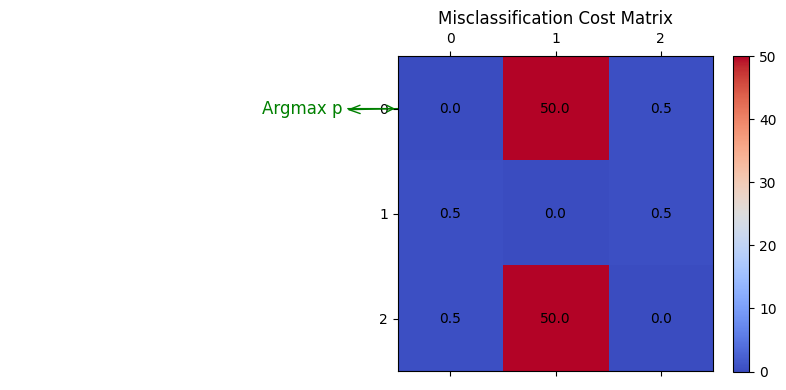

In [166]:

import matplotlib.patches as mpatches
small_values = 0.5
misclf_cost_mat = small_values - np.eye(3) * small_values


idx_min_class = 1
misclf_cost_mat[:, idx_min_class] *= 100



# Create two axes: ax1 for the matrix, ax2 for annotation/arrow
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), gridspec_kw={'width_ratios': [1, 3]})

# Plot the matrix on ax2
cax = ax2.matshow(misclf_cost_mat, cmap='coolwarm')
for (i, j), val in np.ndenumerate(misclf_cost_mat):
    ax2.text(j, i, f"{val:.1f}", ha='center', va='center', color='black')
ax2.set_title("Misclassification Cost Matrix")
fig.colorbar(cax, ax=ax2, fraction=0.046, pad=0.04)

# Hide ax1 axes
ax1.axis('off')

# Draw a connection patch (arrow) from the left of the matrix to ax1 (arrow on the left)
arrow_start = (-0.5, 0)   # left edge of the matrix (ax2)
arrow_end = (2, 0.83) # somewhere in ax1

con = ConnectionPatch(
    xyA=arrow_start, xyB=arrow_end, coordsA="data", coordsB="axes fraction",
    axesA=ax2, axesB=ax1, arrowstyle="->,head_width=.15", color='g', mutation_scale=20
)
ax2.add_artist(con)

# To add a label to the arrow, use ax2.annotate and set the position near the arrow
ax2.annotate("Argmax p", xy=arrow_start, xytext=(-40, 0), textcoords='offset points',
             ha='right', va='center', color='g', fontsize=12,
             arrowprops=dict(arrowstyle="->", color='g'))

plt.tight_layout()
plt.show()

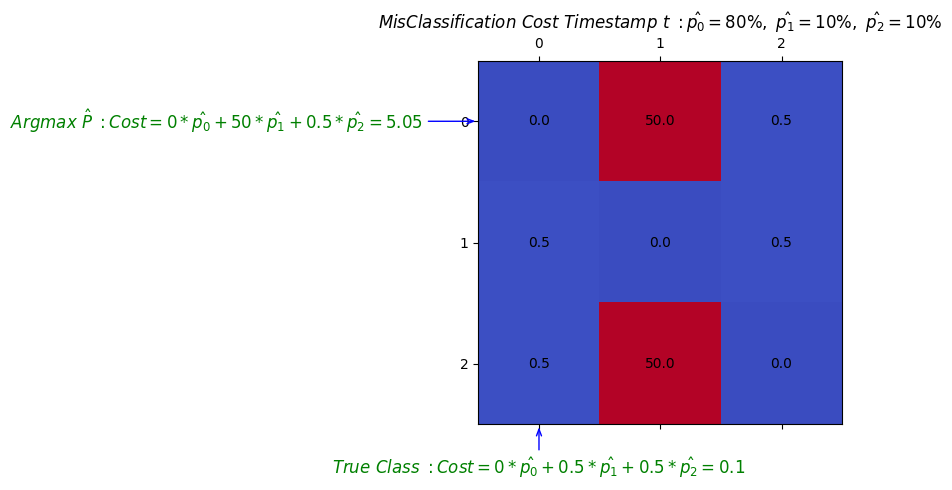

In [229]:
from matplotlib.patches import ConnectionPatch

import matplotlib.patches as mpatches
small_values = 0.5
misclf_cost_mat = small_values - np.eye(3) * small_values


idx_min_class = 1
misclf_cost_mat[:, idx_min_class] *= 100



# Create two axes: ax1 for the matrix, ax2 for annotation/arrow
fig, ax = plt.subplots(figsize=(10,5))

# Plot the matrix on ax2
cax = ax.matshow(misclf_cost_mat, cmap='coolwarm')
for (i, j), val in np.ndenumerate(misclf_cost_mat):
    ax.text(j, i, f"{val:.1f}", ha='center', va='center', color='black')
ax.set_title("Misclassification Cost Matrix")
fig.colorbar(cax, ax=ax2, fraction=0.046, pad=0.04)



# Draw a connection patch (arrow) from the left of the matrix to ax1 (arrow on the left)
arrow_start = (-0.5, 0)   # left edge of the matrix (ax2)



# Draw another connection patch pointing to the bottom of the matrix
arrow_start_bottom = (0, 2.5)  # bottom center of the matrix (ax2)
arrow_end_bottom = (3.5, -0.25) # somewhere below in ax1



# To add a label to the left arrow, use ax2.annotate and set the position near the arrow
ax.annotate("$Argmax \ \hat{P} \ : Cost = 0*\hat{p_0}+50*\hat{p_1}+0.5*\hat{p_2} = 5.05$", xy=arrow_start, xytext=(-40, 0), textcoords='offset points',
             ha='right', va='center', color='g', fontsize=12,
             arrowprops=dict(arrowstyle="->,head_width=.15", color='b'))

# Add a label to the bottom arrow
ax.annotate("$True \ Class  \ : Cost = 0*\hat{p_0}+0.5*\hat{p_1}+0.5*\hat{p_2}=0.1 $", xy=arrow_start_bottom, xytext=(0, -40), textcoords='offset points',
             ha='center', va='bottom', color='g', fontsize=12,
             arrowprops=dict(arrowstyle="->,head_width=.15", color='b'))
plt.title('$ MisClassification \ Cost \ Timestamp \ t \ : \hat{p_0}=80\% ,\  \hat{p_1}=10\% ,\  \hat{p_2}=10\%$')
plt.tight_layout()
plt.savefig('MisClassificationCost_Timestamp_t.pdf')
plt.show()

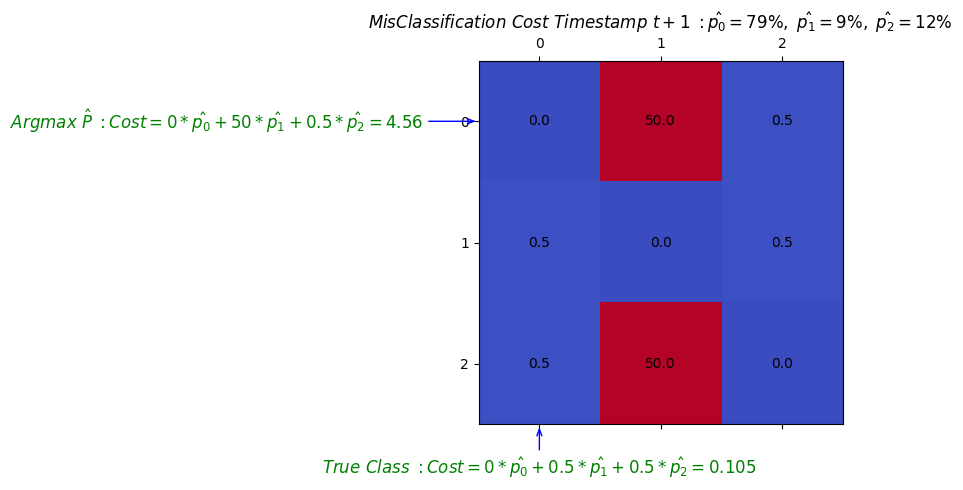

In [230]:
fig, ax = plt.subplots(figsize=(10,5))

# Plot the matrix on ax2
cax = ax.matshow(misclf_cost_mat, cmap='coolwarm')
for (i, j), val in np.ndenumerate(misclf_cost_mat):
    ax.text(j, i, f"{val:.1f}", ha='center', va='center', color='black')
ax.set_title("Misclassification Cost Matrix")
fig.colorbar(cax, ax=ax2, fraction=0.046, pad=0.04)



# Draw a connection patch (arrow) from the left of the matrix to ax1 (arrow on the left)
arrow_start = (-0.5, 0)   # left edge of the matrix (ax2)



# Draw another connection patch pointing to the bottom of the matrix
arrow_start_bottom = (0, 2.5)  # bottom center of the matrix (ax2)
arrow_end_bottom = (3.5, -0.25) # somewhere below in ax1



# To add a label to the left arrow, use ax2.annotate and set the position near the arrow
ax.annotate("$Argmax \ \hat{P} \ : Cost = 0*\hat{p_0}+50*\hat{p_1}+0.5*\hat{p_2} = 4.56$", xy=arrow_start, xytext=(-40, 0), textcoords='offset points',
             ha='right', va='center', color='g', fontsize=12,
             arrowprops=dict(arrowstyle="->,head_width=.15", color='b'))

# Add a label to the bottom arrow
ax.annotate("$True \ Class  \ : Cost = 0*\hat{p_0}+0.5*\hat{p_1}+0.5*\hat{p_2}=0.105 $", xy=arrow_start_bottom, xytext=(0, -40), textcoords='offset points',
             ha='center', va='bottom', color='g', fontsize=12,
             arrowprops=dict(arrowstyle="->,head_width=.15", color='b'))
plt.title('$ MisClassification \ Cost \ Timestamp \ t+1 \ : \hat{p_0}=79\% ,\  \hat{p_1}=9\% ,\  \hat{p_2}=12\%$')
plt.tight_layout()
plt.savefig('MisClassificationCost_Timestamp_t_plus_1.pdf')
plt.show()

##  Experiment 1 : Trying different trigger models with Zero-One Cost matrix and MiniRocket Sigmoid 

In [3]:
data_dict = load_dataset('BME', split='default', z_normalize=False,unb= True)
X_train = data_dict['X_train']
y_train = data_dict['y_train']
X_test = data_dict['X_test']
y_test = data_dict['y_test']
classes, counts = np.unique(y_train, return_counts=True)
sampling_ratio = 0.05
max_T = X_train.shape[1] 
timestamps = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
# delete potential duplicates, O's 
timestamps = check_timestamps(timestamps)

def delay_cost(t):
        inflexion_point = 0
        return np.exp(((t/X_train.shape[1])-inflexion_point) * np.log(100))
  
small_values = 1
misclf_cost_mat = small_values - np.eye(len(classes)) * small_values

#classes, counts = np.unique(y_train, return_counts=True)
idx_min_class = classes[counts.argmin()]
misclf_cost_mat[:, idx_min_class] *= 100

ALPHA =1.0

# create new cost matrices 
#misclf_cost_mat = 1 - np.eye(len(classes)) 

cost_matrices = CostMatrices(timestamps=timestamps, n_classes=len(classes), delay_cost= delay_cost,misclf_cost=misclf_cost_mat,alpha=ALPHA)

In [4]:
# Another split in our training set beteween classification and trigger data
X_classif, X_trigger, y_classif, y_trigger = train_test_split(X_train, y_train, test_size=0.4, random_state=44)

In [5]:
print(X_trigger)

[[0.01094719 0.02062986 0.01904232 ... 0.01787667 0.00048031 0.0198272 ]
 [0.02620127 0.00744002 0.01793426 ... 0.0021648  0.04689994 0.02440321]
 [0.01985576 0.00367659 0.03507744 ... 0.02247886 0.03220358 0.04518721]
 ...
 [0.00042488 0.02098182 0.00252583 ... 0.00778903 0.0291942  0.02183739]
 [0.03032453 0.0397319  0.0335088  ... 0.00964899 0.01674348 0.01716174]
 [0.04535587 0.03389509 0.0075624  ... 0.04269285 0.03052824 0.00883168]]


In [5]:

collection_clf = ClassifiersCollection(
        base_classifier=RidgeClassifierCV(),
        feature_extraction={"method": "minirocket", "path": "models/", "params": {"random_state":42, "n_jobs": -1}},
        timestamps=timestamps,
        cv_method='sigmoid' # change it to isotonic after testing
)
collection_clf.fit(X_classif, y_classif)

ClassifiersCollection(base_classifier=RidgeClassifierCV(),
                      classifiers=[CalibratedClassifierCV(cv='prefit',
                                                          estimator=RidgeClassifierCV()),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=RidgeClassifierCV()),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=RidgeClassifierCV()),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=RidgeClassifierCV()),
                                   CalibratedClass...
                                                          estimator=RidgeClassifierCV()),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=RidgeClassifierCV()),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=RidgeClassifierCV())],
                      feature_extraction={'method': 'minirocket',
                                          'params': {'n_jobs': -1,
                                                     'random_state': 42},
                                          'path': 'models/'},
                      min_length=1,
                      timestamps=array([  6,  12,  19,  25,  32,  38,  44,  51,  57,  64,  70,  76,  83,
        89,  96, 102, 108, 115, 121, 128]))

In [23]:
monitor_accuracy('EOGVerticalSignal', clf_type='rocket', clf_method='sigmoid')

NameError: name 'monitor_accuracy' is not defined

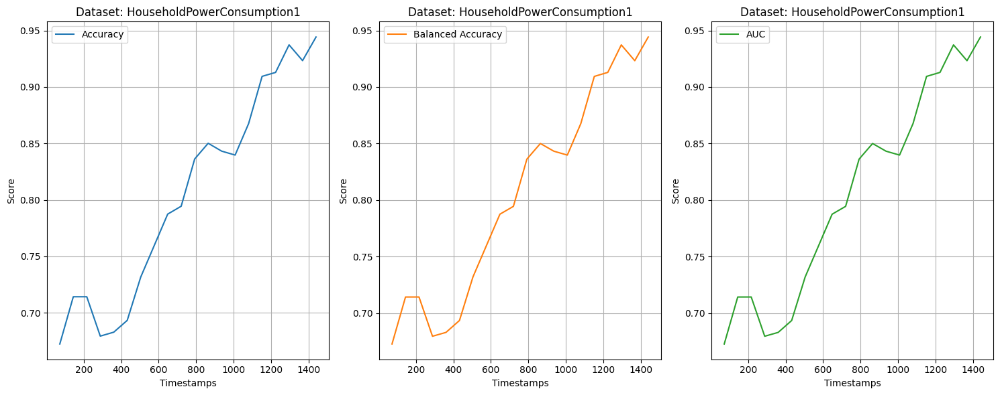

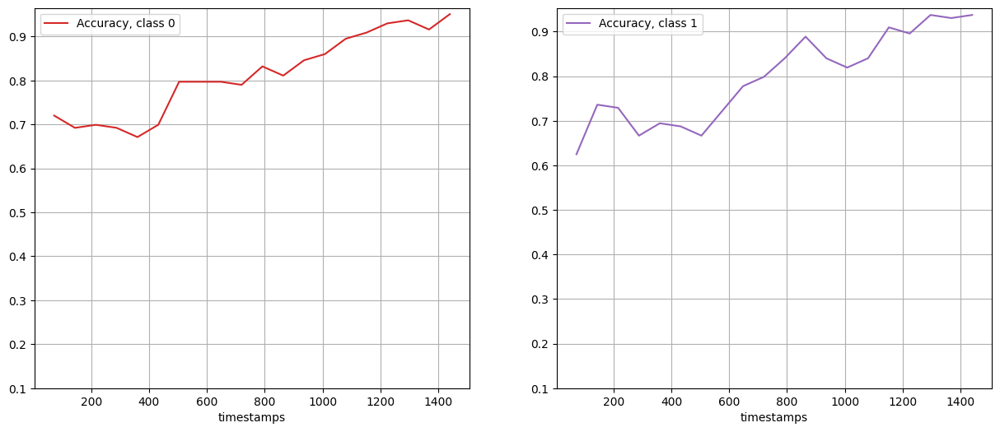

In [38]:
monitor_accuracy('HouseholdPowerConsumption1', clf_type='rocket', clf_method='sigmoid')

### ----Trigger Models

#### ----Basic CALIMERA

In [10]:
cal_basic = CALIMERA(timestamps,n_jobs=-1)

In [11]:
early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)

EarlyClassifier(chronological_classifiers=ClassifiersCollection(base_classifier=RidgeClassifierCV(),
                                                                classifiers=[CalibratedClassifierCV(cv='prefit',
                                                                                                    estimator=RidgeClassifierCV()),
                                                                             CalibratedClassifierCV(cv='prefit',
                                                                                                    estimator=RidgeClassifierCV()),
                                                                             CalibratedClassifierCV(cv='prefit',
                                                                                                    estimator=RidgeClassifierCV()),
                                                                             CalibratedClassifierCV(cv='prefit',
                                                                                                    esti...
                                                                                               'random_state': 42},
                                                                                    'path': 'models/'},
                                                                min_length=1,
                                                                timestamps=array([  6,  12,  19,  25,  32,  38,  44,  51,  57,  64,  70,  76,  83,
        89,  96, 102, 108, 115, 121, 128])),
                cost_matrices=<ml_edm.cost_matrices.CostMatrices object at 0x0000025211D9F9A0>,
                prefit_classifiers=True,
                trigger_model=CALIMERA(n_jobs=-1,
                                       timestamps=array([  6,  12,  19,  25,  32,  38,  44,  51,  57,  64,  70,  76,  83,
        89,  96, 102, 108, 115, 121, 128])))

In [96]:
print(cal_basic.halters)

[KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf'), KernelRidge(kernel='rbf')]


In [12]:
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)

In [13]:
print("Average cost: ", metrics_cal_basic['average_cost'])
print("Accuracy : ", metrics_cal_basic['accuracy'])
print("Earliness : ", metrics_cal_basic['earliness'])

Average cost:  0.20454545454545456
Accuracy :  0.7954545454545454
Earliness :  0.6413352272727273


In [6]:
X_trigger_train,X_trigger_val,y_trigger_train,y_trigger_val = train_test_split(X_trigger,y_trigger,test_size=0.3,random_state=42)
unique_classes = np.unique(y_trigger)
missing_classes = [cls for cls in unique_classes if cls not in np.unique(y_trigger_train)]
if missing_classes:
    # Add one sample of each missing class from y_trigger_val to y_trigger_train
    for cls in missing_classes:
        idx = np.where(y_trigger_val == cls)[0][0]
        print(idx)
        # Concatenate the sample to train set and remove from val set
        X_trigger_train = np.vstack([X_trigger_train, X_trigger_val[idx]])
        y_trigger_train = np.append(y_trigger_train, y_trigger_val[idx])
        X_trigger_val = np.delete(X_trigger_val, idx, axis=0)
        y_trigger_val = np.delete(y_trigger_val, idx)


X_probas = np.stack(collection_clf.predict_past_proba(X_trigger_train, cost_matrices))

X_probas_test = np.stack(collection_clf.predict_past_proba(X_test, cost_matrices))
X_probas_val = np.stack(collection_clf.predict_past_proba(X_trigger_val, cost_matrices))

In [48]:
def get_t_star(X_probas,y):
        all_f = np.zeros((len(timestamps), len(y)))
        all_preds = np.zeros((len(timestamps), len(y)))

        for t, l in enumerate(timestamps):
            probas = X_probas[:,t,:]
            classes = np.argmax(probas, axis=-1)
            all_preds[t] = classes
            all_f[t] = np.array(
                    [cost_matrices[t][:][y[i]] * probas[i] for i in range(len(y))]
                ).sum(axis=-1)
        t_star_idx = all_f.argmin(axis=0)
        all_t_star = [timestamps[idx]
                      for idx in t_star_idx]
        return all_t_star

In [49]:
all_t_star = get_t_star(X_probas,y_trigger_train)

In [50]:
print(all_t_star)

[365, 127, 109, 365, 365, 365, 127, 237, 328, 310, 328, 365, 346, 365, 237, 365, 54, 73, 200, 346, 73, 255, 164, 365, 54, 109, 365, 255, 365, 237, 273, 237, 36, 237, 310, 36, 273, 18, 54, 365, 365, 365, 365, 365, 328, 237]


In [10]:
X_probas.shape

(8, 20, 3)

In [7]:
trigger = CALIMERA(timestamps,regressor = 'one',n_jobs=-1,num_epochs=1000,start_val_epoch=20,eval_epochs = 10,one_reg_full=False)

In [8]:
ec = EarlyClassifier(collection_clf, trigger, cost_matrices, prefit_classifiers=True)

In [8]:
print(y_test is not None)

True


In [9]:
print(len(timestamps))

20


In [28]:
print(X_probas_val.shape[0])

12


In [9]:


trigger.fit(X=X_trigger_train,X_probas=X_probas, y=y_trigger_train,X_val=X_trigger_val,X_probas_val= X_probas_val,y_val=y_trigger_val,X_test=X_test,  X_probas_test=X_probas_test,y_test=y_test,cost_matrices=cost_matrices )               
res = ec.score(X_test, y_test, return_metrics=True) 

Loaded best model state


In [13]:
trigger.results_dict['t_star_6']["X_all"]

array([[1.49694070e-01, 4.50528737e-01, 3.99777193e-01, 5.07515434e-02,
        4.50528737e-01, 1.00000000e+01],
       [9.48858976e-02, 3.53307290e-01, 5.51806812e-01, 1.98499522e-01,
        5.51806812e-01, 5.00000000e+00],
       [1.41960347e-01, 4.40293893e-01, 4.17745760e-01, 2.25481332e-02,
        4.40293893e-01, 6.00000000e+00],
       [1.43613174e-01, 6.02653585e-01, 2.53733242e-01, 3.48920343e-01,
        6.02653585e-01, 8.00000000e+00],
       [1.41960347e-01, 4.40293893e-01, 4.17745760e-01, 2.25481332e-02,
        4.40293893e-01, 6.00000000e+00],
       [1.00526465e-01, 5.74744768e-01, 3.24728767e-01, 2.50016001e-01,
        5.74744768e-01, 5.00000000e+00],
       [1.64890385e-01, 3.81713437e-01, 4.53396177e-01, 7.16827400e-02,
        4.53396177e-01, 8.00000000e+00],
       [9.48858976e-02, 3.53307290e-01, 5.51806812e-01, 1.98499522e-01,
        5.51806812e-01, 5.00000000e+00],
       [1.43613174e-01, 6.02653585e-01, 2.53733242e-01, 3.48920343e-01,
        6.02653585e-01, 

In [11]:
print(trigger.opt_epsilon)

None


In [10]:
trigger.epsilon_method

False

In [15]:
print(X_trigger_val.shape)

(4, 128)


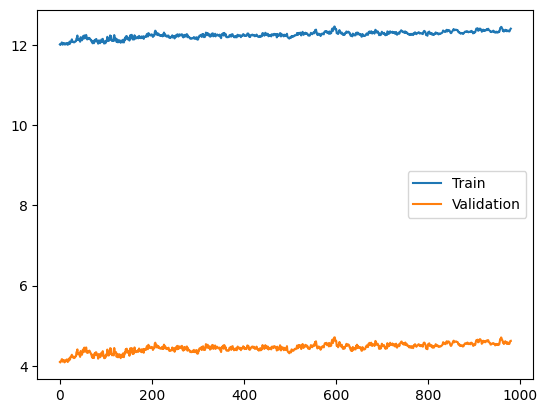

In [12]:
plt.plot(trigger.train_losses,label='Train')
plt.plot(trigger.val_losses,label='Validation')
plt.legend()
plt.show()

In [13]:
(2.29-2.285)/2.285

0.002188183807439778

In [42]:
len(trigger.train_losses)

980

In [43]:
len(trigger.val_losses)

980

In [20]:
print(X_trigger_train.shape[0])

28


In [13]:
avg_test_costs = trigger.avg_test_costs
avg_val_costs = trigger.avg_val_costs
print(avg_test_costs)
print(avg_val_costs)

[2.3636363636363638, 0.29545454545454547, 0.38636363636363635, 0.3409090909090909, 0.38636363636363635, 0.4318181818181818, 0.45454545454545453, 0.4090909090909091, 0.3409090909090909, 0.38636363636363635, 0.4090909090909091, 0.4090909090909091, 7.2272727272727275, 0.38636363636363635, 0.38636363636363635, 0.38636363636363635, 0.4318181818181818, 0.36363636363636365, 0.38636363636363635, 0.4090909090909091, 7.204545454545454, 4.931818181818182, 14.068181818181818, 2.6136363636363638, 0.36363636363636365, 0.38636363636363635, 0.38636363636363635, 0.36363636363636365, 0.36363636363636365, 0.36363636363636365, 0.3409090909090909, 0.36363636363636365, 11.772727272727273, 2.659090909090909, 0.38636363636363635, 2.6363636363636362, 0.29545454545454547, 0.4318181818181818, 0.2727272727272727, 0.22727272727272727, 0.3181818181818182, 2.6136363636363638, 2.659090909090909, 0.1590909090909091, 0.11363636363636363, 0.22727272727272727, 0.29545454545454547, 0.20454545454545456, 2.6818181818181817,

In [21]:
import torch

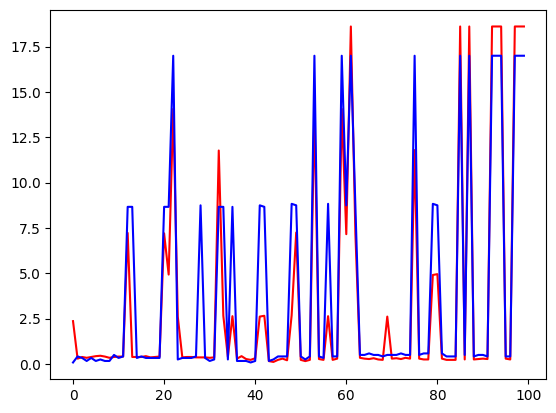

In [14]:
plt.plot(avg_test_costs,c='r')
plt.plot(avg_val_costs,c='b')

In [22]:
torch.cuda.is_available()

False

In [15]:
print("Average cost: ", res['average_cost'])
print("Accuracy : ", res['accuracy'])
print("Earliness : ", res['earliness'])

Average cost:  0.38636363636363635
Accuracy :  0.6136363636363636
Earliness :  0.24733664772727273


In [28]:
trigger.opt_epsilon

-0.021875629876111007


KeyboardInterrupt



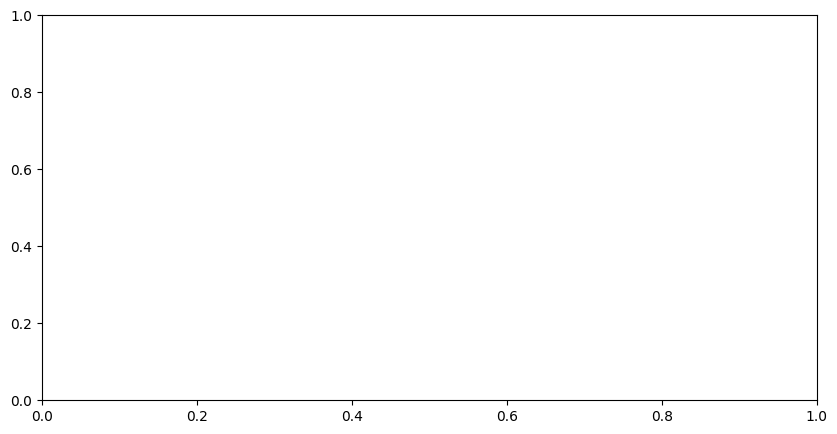

In [13]:
plt.figure(figsize=(10, 5))
plt.plot(np.arange(trigger.num_epochs),trigger.train_losses, label='Train Loss', color='blue')
plt.plot(np.arange(trigger.num_epochs),trigger.test_losses, label ='Test loss', color='orange')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Losses')
plt.legend()
plt.grid()
plt.show()


In [9]:
cal_basic = CALIMERA(timestamps,variant='true_label',regressor='one',n_jobs=-1)
early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)

Epoch 1/1000
Loss: 29.9387
Epoch 11/1000
Loss: 29.7351
Epoch 21/1000
Loss: 23.5839
Epoch 31/1000
Loss: 21.4590
Epoch 41/1000
Loss: 21.3384
Epoch 51/1000
Loss: 20.5570
Epoch 61/1000
Loss: 21.4685
Epoch 71/1000
Loss: 22.3181
Epoch 81/1000
Loss: 17.9332
Epoch 91/1000
Loss: 17.9880
Epoch 101/1000
Loss: 18.1671
Epoch 111/1000
Loss: 17.9322
Epoch 121/1000
Loss: 16.7401
Epoch 131/1000
Loss: 16.2465
Epoch 141/1000
Loss: 16.1517
Epoch 151/1000
Loss: 16.1083
Epoch 161/1000
Loss: 16.0979
Epoch 171/1000
Loss: 15.5645
Epoch 181/1000
Loss: 15.3079
Epoch 191/1000
Loss: 17.4814
Epoch 201/1000
Loss: 15.0825
Epoch 211/1000
Loss: 14.8365
Epoch 221/1000
Loss: 15.4645
Epoch 231/1000
Loss: 15.1589
Epoch 241/1000
Loss: 14.2594
Epoch 251/1000
Loss: 14.3412
Epoch 261/1000
Loss: 15.4356
Epoch 271/1000
Loss: 14.8632
Epoch 281/1000
Loss: 14.1258
Epoch 291/1000
Loss: 15.5878
Epoch 301/1000
Loss: 15.8486
Epoch 311/1000
Loss: 13.8541
Epoch 321/1000
Loss: 13.5909
Epoch 331/1000
Loss: 13.5922
Epoch 341/1000
Loss: 13.5

In [10]:
print("Average cost: ", metrics_cal_basic['average_cost'])

Average cost:  8.363959872974789


In [13]:
cal_basic = CALIMERA(timestamps,target_swap=True,epsilon_method=True,var_true_plateau=True,n_jobs=-1)
early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)

0.01568392502038274
0.029626940331525242
0.07180394961430914
0.11906111430022892
0.03475798009658149
0.017154463630857708
0.02147049379630883
0.04314957861119462
0.018578019322549322
0.03777411031719313
0.01700502846261598
0.04065905229151878
0.028252406610914105
0.037162278955394146
-0.006368055259076799
-0.02584211962347882
-0.007071457870702735
0.031181183235959864
0.04346139394355053
0.08242999884005664
0.052039494542436504
0.0316576763110793
0.02699404997512822
0.15402079470219576
0.09418143812398871
0.02572525956351701
0.0352556475165372
0.02374546196670302
0.07286535956808604
0.03619490471417053
0.025779230444914703
0.04433241544807176
-0.04587485522352941
0.026662873762657524
0.09770970228916454
0.02567414095463627
0.028617234358382038
0.03074883797102046
0.04033904773875496
0.008249965235662682
0.033419683775207876
-0.02048201597130961
0.01746971962973931
0.03263163260930346
-0.0025876868976771883
0.03210148433006499
0.06836857524833473
0.02048477347491573
0.049344486347325356

In [14]:
metrics_cal_basic['average_cost'] 

6.2030343750817

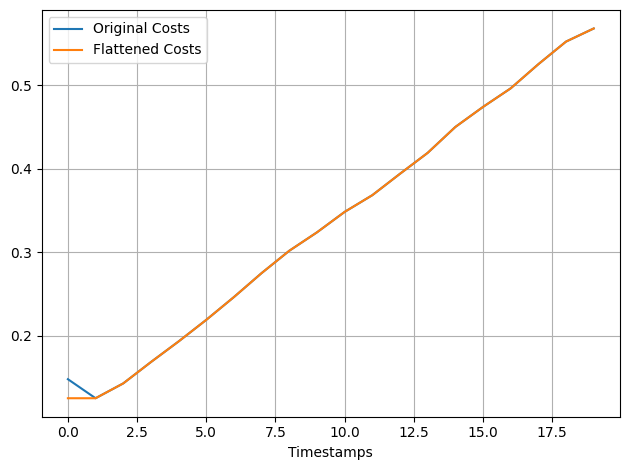

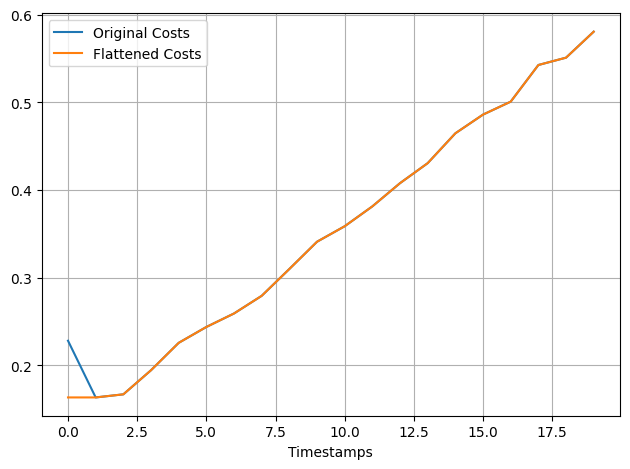

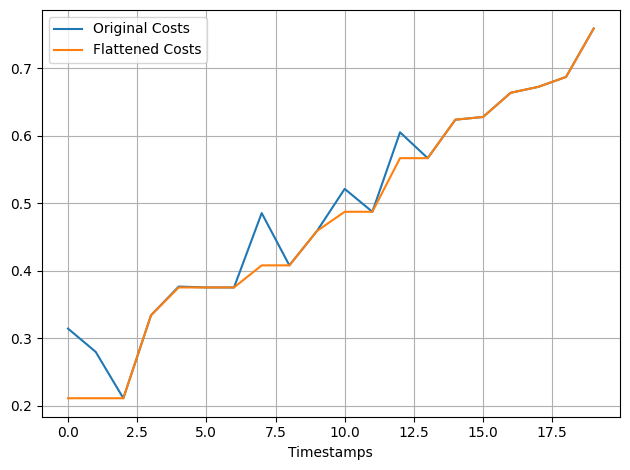

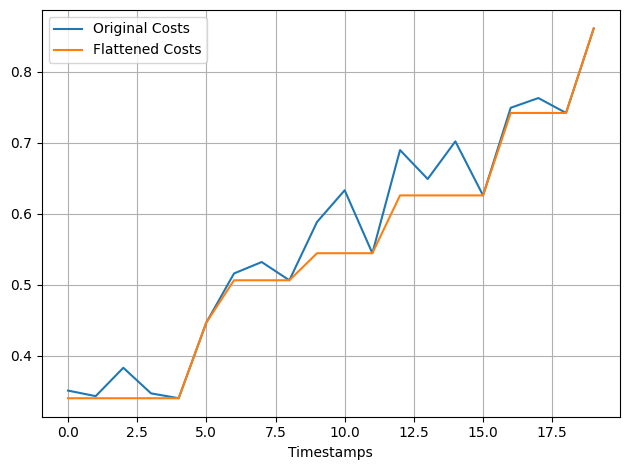

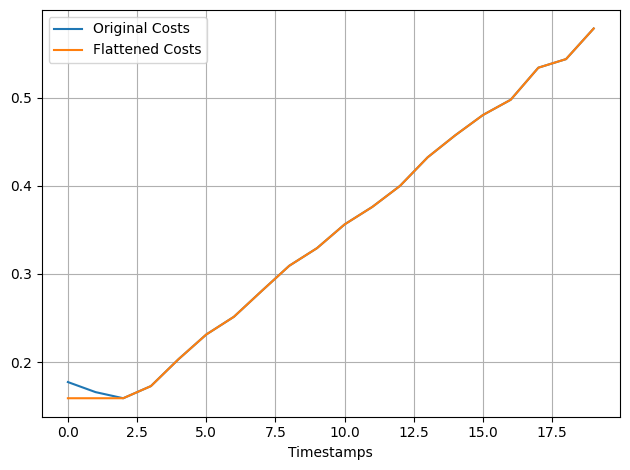

In [14]:
for i in range(5):
    plt.figure()    
    plt.plot(cal_basic.orig_costs[:,i],label='Original Costs')
    plt.plot(cal_basic.flat_costs[:,i],label='Flattened Costs')
    min_height_diff = 0.05 * (np.max((cal_basic.flat_costs[:,i])) - np.min((cal_basic.flat_costs[:,i])) )
    plt.xlabel('Timestamps')
    plt.grid()
    plt.legend()
    plt.tight_layout()
    
    plt.show()

In [ ]:
cal_basic = CALIMERA(timestamps,variant='true_label',n_jobs=-1)
early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)

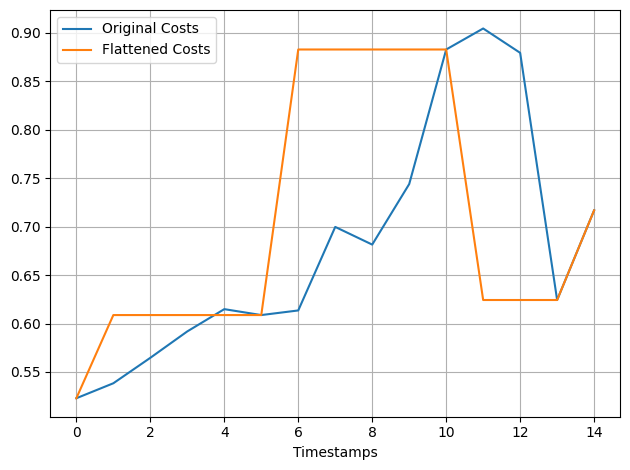

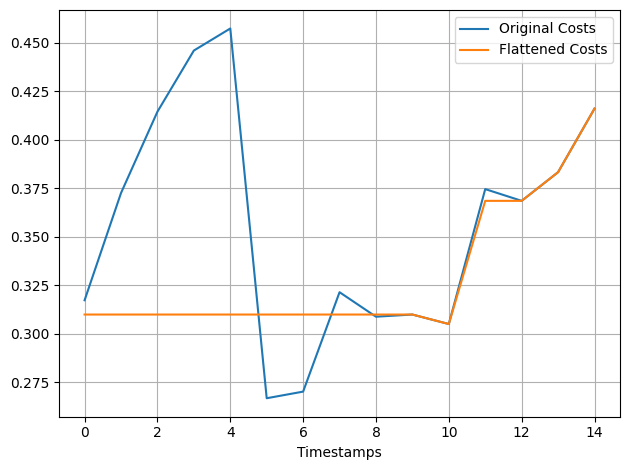

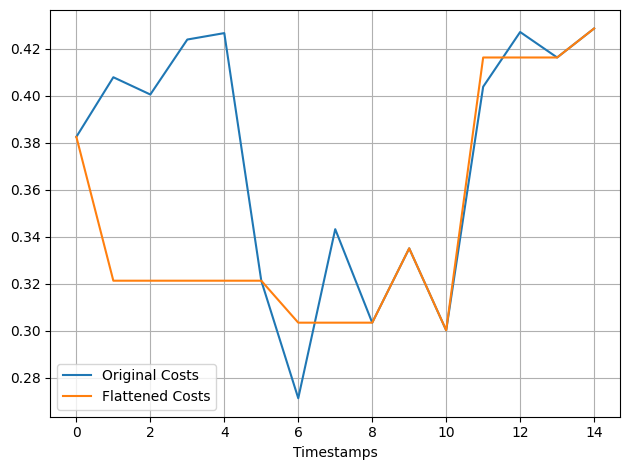

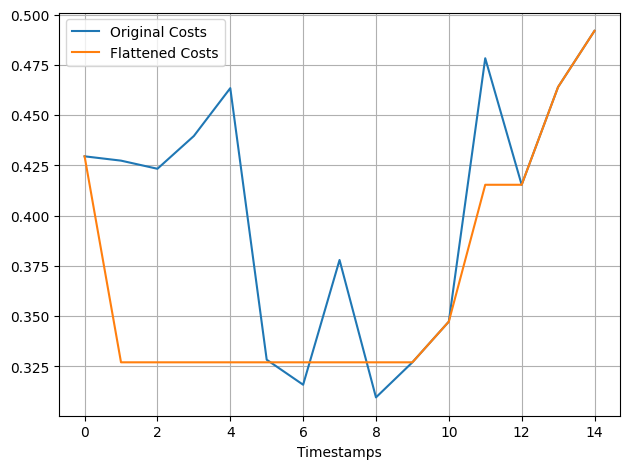

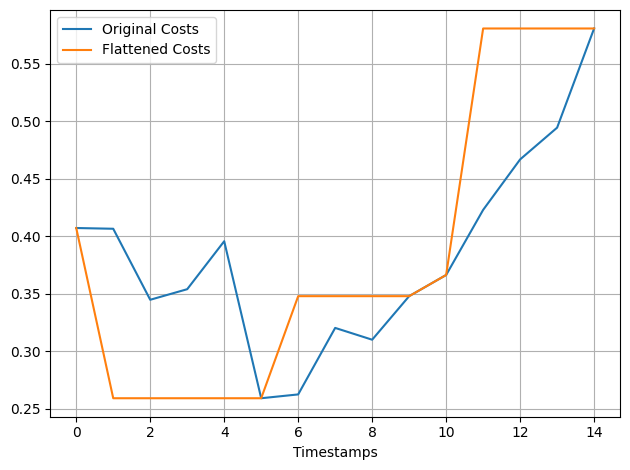

In [ ]:
for i in range(5):
    plt.figure()    
    plt.plot(cal_basic.orig_costs[:,i],label='Original Costs')
    plt.plot(cal_basic.flat_costs[:,i],label='Flattened Costs')
    min_height_diff = 0.05 * (np.max((cal_basic.flat_costs[:,i])) - np.min((cal_basic.flat_costs[:,i])) )


    

    plt.xlabel('Timestamps')
    plt.grid()
    plt.legend()
    plt.tight_layout()
    
    plt.show()

In [ ]:
cal_basic.opt_epsilon

0.0

In [ ]:
print(len(cal_basic.halters))

14


In [ ]:
print("Average cost: ", metrics_cal_basic['average_cost'])
print("Accuracy : ", metrics_cal_basic['accuracy'])
print("Earliness : ", metrics_cal_basic['earliness'])

Average cost:  0.4805333333333334
Accuracy :  0.47333333333333333
Earliness :  0.29600000000000004


In [ ]:

def get_test_costs(trigger_model, X, X_probas,timestamps, variant=None):
        
       
        X_timestamps = []
        for ts in X:
            diff = timestamps - len(ts)
            if 0 not in diff:
                truncated = True
                if (diff > 0).all(): # if ts smaller than all considered lengths
                    X_timestamps.append(0)
                else:
                    # replace bigger length by -inf and get smallest diff
                    time_idx = np.where(diff < 0, diff, -np.inf).argmax()
                    X_timestamps.append(timestamps[time_idx])
            else:
                # replace all non matching lengths by -inf and get index
                time_idx = np.where(diff == 0, diff, -np.inf).argmax()
                X_timestamps.append(timestamps[time_idx])


    
        costs_list=[]
        for i, probas in enumerate(X_probas):
        
            
            # if last timestamp is reached
            if X_timestamps[i] == timestamps[-1]:
                
                
                continue

            time_idx = np.where(X_timestamps[i] == timestamps)[0][0]
            if variant=='transpose':
                X_trigger, costs = trigger_model._generate_features_variant_transpose(probas[None,:], time_idx, 
                                                   np.zeros(X_probas.shape[0], dtype=int))
                                                   
            elif variant=='prior':
                X_trigger, costs = trigger_model._generate_features_variant_prior(probas[None,:], time_idx, 
                                                   np.zeros(X_probas.shape[0], dtype=int))
            elif variant=='corrected_prior':
                X_trigger, costs = trigger_model._generate_features_variant_corrected_prior(probas[None,:], time_idx, 
                                                   np.zeros(X_probas.shape[0], dtype=int))
            elif variant=='p_hat_p_hat':
                X_trigger, costs = trigger_model._generate_features_variant_p_hat_p_hat(probas[None,:], time_idx, 
                                                   np.zeros(X_probas.shape[0], dtype=int))
            elif variant=='true_label':
                X_trigger, costs = trigger_model._generate_features_variant_true_label(probas[None,:], time_idx, 
                                                   np.zeros(X_probas.shape[0], dtype=int))
            else:
                X_trigger, costs = trigger_model._generate_features(probas[None,:], time_idx, 
                                                   np.zeros(X_probas.shape[0], dtype=int))
            costs_list.append(float(costs))    
        
        return costs_list

In [ ]:
cal_basic = CALIMERA(timestamps,epsilon_method=True,n_jobs=-1)
early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
all_costs=[]
for t, l in enumerate(early_clf_cal_basic.timestamps):
    probas = early_clf_cal_basic.predict_proba(X_test[:,:l])
    costs= get_test_costs(cal_basic,X_test[:,:l], probas, early_clf_cal_basic.timestamps,None)
    all_costs.append(costs)


In [ ]:
print(timestamps)

[ 100  200  300  400  500  600  700  800  900 1000 1100 1200 1300 1400
 1500 1600 1700 1800 1900 2000]


In [ ]:
all_costs=np.array([ np.array(all_costs[i]) for i in range(len(all_costs)-1)])

In [ ]:
all_costs.shape

(19, 32)

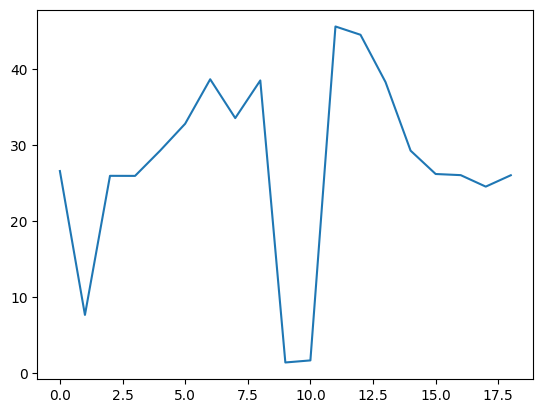

In [ ]:

plt.plot(all_costs[:,12], label = 'Original cost')
plt.show()


In [ ]:
cal_basic = CALIMERA(timestamps,target_swap=True, epsilon_method = True, flat=True,n_jobs=-1)

early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_basic['average_cost'])
print("Accuracy : ", metrics_cal_basic['accuracy'])
print("Earliness : ", metrics_cal_basic['earliness'])

Average cost:  2.898008626354801
Accuracy :  0.5688073394495413
Earliness :  0.46231926605504586


In [ ]:
cal_basic = CALIMERA(timestamps,target_swap=True,epsilon_method=True,var_ref_point=True,n_jobs=-1)

early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_basic['average_cost'])
print("Accuracy : ", metrics_cal_basic['accuracy'])
print("Earliness : ", metrics_cal_basic['earliness'])

Average cost:  0.3733333333333334
Accuracy :  0.32
Earliness :  0.06666666666666667


In [ ]:
cal_basic.orig_costs.shape

(20, 176)

In [ ]:
cal_basic.swaps.shape

(176, 19)

In [49]:
def detect_flat_regions(signal, threshold=1e-5, min_flat_length=1, min_height_diff=0.0):
       
        signal = np.asarray(signal)
        diff = np.abs(np.diff(signal))
        flat_mask = diff < threshold

        ref_points = []
        last_flat_value = None
        i = 0
        plateaus = [] # to store all indices of flat regions
        plateau_index= 0 # to store the index of the current plateau
        timestamps_plateaus = {}

        while i < len(flat_mask):
            if flat_mask[i]:
                plateau_index += 1
                timestamps_plateaus[i] = plateau_index

                start = i
                plateau=[start]
                while i < len(flat_mask) and flat_mask[i]:
                    i += 1
                    timestamps_plateaus[i] = plateau_index
                    plateau.append(i)
                end = i + 1  # tentative end of flat region
                if (i - start + 1) >= min_flat_length and i != len(signal) - 1:
                    flat_value = np.mean(signal[start:end])  # average value of flat region

                    if last_flat_value is None or abs(flat_value - last_flat_value) >= min_height_diff:
                        ref_points.append(end)
                        last_flat_value = flat_value
                    
                        plateaus.append(plateau)
                
            else:
                i += 1

        return plateaus, timestamps_plateaus,ref_points


In [40]:
cal_basic = CALIMERA(timestamps,var_true_plateau=True,target_swap=True,epsilon_method=True,n_jobs=-1)

early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_basic['average_cost'])
print("Accuracy : ", metrics_cal_basic['accuracy'])
print("Earliness : ", metrics_cal_basic['earliness'])

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

In [41]:
cal_basic.ref_points[0]

AttributeError: 'CALIMERA' object has no attribute 'ref_points'

In [ ]:
min(enumerate(cal_basic.ref_points[0]), key=lambda x: abs(9 - x[1]))[1]

8

In [50]:
cal_basic = CALIMERA(timestamps,n_jobs=-1)

early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_basic['average_cost'])
print("Accuracy : ", metrics_cal_basic['accuracy'])
print("Earliness : ", metrics_cal_basic['earliness'])

Average cost:  0.4346666666666666
Accuracy :  0.32
Earliness :  0.06666666666666667


[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
[[1, 2, 3, 4, 5, 6, 7, 8, 9]]
[[1, 2, 3, 4, 5, 6, 7, 8, 9]]
[[1, 2, 3, 4, 5, 6, 7, 8, 9]]


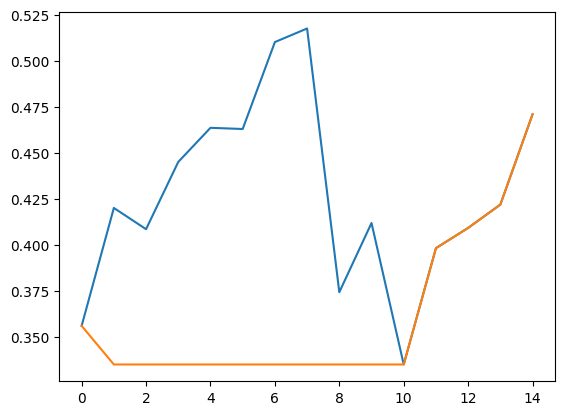

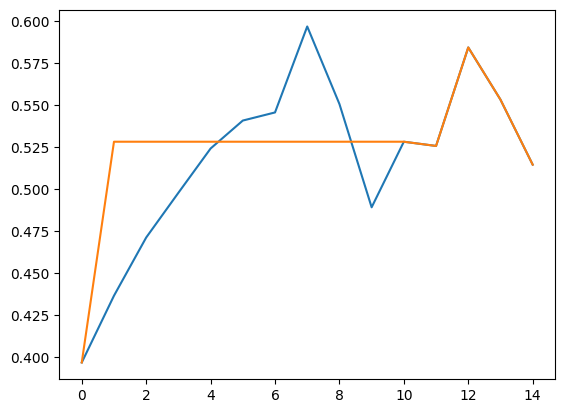

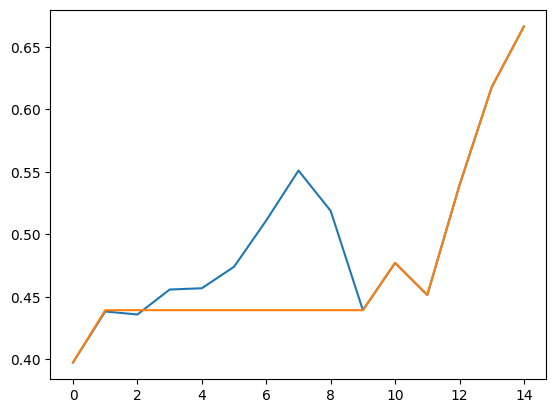

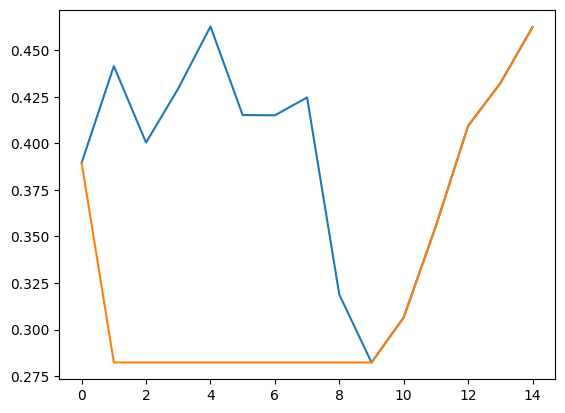

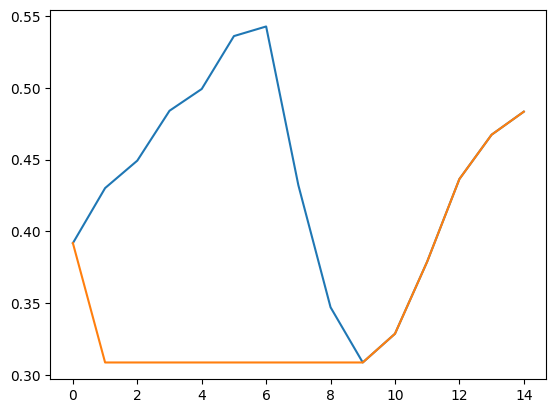

In [52]:
for i in range(5):
    plt.figure()    
    plt.plot(cal_basic.orig_costs[:,i],label='Original Costs')
    plt.plot(cal_basic.flat_costs[:,i],label='Flattened Costs')
    min_height_diff = 0.05 * (np.max((cal_basic.flat_costs[:,i])) - np.min((cal_basic.flat_costs[:,i])) )
    plateaus,_,_ = detect_flat_regions(cal_basic.flat_costs[:,i], min_flat_length=1, min_height_diff=min_height_diff)
    print(plateaus)

 


In [ ]:
y_triggers_arr =np.array(cal_basic.y_triggers)
y_triggers_arr[:,2]

array([ 1.41200222,  1.34930389,  1.72282724,  0.92796326,  0.93559843,
        0.01983198,  1.05406184,  1.19236172,  0.20968137, -0.21224135,
        0.61320981, -0.08042747,  0.09135923,  0.09542565, -8.9434284 ,
       -7.46592871, -5.07983448,  0.53175295, -6.88045661])

### CALIMERA Target Swap :

In [ ]:
cal_basic = CALIMERA(timestamps,n_jobs=-1,target_swap=True)
early_clf_cal_basic = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True,
    
)
early_clf_cal_basic.fit(X_trigger, y_trigger)
metrics_cal_basic = early_clf_cal_basic.score(X_test, y_test, return_metrics=True)

In [ ]:
cal_basic.orig_costs[:,0]

array([0.15676049, 0.16116188, 0.1481485 , 0.18538045, 0.18998573,
       0.23811989, 0.27971781, 0.32316737, 0.33427344, 0.34821849,
       0.41458848, 0.48963541, 0.45750785, 0.42530395, 0.52629214,
       0.57075366, 0.61121437, 0.64414875, 0.71664749, 0.74375555])

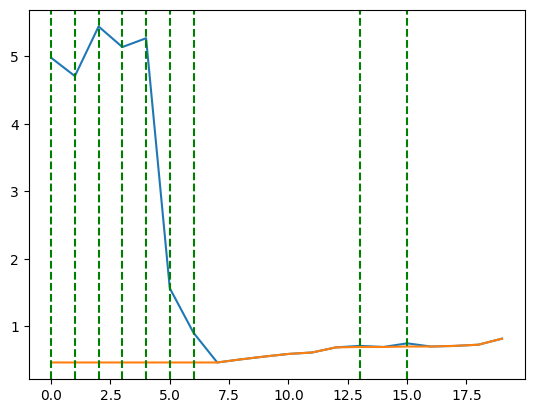

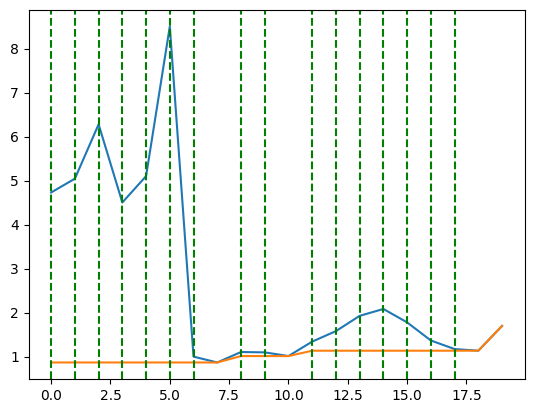

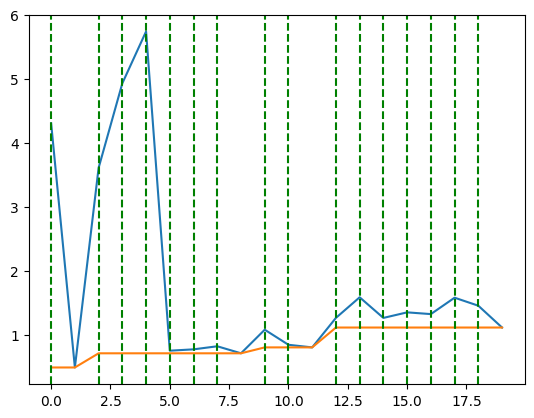

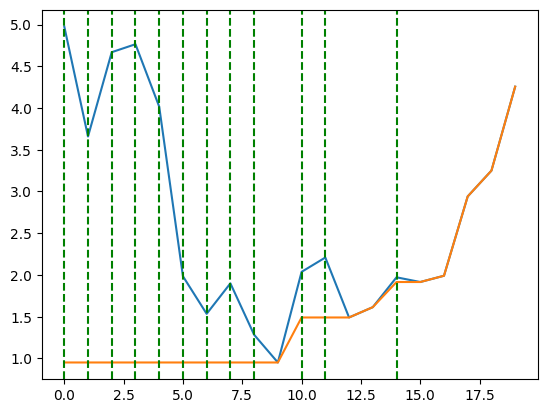

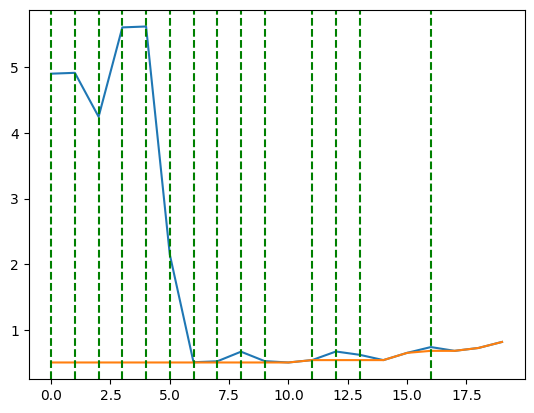

In [ ]:
for i in range(5):
    plt.figure()    
    plt.plot(cal_basic.orig_costs[:,i])
    plt.plot(cal_basic.flat_costs[:,i])
    for t in range(19):
        if cal_basic.swaps[i,t]==1:
            plt.axvline(x=t, color='green', linestyle='--', label='Applatissement')
    plt.show()

In [ ]:
cal_basic.flat_costs[:,3]

array([0.95178056, 0.95178056, 0.95178056, 0.95178056, 0.95178056,
       0.95178056, 0.95178056, 0.95178056, 0.95178056, 0.95178056,
       1.49086206, 1.49086206, 1.49086206, 1.61435291, 1.91557285,
       1.91557285, 1.99061924, 2.94112407, 3.2499237 , 4.25567919])

In [ ]:
diff = np.diff(cal_basic.flat_costs[:,3])

In [ ]:
diff

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.5390815 ,
       0.        , 0.        , 0.12349085, 0.30121994, 0.        ,
       0.07504639, 0.95050483, 0.30879963, 1.00575549])

In [ ]:
peaks,peak_plateaus = find_peaks(diff, plateau_size=1)

In [ ]:
peaks

array([ 9, 13, 16], dtype=int64)

In [ ]:
peak_plateaus

{'plateau_sizes': array([1, 1, 1], dtype=int64),
 'left_edges': array([ 9, 13, 16], dtype=int64),
 'right_edges': array([ 9, 13, 16], dtype=int64)}

In [ ]:
for i in range(len(peak_plateaus['plateau_sizes'])):
    if peak_plateaus['plateau_sizes'][i] > 1:
        print('a plateau of size %d is found' % peak_plateaus['plateau_sizes'][i])
        print('its left index is %d and right index is %d' % (peak_plateaus['left_edges'][i], peak_plateaus['right_edges'][i]))

a plateau of size 2 is found
its left index is 10 and right index is 11


In [ ]:
y_triggers_arr = np.array(cal_basic.y_triggers)
y_triggers_arr.shape

(19, 176)

In [ ]:
y_triggers_arr[:,0]

array([ 0.01316046,  0.08602159,  0.02271862,  0.03476075,  0.04116202,
        0.13160471, -0.08150264, -0.16288313, -0.07278444,  0.00343114,
       -0.00790035, -0.02010702,  0.01943586,  0.03658029,  0.04703826,
       -0.02260796,  0.00698677, -0.05079781, -0.07373199])

In [ ]:
y_triggers_arr[:,1]

array([ 0.0955879 ,  0.05057889, -0.12599171, -0.05076297, -0.11982075,
       -0.1123514 , -0.04934386, -0.0605772 ,  0.03166598, -0.00065607,
       -0.00052187,  0.03485907,  0.02883577, -0.05816138, -0.09376478,
       -0.09777988, -0.07145833,  0.12828701, -0.15938627])

In [ ]:
import json
def dump2json(metrics, file_path):
    """
    Dump metrics to a JSON file.
    
    Parameters:
    - metrics: Dictionary containing the metrics to be dumped.
    - filename: Name of the output JSON file.
    """
    # Prepare the results dictionary for JSON serialization
    results_to_dump = {
        "accuracy": float(metrics['accuracy']),
        "earliness": float(metrics['earliness']),
        "average_cost": float(metrics['average_cost']),
        "harmonic_mean": float(metrics['harmonic_mean']),
        "kappa": float(metrics['kappa']),
        "pred_t_star": metrics['pred_t_star'].tolist(),
        "t_star": metrics['t_star'].tolist(),
        "f_star": metrics['f_star'].tolist()
    }

    with open(file_path, 'w') as json_file:
        json.dump(results_to_dump, json_file, indent=4)
    print(f"Results have been successfully dumped to {file_path}.")




In [ ]:
dump2json(metrics_cal_basic, 'tests\\results_01_misclf_basic_calimera.json')

Results have been successfully dumped to tests\results_01_misclf_basic_calimera.json.


In [ ]:

def visualize_trigger_values_in_one_plot(y_triggers):
    plt.figure(figsize=(10, 5))
    for t in range(len(y_triggers)):
        plt.hist(y_triggers[t], alpha=0.7, label=f'Timestamp {t}')
    plt.xlabel('Trigger Value')
    plt.ylabel('Frequency')
    plt.title('Distribution of Trigger Values at Different Timestamps')
    plt.legend()
    plt.grid()
    plt.show()


In [ ]:
def visualize_trigger_values_grid(y_triggers, num_lines=3):
    """
    Visualize the distribution of trigger values in a grid layout.

    Parameters:
    - y_triggers: List of arrays containing trigger values for each timestamp.
    - num_lines: Number of rows in the grid layout.
    """
    num_timestamps = len(y_triggers)
    num_cols = (num_timestamps + num_lines - 1) // num_lines  # Calculate the number of columns

    # Determine global min and max for x-axis
    all_values = np.concatenate(y_triggers)
    global_min = np.min(all_values)
    global_max = np.max(all_values)

    # Set a consistent y-axis limit
    max_frequency = 0
    for t in range(num_timestamps):
        max_frequency = max(max_frequency, np.histogram(y_triggers[t], bins=30)[0].max())

    fig, axes = plt.subplots(num_lines, num_cols, figsize=(15, 5 * num_lines))
    axes = axes.flatten()  # Flatten the axes array for easier indexing

    for t in range(num_timestamps):
        axes[t].hist(y_triggers[t], bins=30, alpha=0.7, color='blue')
        axes[t].set_xlim(global_min, global_max)  # Set consistent x-axis limits
        axes[t].set_ylim(0, max_frequency)  # Set consistent y-axis limits
        axes[t].set_xlabel('Trigger Value')
        axes[t].set_ylabel('Frequency')
        axes[t].set_title(f'Trigger Values at Timestamp {t}')
        axes[t].grid()

    # Hide any unused subplots
    for t in range(num_timestamps, len(axes)):
        axes[t].axis('off')

    plt.tight_layout()
    plt.show()

### ----CALIMERA Epsilon :

In [ ]:
cal_basic_eps = CALIMERA(timestamps,n_jobs=-1,epsilon_method=True,cross_val='kfold',num_samples_eps=50)
early_clf_cal_basic_eps = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic_eps, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_cal_basic_eps.fit(X_trigger, y_trigger)
metrics_cal_basic_eps = early_clf_cal_basic_eps.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_basic_eps['average_cost'])
print("Accuracy : ", metrics_cal_basic_eps['accuracy'])
print("Earliness : ", metrics_cal_basic_eps['earliness'])

Average cost:  0.4117577981651377
Accuracy :  0.6467889908256881
Earliness :  0.47030458715596335


#### ----CALIMERA Epsilon Target swap :

In [ ]:
cal_basic_eps = CALIMERA(timestamps,n_jobs=-1,epsilon_method=True,cross_val='kfold',num_samples_eps=50,target_swap=True)
early_clf_cal_basic_eps = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic_eps, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_cal_basic_eps.fit(X_trigger, y_trigger)
metrics_cal_basic_eps = early_clf_cal_basic_eps.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_basic_eps['average_cost'])
print("Accuracy : ", metrics_cal_basic_eps['accuracy'])
print("Earliness : ", metrics_cal_basic_eps['earliness'])

Average cost:  0.21253002468580748
Accuracy :  0.6666666666666666
Earliness :  0.09172671603828174


In [ ]:

json_file_path = 'C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm\\tests\\pred_cost_diffs_dict_isotonic_500kde_with_0_default_split.json'

# Load the JSON data
with open(json_file_path, 'r') as file:
    pred_cost_diffs_dict = json.load(file)

In [ ]:
print(metrics_cal_basic_eps['pred_t_star'])

[1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1.
 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1.]


### ----CALIMERA Epsilon Calibration :

In [ ]:
cal_basic_eps_calib = CALIMERA(timestamps,n_jobs=-1,epsilon_method=True,cal_reg=True,eps_cal=True)
early_clf_cal_basic_eps_calib = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_basic_eps_calib, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_cal_basic_eps_calib.fit(X_trigger, y_trigger)
metrics_cal_basic_eps_calib = early_clf_cal_basic_eps_calib.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_basic_eps_calib['average_cost'])
print("Accuracy : ", metrics_cal_basic_eps_calib['accuracy'])
print("Earliness : ", metrics_cal_basic_eps_calib['earliness'])

KeyboardInterrupt: 

In [ ]:
cal_basic_eps_calib.opt_epsilons

NameError: name 'cal_basic_eps_calib' is not defined

#### ----CALIMERA True Label :

In [ ]:
cal_var_true_label=CALIMERA(timestamps,n_jobs=-1,variant='true_label')
early_clf_true_label = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_var_true_label, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_true_label.fit(X_trigger, y_trigger)
metrics_cal_var_true_label = early_clf_true_label.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_var_true_label['average_cost'])
print("Accuracy : ", metrics_cal_var_true_label['accuracy'])
print("Earliness : ",metrics_cal_var_true_label['earliness'])

Average cost:  0.12391921538263002
Accuracy :  0.8095238095238095
Earliness :  0.057362240289069555


#### ----CALIMERA True Label + Epsilon Cross Val

In [ ]:
cal_var_true_label_eps=CALIMERA(timestamps,n_jobs=-1,variant='true_label',epsilon_method=True,cross_val='kfold',num_samples_eps=100)
early_clf_true_label_eps = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_var_true_label_eps, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_true_label_eps.fit(X_trigger, y_trigger)
metrics_cal_var_true_label_eps = early_clf_true_label_eps.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_var_true_label_eps['average_cost'])
print("Accuracy : ", metrics_cal_var_true_label_eps['accuracy'])
print("Earliness : ",metrics_cal_var_true_label_eps['earliness'])

Average cost:  0.12630245734100967
Accuracy :  0.798941798941799
Earliness :  0.05154671362381826


#### ----CALIMERA True Label + Epsilon + CALIBRATION

In [ ]:
cal_var_true_label_eps=CALIMERA(timestamps,n_jobs=-1,variant='true_label',epsilon_method=True,cal_reg=True,eps_cal=True)
early_clf_true_label_eps = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_var_true_label_eps, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_true_label_eps.fit(X_trigger, y_trigger)
metrics_cal_var_true_label_eps = early_clf_true_label_eps.score(X_test, y_test, return_metrics=True)
print("Average cost: ", metrics_cal_var_true_label_eps['average_cost'])
print("Accuracy : ", metrics_cal_var_true_label_eps['accuracy'])
print("Earliness : ",metrics_cal_var_true_label_eps['earliness'])

[0.43202532 0.65240506]
[0.67866184 1.        ]
[0.18818565 1.        ]
[0.26244726 0.73075205]
[0.31714614 1.        ]
[0.01265823 0.84      ]
[0.0835443 1.       ]
[0.03797468 1.        ]
[0.52658228 1.        ]
[0.63544304 1.        ]
[0.01265823 0.98767932]
[0.01265823 0.63341772]
[0.01265823 0.25189873]
[0.01265823 1.        ]
[0.01265823 1.        ]
[0.25506329 0.81139241]
[0.01265823 0.20548523]
[0.80506329 1.        ]
[0.01265823 0.47482419]
Average cost:  0.19958350505164033
Accuracy :  0.6507936507936508
Earliness :  0.04996066089693155


In [ ]:
cal_var_true_label_eps.opt_epsilons

[0.03245421421616854,
 0.046264560635691614,
 0.0437657010111363,
 0.027741627266212432,
 0.04257589179928514,
 0.03659359521133243,
 0.024455058116407104,
 0.03442863614177872,
 0.050739585521850775,
 0.047817222636622886,
 0.03559262487946764,
 0.014142518254985588,
 0.010957053710561276,
 0.040675976604802634,
 0.032457388011209586,
 0.03353793797136083,
 0.0,
 0.0594265203141711,
 0.010987345376526906]

#### ----CALIMERA Variant $\hat{P} - \hat{P} $

In [ ]:
cal_var_p_hat_p_hat=CALIMERA(timestamps_smooth,n_jobs=-1,variant='p_hat_p_hat')
early_clf_p_hat_p_hat = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_var_p_hat_p_hat, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_p_hat_p_hat.fit(X_trigger_smooth, y_trigger_smooth)
metrics_cal_var_p_hat_p_hat = early_clf_p_hat_p_hat.score(X_test_smooth, y_test_smooth, return_metrics=True)
print("Average cost: ", metrics_cal_var_p_hat_p_hat['average_cost'])
print("Accuracy : ", metrics_cal_var_p_hat_p_hat['accuracy'])
print("Earliness : ", metrics_cal_var_p_hat_p_hat['earliness'])

Average cost:  0.3250000000000001
Accuracy :  0.4166666666666667
Earliness :  0.06666666666666667


In [ ]:
# Dump the results to a JSON file
dump2json(metrics_cal_var_p_hat_p_hat, 'tests\\results_01_misclf_var_p_hat_p_hat.json')

Results have been successfully dumped to tests\results_01_misclf_var_p_hat_p_hat.json.


#### ----CALIMERA Variant Transpose

In [ ]:
cal_var_transpose=CALIMERA(timestamps_smooth,n_jobs=-1,variant='transpose')
early_clf_var_transpose = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_var_transpose, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_var_transpose.fit(X_trigger_smooth, y_trigger_smooth)
metrics_cal_var_transpose = early_clf_var_transpose.score(X_test_smooth, y_test_smooth, return_metrics=True)
print("Average cost: ", metrics_cal_var_transpose['average_cost'])
print("Accuracy : ", metrics_cal_var_transpose['accuracy'])
print("Earliness : ", metrics_cal_var_transpose['earliness'])

Average cost:  0.3250000000000001
Accuracy :  0.4166666666666667
Earliness :  0.06666666666666667


In [ ]:
# Dump the results to a JSON file
dump2json(metrics_cal_var_transpose, 'tests\\results_01_misclf_var_transpose.json')


Results have been successfully dumped to tests\results_01_misclf_var_transpose.json.


#### ----CALIMERA Variant Corrected Prior:

In [ ]:
cal_var_prior =CALIMERA(timestamps_smooth,n_jobs=-1,variant='corrected_prior')
early_clf_var_prior = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=cal_var_prior, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_var_prior.fit(X_trigger_smooth, y_trigger_smooth)
metrics_cal_var_prior = early_clf_var_prior.score(X_test_smooth, y_test_smooth, return_metrics=True)
print("Average cost: ", metrics_cal_var_prior['average_cost'])
print("Accuracy : ", metrics_cal_var_prior['accuracy'])
print("Earliness : ", metrics_cal_var_prior['earliness'])

Average cost:  0.2833333333333333
Accuracy :  0.5666666666666667
Earliness :  0.13333333333333333


#### ----ECONOMY $\gamma$

In [ ]:
economy_gamma = EconomyGamma(timestamps_smooth,n_jobs=-1)
early_clf_eco_gamma = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=economy_gamma, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_eco_gamma.fit(X_trigger_smooth, y_trigger_smooth)
metrics_eco_gamma = early_clf_eco_gamma.score(X_test_smooth, y_test_smooth, return_metrics=True)
print("Average cost: ", metrics_eco_gamma['average_cost'])
print("Accuracy : ", metrics_eco_gamma['accuracy'])
print("Earliness : ", metrics_eco_gamma['earliness'])

Average cost:  0.2983333333333334
Accuracy :  0.6
Earliness :  0.19666666666666668


In [ ]:
# Dump the results to a JSON file
dump2json(metrics_eco_gamma, 'tests\\results_01_misclf_economy_gamma.json')

Results have been successfully dumped to tests\results_01_misclf_economy_gamma.json.


#### ----PROBABILITY THRESHOLD

In [ ]:
proba_thresh =ProbabilityThreshold(timestamps_smooth,n_jobs=-1)
early_clf_proba_thresh = EarlyClassifier(
    chronological_classifiers=collection_clf, 
    trigger_model=proba_thresh, 
    cost_matrices=cost_matrices,
    prefit_classifiers=True
)
early_clf_proba_thresh.fit(X_trigger_smooth, y_trigger_smooth)
metrics_proba_thresh = early_clf_proba_thresh.score(X_test_smooth, y_test_smooth, return_metrics=True)
print("Average cost: ", metrics_proba_thresh['average_cost'])
print("Accuracy : ", metrics_proba_thresh['accuracy'])
print("Earliness : ", metrics_proba_thresh['earliness'])

Average cost:  0.32388888888888895
Accuracy :  0.45
Earliness :  0.09777777777777777


In [ ]:
# Dump the results to a JSON file
dump2json(metrics_proba_thresh, 'tests\\results_01_misclf_proba_thresh.json')

Results have been successfully dumped to tests\results_01_misclf_proba_thresh.json.


### Plots trigger timestamps with CALIMERA for $\alpha=0.5$

In [ ]:
def plot_trigger(results, axes):
    colors = itertools.cycle(plt.cm.tab10.colors)
    
    mean_preds, preds = [], []
    for i, cls in enumerate(classes_alu):
        triggers_c = results['t_star'][y_test_alu==cls]
        preds_c = results['pred_t_star'][y_test_alu==cls]
        series_c = X_test_alu[y_test_alu==cls]

        c = next(colors)
        mean_preds.append(axes[i].axvline(np.mean(triggers_c)-1, ls="--", c="red"))
        pred_cls = []
        #axes[i].hist(triggers_c-1, density=True, color="red", alpha=0.5)
        for j, serie in enumerate(series_c):
            cc = "green" if preds_c[j] == cls else "red"
            ts = axes[i].plot(serie, color=c, alpha=0.8, lw=1, 
                              label=f"Class no {cls}" if j == 0 else "")
            pred_cls.append(axes[i].plot(triggers_c[j]-1, serie[triggers_c[j].astype(int)-1], 
                                      marker="o", c=cc, ms=8))
            if j == 0:
                axes[i].legend()
        preds.append(pred_cls)

    plt.xlabel("timestamps")
    title = axes[0].text(0.25, 1.1, r"$\alpha = {}$".format(ALPHA), 
                         bbox={'facecolor':'w', 'alpha':0.5, 'pad':5}, 
                         transform=axes[0].transAxes, ha="center", fontsize=15)

    return (ts, mean_preds, preds, title)

In [ ]:
def train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha,timestamps, clf, misclf_cost,trigger,delay_cost=None):
    n_classes= misclf_cost.shape[0]
    

    cost_matrices = CostMatrices(
        timestamps=timestamps, 
        n_classes=n_classes, 
        misclf_cost=misclf_cost,
        alpha=alpha,
        delay_cost=delay_cost
    )
   
    
    # define early classifier 
    early_clf = EarlyClassifier(
        chronological_classifiers=clf, 
        trigger_model=trigger, 
        cost_matrices=cost_matrices, 
        prefit_classifiers=True
    )   
    early_clf.fit(X_trigger, y_trigger)

    return early_clf.score(X_test, y_test, return_metrics=True)

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


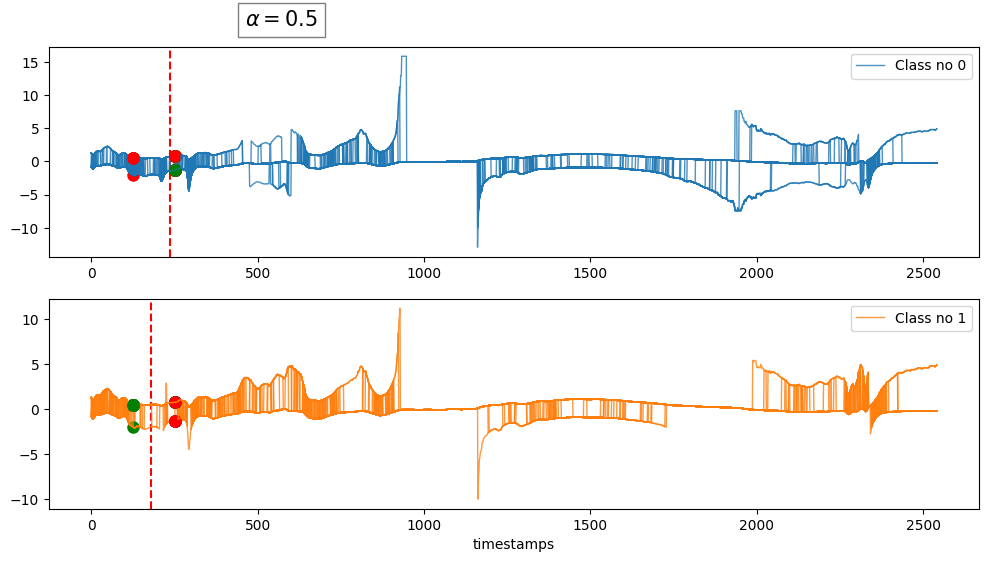

In [ ]:
misclf_cost = 1 - np.eye(len(classes_alu))

trigger = CALIMERA(timestamps_alu,n_jobs=-1)
metrics_one_zero_misclf = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5,timestamps_alu, collection_clf,misclf_cost, trigger)
_, axes = plt.subplots(nrows=len(classes_alu), ncols=1, figsize=(12,6))
ts, mean_preds, preds, title = plot_trigger(metrics_one_zero_misclf, axes)

## Plot trigger timestamps with CALIMERA for different values of $\alpha$ between 0 and 1

In [148]:

filterwarnings("ignore")

fi, ax = plt.subplots(nrows=len(classes_alu), ncols=1, figsize=(12,6))

alphas = np.linspace(0, 1, 10)
res = dict.fromkeys(alphas)

for i, alph in enumerate(alphas):
    trigger = CALIMERA(timestamps_alu,n_jobs=-1)
    res[alph] = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,alph,timestamps_alu, collection_clf,misclf_cost, trigger)
    
    if i == 0: # generate first frame of the animation 
        ts, mean_preds, points, title = plot_trigger(res[alph], ax)
        plt.close()




In [149]:


# function that uptade trigger points on the animation 
def update(frame):
    alph = alphas[frame]
    metrics = res[alph]

    for i, cls in enumerate(classes_alu):
        triggers_cls = metrics['t_star'][y_test_alu==cls]
        preds_cls = metrics['pred_t_star'][y_test_alu==cls]
        
        mean_preds[i].set_xdata(np.array([np.mean(triggers_cls - 1)]))
        for j, serie in enumerate(X_test_alu[y_test_alu == cls]):
            cc = "green" if preds_cls[j] == cls else "red"

            points[i][j][0].set_xdata([triggers_cls[j]-1])
            points[i][j][0].set_ydata([serie[triggers_cls[j].astype(int)-1]])
            points[i][j][0].set_color(cc)

    preds = [line[0] for lines in points for line in lines]
    title.set_text(r"$\alpha = {:.3f}$".format(alph))
    updated=mean_preds + preds + [title]
    return updated


ani = anim.FuncAnimation(fi, func=update, frames=len(alphas),
                         interval=900, blit=True, repeat_delay=1000)

HTML(ani.to_jshtml())

### Plot Average Cost w.r.t $\alpha$ for Aluminium Concentration dataset :

In [4]:
def plot_avg_cost_wrt_alphas(collection_clf,misclf_cost,alphas,timestamps=timestamps_alu):
    """
    Plot the average cost of the trigger with respect to different alpha values.
    """

    
    avg_costs_calimera = []
    avg_costs_calimera_var_p_hat_p_hat = []
    avg_costs_calimera_var_transpose = []
    avg_costs_calimera_var_prior = []
    avg_costs_proba_thresh = []
    avg_costs_economy_gamma = []

    for alpha in alphas:
        metrics_calimera =  train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,alpha,timestamps_alu, collection_clf,misclf_cost, CALIMERA(timestamps,n_jobs=-1))
        metrics_calimera_var_p_hat_p_hat = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,alpha,timestamps_alu, collection_clf,misclf_cost, CALIMERA(timestamps,n_jobs=-1,variant='p_hat_p_hat'))
        metrics_calimera_var_transpose = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,alpha,timestamps_alu, collection_clf,misclf_cost, CALIMERA(timestamps,n_jobs=-1,variant='transpose'))
        metrics_calimera_var_prior = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,alpha,timestamps_alu, collection_clf,misclf_cost, CALIMERA(timestamps,n_jobs=-1,variant='corrected_prior'))
        metrics_economy_gamma = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,alpha,timestamps_alu, collection_clf,misclf_cost, EconomyGamma(timestamps,n_jobs=-1))
        metrics_proba_thresh = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,alpha,timestamps_alu, collection_clf,misclf_cost,  ProbabilityThreshold(timestamps,n_jobs=-1))

        # Store the average costs for each method
        

        avg_costs_calimera.append(metrics_calimera['average_cost'])
        avg_costs_calimera_var_p_hat_p_hat.append(metrics_calimera_var_p_hat_p_hat['average_cost'])
        avg_costs_calimera_var_transpose.append(metrics_calimera_var_transpose['average_cost'])
        avg_costs_calimera_var_prior.append(metrics_calimera_var_prior['average_cost'])
        avg_costs_proba_thresh.append(metrics_proba_thresh['average_cost'])
       
        avg_costs_economy_gamma.append(metrics_economy_gamma['average_cost'])
    plt.figure(figsize=(10, 6))
    plt.plot(alphas, avg_costs_calimera, label='CALIMERA', marker='o')
    plt.plot(alphas, avg_costs_calimera_var_p_hat_p_hat, label='CALIMERA_var_p_hat_p_hat', marker='s')
    plt.plot(alphas, avg_costs_calimera_var_transpose, label='CALIMERA_var_transpose', marker='*')
    plt.plot(alphas, avg_costs_calimera_var_prior, label='CALIMERA_var_prior', marker='x')
    plt.plot(alphas, avg_costs_proba_thresh, label='Probability Threshold', marker='^')
    plt.plot(alphas, avg_costs_economy_gamma, label='EconomyGamma', marker='+')
    plt.xlabel('Alpha')
    plt.ylabel('Average Cost')
    plt.title('Average Cost vs Alpha')
    plt.legend()
    plt.grid()
    plt.show()


NameError: name 'timestamps_alu' is not defined

### Plot Average Cost w.r.t $\alpha$ for the 3 datasets

In [6]:
def get_avg_cost_over_datasets_wrt_alphas(alphas, eps_global_minima=0,clf_type='rocket',clf_method='sigmoid',cross_val='kfold',datasets = ['EOGVerticalSignal', 'HouseholdPowerConsumption1', 'AluminiumConcentration'],misclf_cost='default'):
   
    avg_costs = {'CAL':{dataset : [] for dataset in datasets},
                'CAL_true_label':{dataset :[] for dataset in datasets},
                'CAL_eps':{dataset :[] for dataset in datasets},
                'CAL_one_reg':{dataset :[] for dataset in datasets},
                'CAL_true_label_eps':{dataset : [] for dataset in datasets },
                'CAL_true_label_one_reg':{dataset : [] for dataset in datasets},
                'ProbabilityThreshold':{dataset :[] for dataset in datasets}}
       
       
                        
    for dataset in datasets :
        print(f"Processing dataset: {dataset}")
        if misclf_cost == 'default':
            data_dict=load_dataset(dataset, split='default',unb=False, z_normalize=True)
        else:
            data_dict=load_dataset(dataset, split='default',unb=True, z_normalize=True)
        X_train = data_dict['X_train']
        y_train = data_dict['y_train']
        X_test = data_dict['X_test']
        y_test = data_dict['y_test']
        X_classif, X_trigger, y_classif, y_trigger = train_test_split(X_train, y_train, test_size=0.4, random_state=44)
        sampling_ratio = 0.05
        max_T = X_train.shape[1] 
        timestamps = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
        # delete potential duplicates, O's
        timestamps = check_timestamps(timestamps)
        """if clf_type=='rocket' and clf_method=='isotonic':
            collection_clf = ClassifiersCollection(
            base_classifier=MiniRocketClassifier(n_jobs=-1),
            timestamps=timestamps,
            cv_method='isotonic'
            )
        elif clf_type=='rocket' and clf_method=='sigmoid':
            collection_clf = ClassifiersCollection(
            base_classifier=MiniRocketClassifier(n_jobs=-1),
            timestamps=timestamps,
            cv_method='sigmoid'
            )
        elif clf_type=='ridge' and clf_method=='isotonic':
            clf = make_pipeline(
            SplineTransformer(),
            CalibratedClassifierCV(RidgeClassifierCV(), method="isotonic")
            )
            collection_clf = ClassifiersCollection(
            base_classifier=clf,
            timestamps=timestamps,

            calibration=False
            )
        else:
            clf = make_pipeline(
            SplineTransformer(),
            CalibratedClassifierCV(RidgeClassifierCV(), method="sigmoid")
            )
            collection_clf = ClassifiersCollection(
            base_classifier=clf,
            timestamps=timestamps,

            calibration=False
            )"""
        collection_clf = ClassifiersCollection(
        base_classifier=RidgeClassifierCV(),
        feature_extraction={"method": "minirocket", "path": "models/", "params": {"random_state":42, "n_jobs": -1}},
        timestamps=timestamps,
        cv_method='sigmoid' 
        )
       


       


        
        collection_clf.fit(X_classif, y_classif)
        classes, counts = np.unique(y_train, return_counts=True)
        
        # check if non-zero misclassification cost is given
        
        if misclf_cost == 'default':
            misclf_cost_mat = 1 - np.eye(len(classes)) 
            Parallel(n_jobs=1, backend='multiprocessing')(delayed(process_dataset_fixed_alpha)(avg_costs, dataset, X_test, y_test, X_trigger, y_trigger, timestamps, collection_clf, misclf_cost_mat, alpha,eps_global_minima,None,cross_val) for alpha in alphas)
            print(f"Dataset {dataset} processed.")
        else:
            small_values = 1
            misclf_cost_mat = small_values - np.eye(len(classes)) * small_values

            idx_min_class = classes[counts.argmin()]
            misclf_cost_mat[:, idx_min_class] *= 100
            def delay_cost(t):
                inflexion_point = 0
                return np.exp(((t/X_train.shape[1])-inflexion_point) * np.log(100))

            Parallel(n_jobs=1, backend='multiprocessing')(delayed(process_dataset_fixed_alpha)(avg_costs, dataset, X_test, y_test, X_trigger, y_trigger, timestamps, collection_clf, misclf_cost_mat, alpha,eps_global_minima,delay_cost,cross_val) for alpha in alphas)
            print(f"Dataset {dataset} processed.")
            
            
        

       
    
    return avg_costs

def process_dataset_fixed_alpha(avg_costs, dataset, X_test, y_test, X_trigger, y_trigger, timestamps, collection_clf, misclf_cost_mat, alpha,eps_global_minima=0,delay_cost=None,cross_val='kfold'):
    
    # Train and evaluate the early classifier with different methods
    
    metrics = train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha,timestamps, collection_clf, misclf_cost_mat, CALIMERA(timestamps,n_jobs=-1),delay_cost=delay_cost)
    avg_costs['CAL'][dataset].append( metrics['average_cost'])
    
    metrics = train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha,timestamps, collection_clf, misclf_cost_mat,  CALIMERA(timestamps, epsilon_method = True,n_jobs=-1,cross_val=cross_val),delay_cost=delay_cost)
    avg_costs['CAL_eps'][dataset].append(metrics['average_cost'])

    metrics = train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha,timestamps, collection_clf, misclf_cost_mat,  CALIMERA(timestamps, n_jobs=-1,cross_val=cross_val,regressor='one'),delay_cost=delay_cost)
    avg_costs['CAL_one_reg'][dataset].append(metrics['average_cost'])


    
    
    metrics = train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha, timestamps,collection_clf, misclf_cost_mat,CALIMERA(timestamps, n_jobs=-1,variant='true_label'),delay_cost=delay_cost)
    avg_costs['CAL_true_label'][dataset].append(metrics['average_cost'])
    
    metrics = train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha,timestamps, collection_clf, misclf_cost_mat,  CALIMERA(timestamps, n_jobs=-1,variant='true_label',epsilon_method=True,cross_val=cross_val),delay_cost=delay_cost)
    avg_costs['CAL_true_label_eps'][dataset].append(metrics['average_cost'])

    metrics = train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha,timestamps, collection_clf, misclf_cost_mat,  CALIMERA(timestamps, n_jobs=-1,cross_val=cross_val,regressor='one',variant='true_label'),delay_cost=delay_cost)
    avg_costs['CAL_true_label_one_reg'][dataset].append(metrics['average_cost'])


    
    metrics = train_early_classifier(X_trigger,y_trigger,X_test,y_test,alpha,timestamps, collection_clf, misclf_cost_mat, ProbabilityThreshold(timestamps,n_jobs=-1),delay_cost=delay_cost)
    avg_costs['ProbabilityThreshold'][dataset].append(metrics['average_cost'])


In [17]:
import numpy
from scipy.signal import find_peaks

test = numpy.random.uniform(0.9, 1.0, 100)
test[10 : 20] = 0
peaks, peak_plateaus = find_peaks(- test, plateau_size = 2)

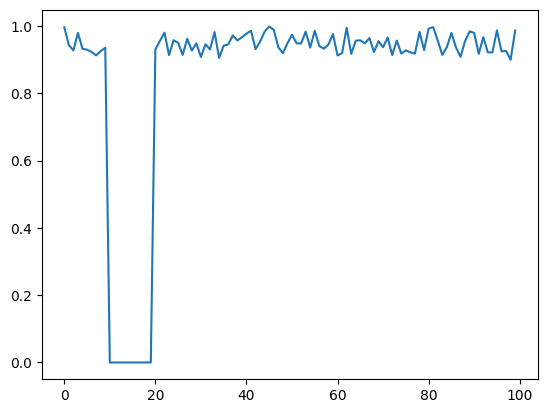

In [18]:
plt.plot(test)

In [19]:
peaks

array([14], dtype=int64)

In [20]:
peak_plateaus

{'plateau_sizes': array([10], dtype=int64),
 'left_edges': array([10], dtype=int64),
 'right_edges': array([19], dtype=int64)}

In [9]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"],misclf_cost='default')

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.


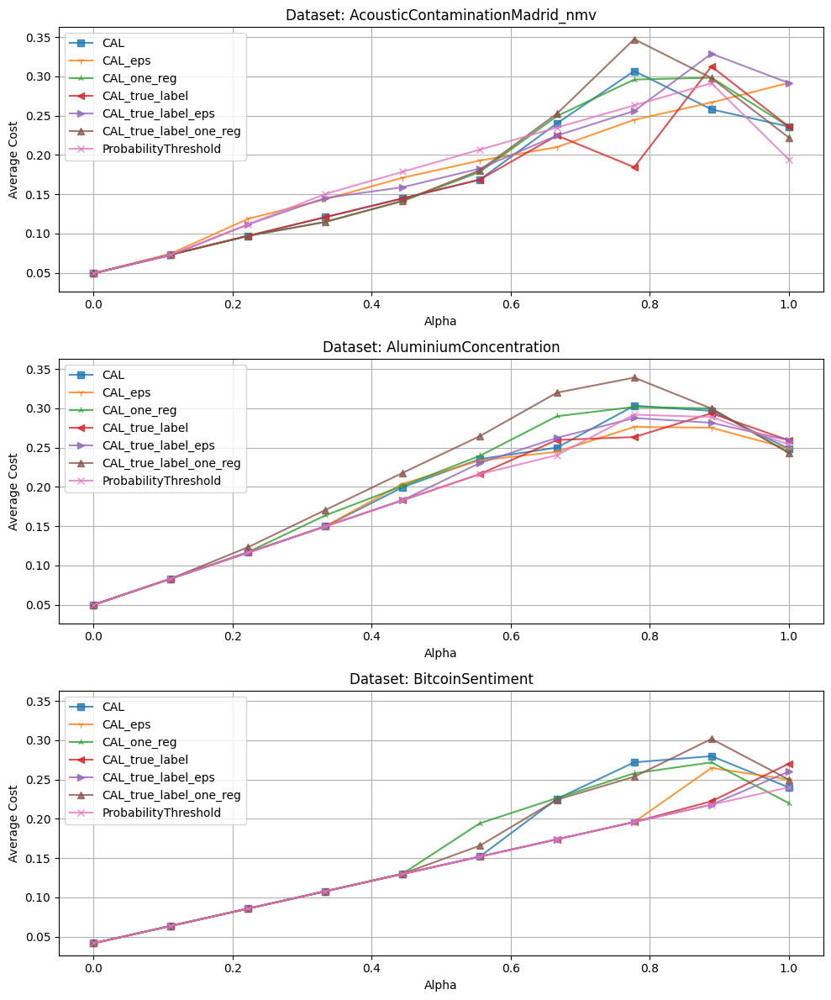

In [11]:
plot_avg_cost_per_dataset(avg_costs,alphas, datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"])

In [5]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"],misclf_cost='unb')

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.


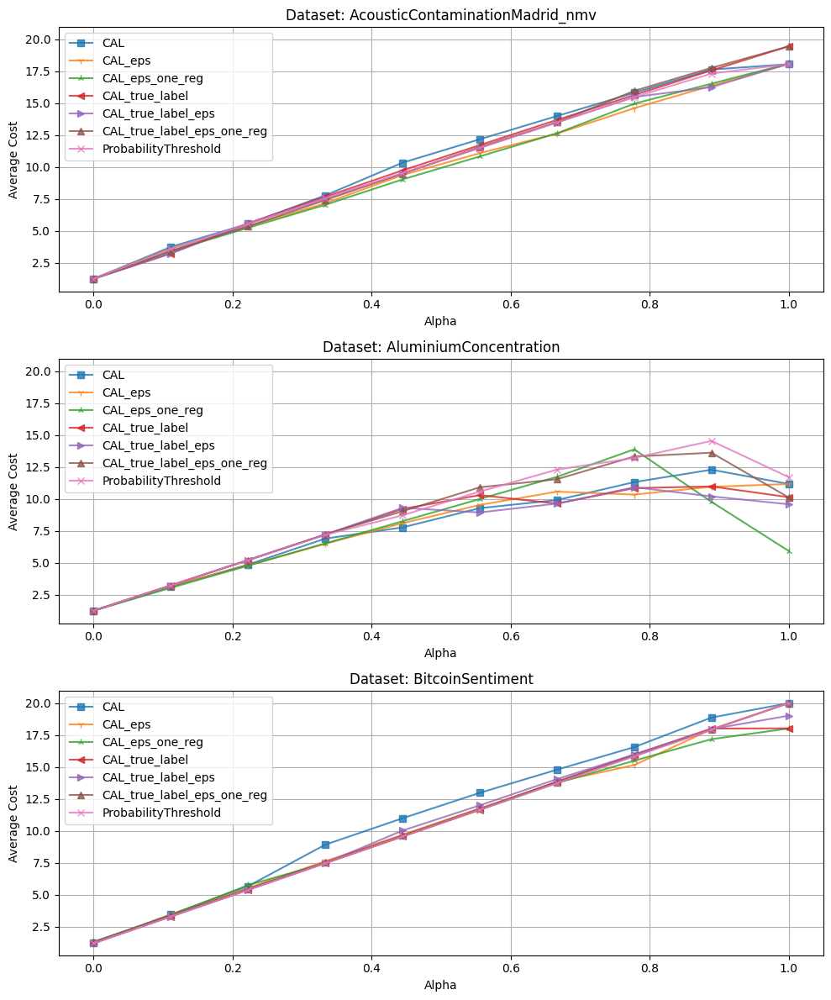

In [7]:
plot_avg_cost_per_dataset(avg_costs,alphas, datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"])

### Standard Cross Val (50 points)

In [14]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"],misclf_cost='unb')

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.


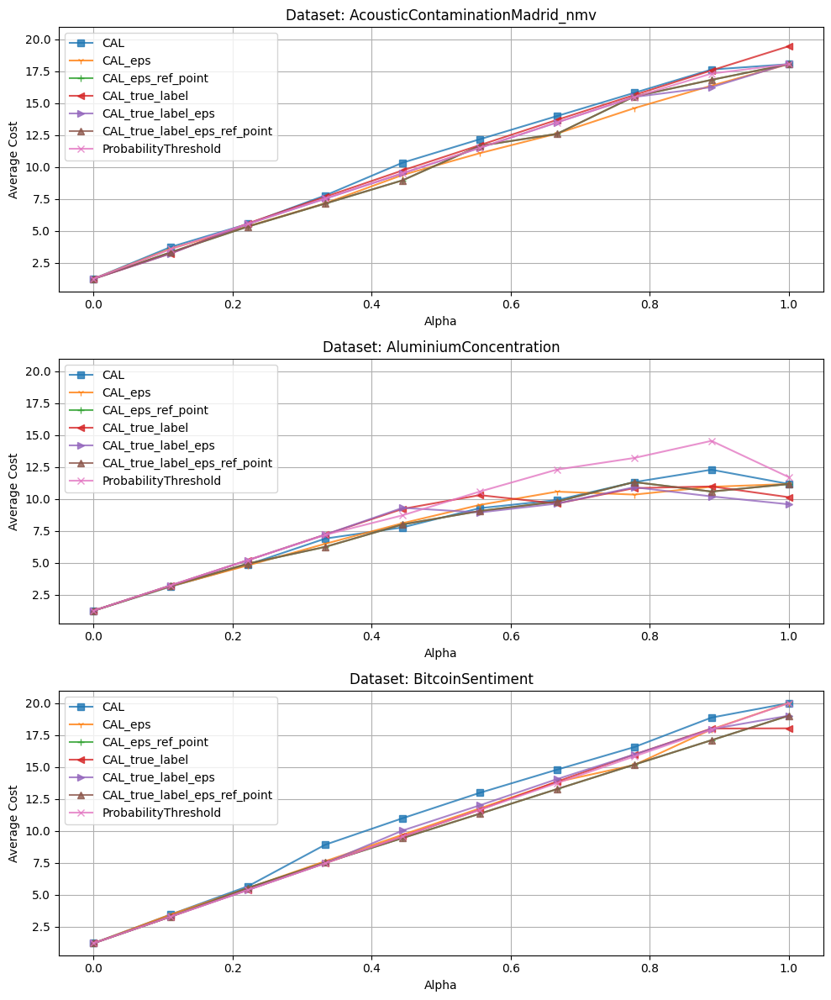

In [16]:
plot_avg_cost_per_dataset(avg_costs,alphas, datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"])

In [17]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"])

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.


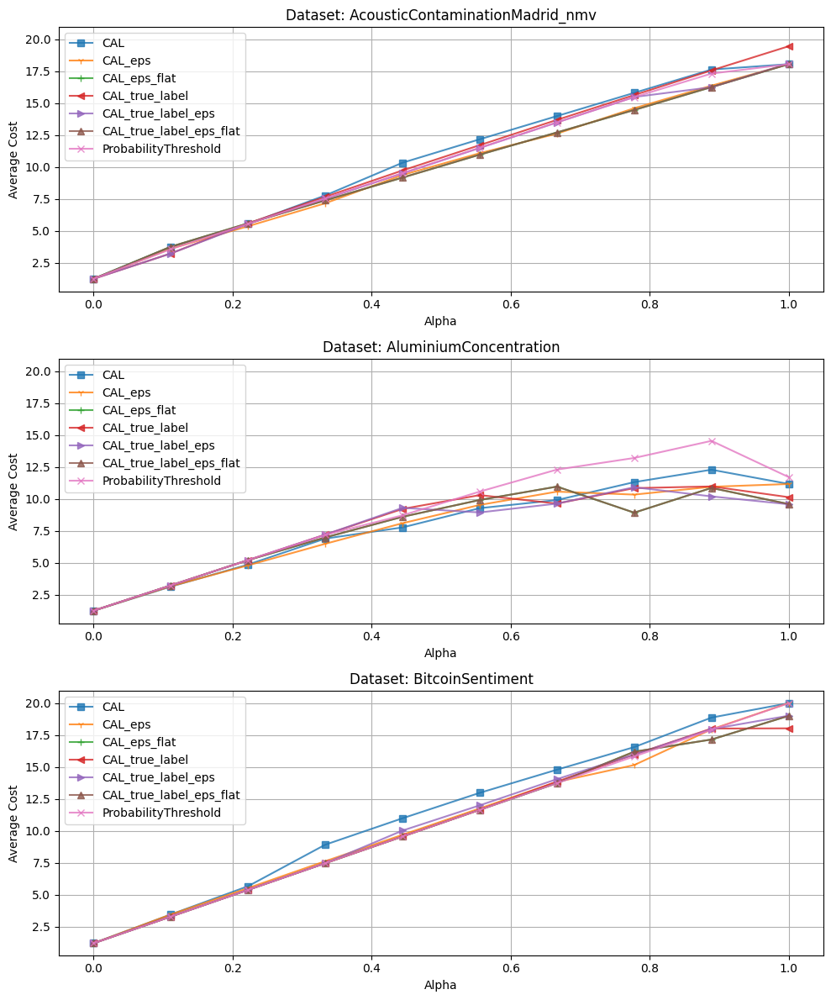

In [16]:
plot_avg_cost_per_dataset(avg_costs,alphas, datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"])

# Flatten with pred

In [5]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment","BME","DodgerLoopDay"])

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: DodgerLoopDay
Dataset DodgerLoopDay processed.


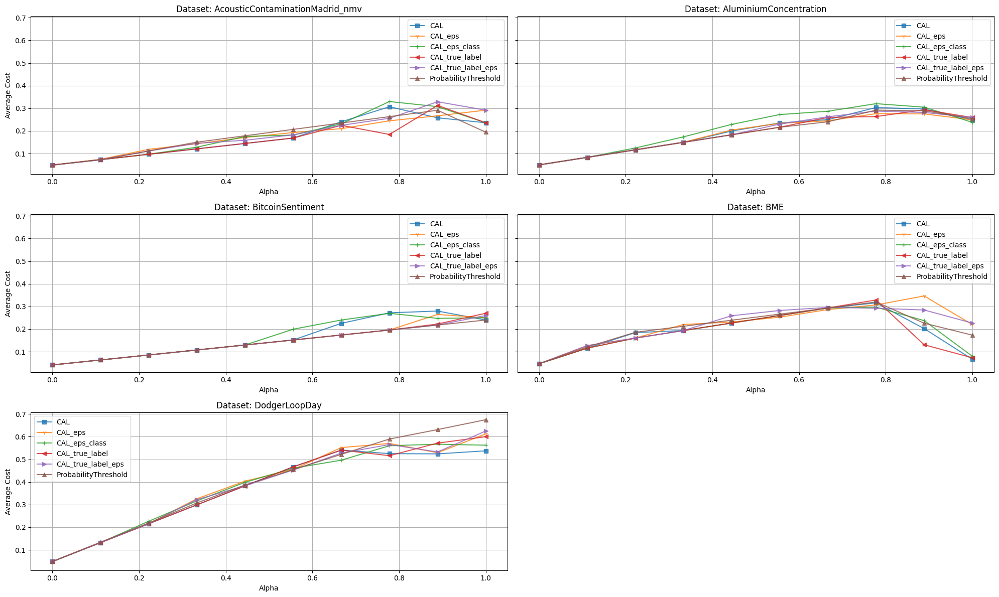

In [8]:
plot_avg_cost_per_dataset(avg_costs,alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment","BME","DodgerLoopDay"])

In [9]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment","BME","DodgerLoopDay"],misclf_cost='unb')


Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: DodgerLoopDay
Dataset DodgerLoopDay processed.


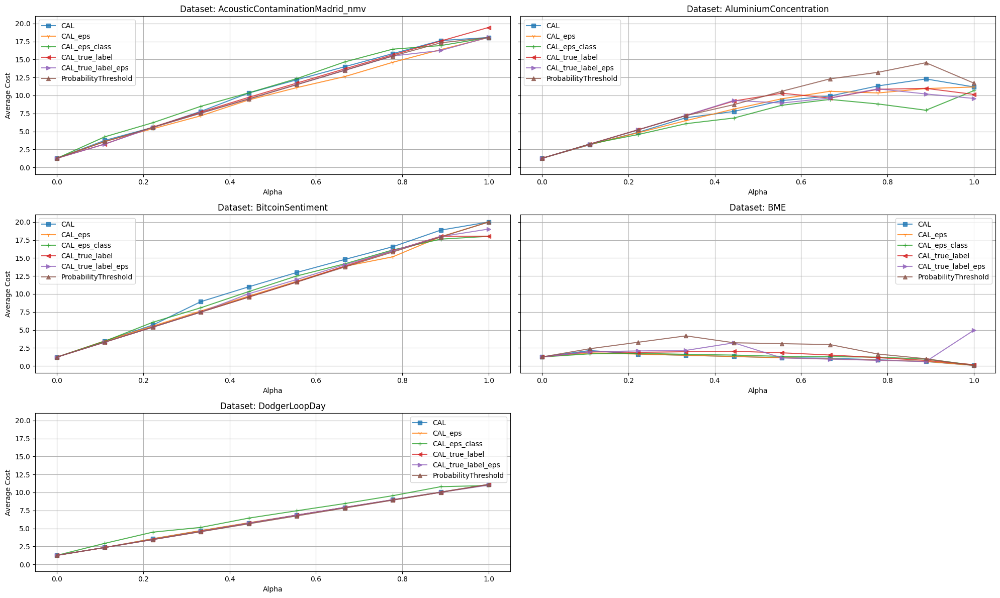

In [10]:
plot_avg_cost_per_dataset(avg_costs,alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment","BME","DodgerLoopDay"])

# Flatten with target

In [12]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment","BME","DodgerLoopDay"])

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: DodgerLoopDay
Dataset DodgerLoopDay processed.


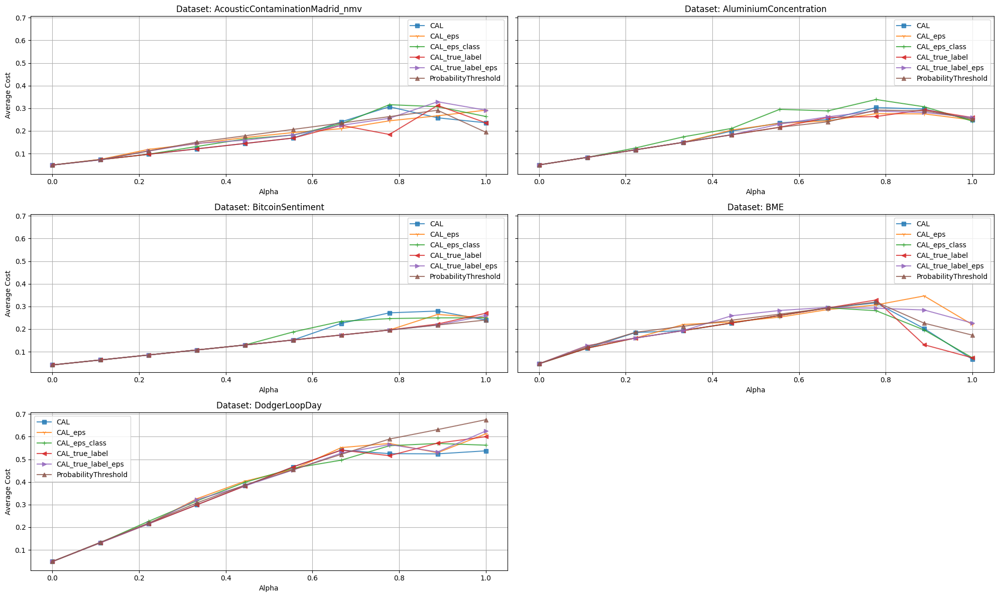

In [13]:
plot_avg_cost_per_dataset(avg_costs,alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment","BME","DodgerLoopDay"])

In [10]:
def plot_avg_cost_per_dataset(avg_costs, alphas, datasets, nrows=3):
    """
    Plot the average cost of different methods vs alphas for each dataset in multiple rows.
    
    Parameters:
    - avg_costs: Dictionary contenant les coûts moyens pour chaque méthode et dataset.
                 La structure attendue : {method: {dataset: [costs]} }
    - alphas: Liste ou array des valeurs alpha.
    - datasets: Liste des noms de datasets.
    - nrows: Nombre de lignes pour la grille de sous-graphes.
    """
    methods = ['CAL', 'CAL_eps', 'CAL_one_reg','CAL_true_label', 'CAL_true_label_eps','CAL_true_label_one_reg','ProbabilityThreshold']
    colors = plt.cm.tab10.colors
    markers = [ 's', '1','2','<','>','^', 'x']

    ncols = int(np.ceil(len(datasets) / nrows))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 4 * nrows), sharey=True)
    axes = axes.flatten()  # pour simplifier la gestion

    for i, dataset in enumerate(datasets):
        ax = axes[i]
        for j, method in enumerate(methods):
            if method in avg_costs and dataset in avg_costs[method]:
                ax.plot(alphas, avg_costs[method][dataset], label=method,
                        marker=markers[j], color=colors[j],alpha=.8)
        ax.set_title(f"Dataset: {dataset}")
        ax.set_xlabel("Alpha")
        if i % ncols == 0:
            ax.set_ylabel("Average Cost")
        ax.grid()
        ax.legend()

    # Supprimer les axes inutilisés si le nombre de datasets n'est pas un multiple de nrows
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

### ----Plot Average Cost over datasets w.r.t $\alpha$

In [4]:
def plot_avg_cost_over_datasets(avg_costs, alphas, datasets):
    """
    Plot the average cost of different methods vs alphas averaged over all datasets.
    
    Parameters:
    - avg_costs: Dictionary containing average costs for each method and dataset.
    - alphas: List or array of alpha values.
    - datasets: List of dataset names.
    """
    methods = ['CAL', 'CAL_eps', 'CAL_true_label', 'CAL_true_label_eps', 'ProbabilityThreshold']
    colors = plt.cm.tab10.colors
    markers=['o','v','s','^','x','+']

    # Compute the average cost for each method across all datasets
    avg_costs_over_datasets = {method: np.mean([avg_costs[method][dataset] for dataset in datasets], axis=0) for method in methods}

    plt.figure(figsize=(10, 6))
    for i, method in enumerate(methods):
        plt.plot(alphas, avg_costs_over_datasets[method], label=method, marker=markers[i], color=colors[i])
    
    plt.xlabel("Alpha")
    plt.ylabel("Average Cost")
    plt.title("Average Cost vs Alpha (Averaged Over Datasets)")
    plt.legend()
    plt.grid()
    plt.show()

In [6]:

alphas = np.linspace(0, 1, 10)


   
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv","AluminiumConcentration", "BitcoinSentiment"])

    
    

NameError: name 'get_avg_cost_over_datasets_wrt_alphas' is not defined

In [15]:
eps_global_minima_arr = [5,10,20]
avg_costs_per_eps = { eps : None for eps in eps_global_minima_arr}
for eps in eps_global_minima_arr :
   
    
    os.chdir('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm')
    with open(f'tests\\avg_costs_{eps}.json','r') as tmp_file :
        avg_costs=json.load(tmp_file)
    avg_costs_per_eps[eps]=avg_costs
    

In [16]:
import pandas as pd
data = []
alpha=0.5
for eps, triggers in avg_costs_per_eps.items():
    for trigger, datasets in triggers.items():
        for dataset, values in datasets.items():
            data.append({
                'Eps' : eps,
                'Trigger': trigger,
                'Alpha': alpha,
                'Dataset': dataset,
                'Average Cost': values[5] # alpha=0.5
            })

# Create a DataFrame
df = pd.DataFrame(data)

# Pivot the DataFrame to get triggers as columns
pivot_df = df.pivot_table(index=['Eps','Dataset'], columns='Trigger', values='Average Cost')

# Reset index to flatten the DataFrame
pivot_df.reset_index(inplace=True)

In [17]:
pivot_df

Trigger,Eps,Dataset,CAL,CAL_eps,CAL_eps_global_minima,CAL_true_label,CAL_true_label_eps,CAL_true_label_eps_global_minima,ProbabilityThreshold
0,5,AcousticContaminationMadrid_nmv,0.168523,0.192817,0.175148,0.168523,0.182327,0.172713,0.20671
1,10,AcousticContaminationMadrid_nmv,0.168523,0.192817,0.175148,0.168523,0.182327,0.172713,0.20671
2,20,AcousticContaminationMadrid_nmv,0.168523,0.192817,0.175148,0.168523,0.182327,0.172713,0.20671


In [12]:
ranked_df = pivot_df.copy()
ranked_df.iloc[:, 2:] = ranked_df.iloc[:, 2:].rank(axis=1, method='average', ascending=True)
ranked_df.columns = ['Eps', 'Dataset'] + [f'Rank {col}' for col in ranked_df.columns[2:]]


In [13]:
ranked_df

,Eps,Dataset,Rank CAL,Rank CAL_eps,Rank CAL_eps_global_minima,Rank CAL_true_label,Rank CAL_true_label_eps,Rank CAL_true_label_eps_global_minima,Rank ProbabilityThreshold
0,0.000,AcousticContaminationMadrid_nmv,1.5,6.0,4.0,1.5,5.0,3.0,7.0
1,0.000,AluminiumConcentration,7.0,5.0,3.0,1.5,6.0,4.0,1.5
2,0.000,BitcoinSentiment,4.0,4.0,4.0,4.0,4.0,4.0,4.0
3,0.001,AcousticContaminationMadrid_nmv,1.5,6.0,4.0,1.5,5.0,3.0,7.0
4,0.001,AluminiumConcentration,7.0,5.0,3.0,1.5,6.0,4.0,1.5
5,0.001,BitcoinSentiment,4.0,4.0,4.0,4.0,4.0,4.0,4.0
6,0.010,AcousticContaminationMadrid_nmv,1.5,6.0,4.0,1.5,5.0,3.0,7.0
7,0.010,AluminiumConcentration,7.0,5.0,3.0,1.5,6.0,4.0,1.5
8,0.010,BitcoinSentiment,4.0,4.0,4.0,4.0,4.0,4.0,4.0
9,0.100,AcousticContaminationMadrid_nmv,1.5,6.0,4.0,1.5,5.0,3.0,7.0


In [19]:
eps_global_minima_arr = [0,0.001,0.01,0.1,0.5]
alphas = np.linspace(0, 1, 10)
avg_costs = []
for eps in eps_global_minima_arr :
   
    avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment"],eps_global_minima=eps,misclf_cost='unb')
    print('Processed eps :', eps)
    os.chdir('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm')
    with open(f'tests\\avg_costs_unb_{eps}.json','w') as tmp_file :
        json.dump(avg_costs,tmp_file)

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processed eps : 0
Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processed eps : 0.001
Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processed eps : 0.01
Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset Al

In [20]:
eps_global_minima_arr = [0,0.001,0.01,0.1,0.5]
avg_costs_per_eps = { eps : None for eps in eps_global_minima_arr}
for eps in eps_global_minima_arr :
   
    
    os.chdir('C:\\Users\\WTHK0243\\OneDrive - orange.com\\Bureau\\ml_edm\\src\\ml_edm')
    with open(f'tests\\avg_costs_unb_{eps}.json','r') as tmp_file :
        avg_costs=json.load(tmp_file)
    avg_costs_per_eps[eps]=avg_costs

In [21]:
data = []
alpha=0.5
for eps, triggers in avg_costs_per_eps.items():
    for trigger, datasets in triggers.items():
        for dataset, values in datasets.items():
            data.append({
                'Eps' : eps,
                'Trigger': trigger,
                'Alpha': alpha,
                'Dataset': dataset,
                'Average Cost': values[5] # alpha=0.5
            })

# Create a DataFrame
df = pd.DataFrame(data)

# Pivot the DataFrame to get triggers as columns
pivot_df = df.pivot_table(index=['Eps','Dataset'], columns='Trigger', values='Average Cost')

# Reset index to flatten the DataFrame
pivot_df.reset_index(inplace=True)

In [22]:
pivot_df

Trigger,Eps,Dataset,CAL,CAL_eps,CAL_eps_global_minima,CAL_true_label,CAL_true_label_eps,CAL_true_label_eps_global_minima,ProbabilityThreshold
0,0.000,AcousticContaminationMadrid_nmv,12.176254,10.831322,10.993565,11.716294,11.495914,10.742325,11.510893
1,0.000,AluminiumConcentration,9.283636,9.440351,8.956964,10.305814,9.683027,9.099005,10.582171
2,0.000,BitcoinSentiment,12.982849,11.756839,11.422690,11.655123,12.060819,11.422690,11.655123
3,0.001,AcousticContaminationMadrid_nmv,12.176254,10.831322,10.993565,11.716294,11.495914,10.742325,11.510893
4,0.001,AluminiumConcentration,9.283636,9.440351,8.956964,10.305814,9.683027,9.099005,10.582171
5,0.001,BitcoinSentiment,12.982849,11.756839,11.422690,11.655123,12.060819,11.422690,11.655123
6,0.010,AcousticContaminationMadrid_nmv,12.176254,10.831322,10.993565,11.716294,11.495914,10.742325,11.510893
7,0.010,AluminiumConcentration,9.283636,9.440351,8.956964,10.305814,9.683027,9.099005,10.582171
8,0.010,BitcoinSentiment,12.982849,11.756839,11.422690,11.655123,12.060819,11.422690,11.655123
9,0.100,AcousticContaminationMadrid_nmv,12.176254,10.831322,10.993565,11.716294,11.495914,10.742325,11.510893


### Standard Cross Val (100 points) :

In [15]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"],num_samples_eps=100,misclf_cost='unb')

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: ChilledWaterPredictor
Dataset ChilledWaterPredictor processed.


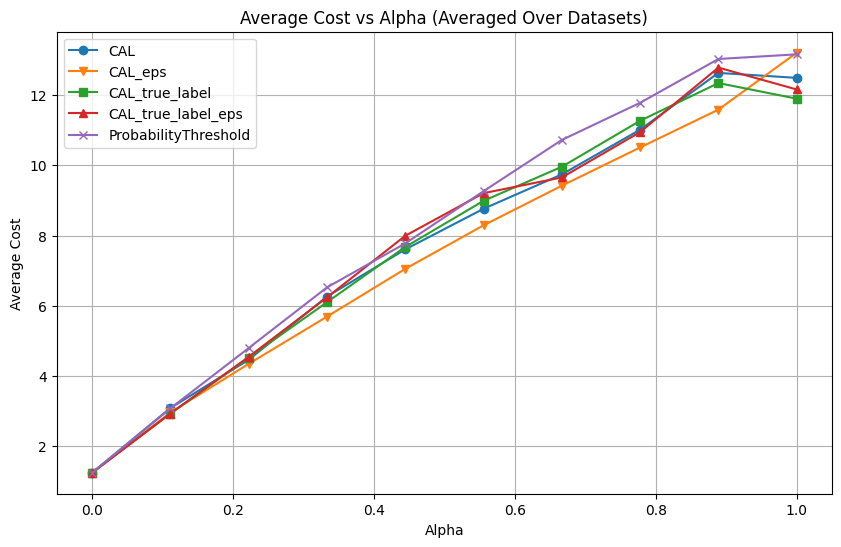

In [16]:
datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"]
plot_avg_cost_over_datasets(avg_costs, alphas, datasets)

### Standard Cross Val (20 pts) :

In [17]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"],num_samples_eps=20,misclf_cost='unb')

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: ChilledWaterPredictor
Dataset ChilledWaterPredictor processed.


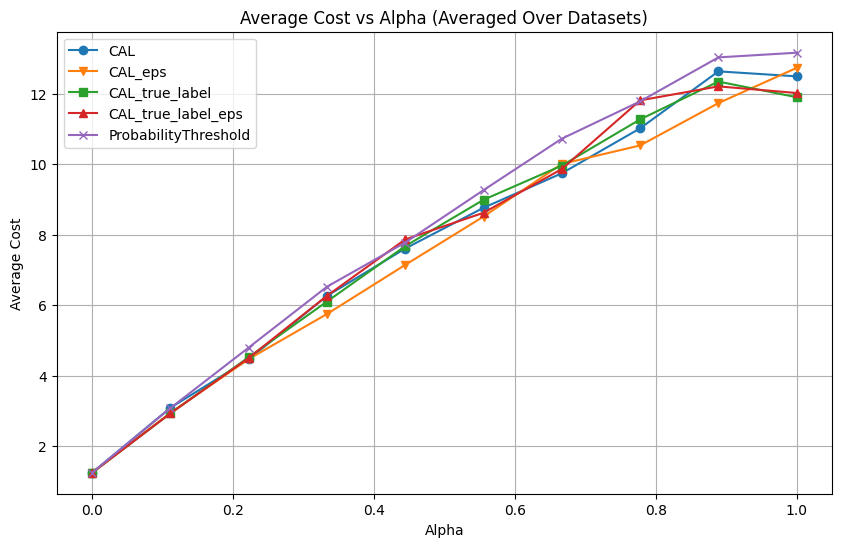

In [18]:
datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"]
plot_avg_cost_over_datasets(avg_costs, alphas, datasets)

### Standard Cross Val (10 pts ):

In [20]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"],num_samples_eps=10,misclf_cost='unb')

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: ChilledWaterPredictor
Dataset ChilledWaterPredictor processed.


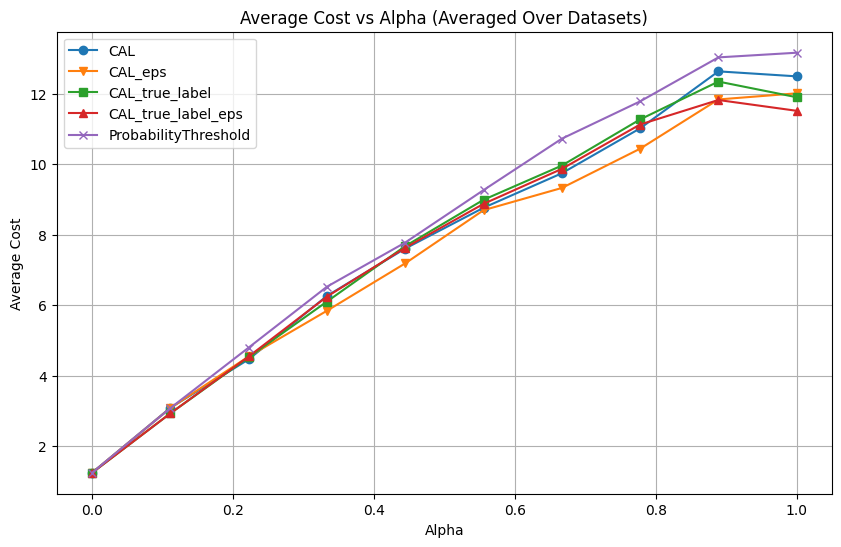

In [21]:
datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"]
plot_avg_cost_over_datasets(avg_costs, alphas, datasets)

### Standrard Cross Val (5 pts) :

In [22]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"],num_samples_eps=5,misclf_cost='unb')

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: ChilledWaterPredictor
Dataset ChilledWaterPredictor processed.


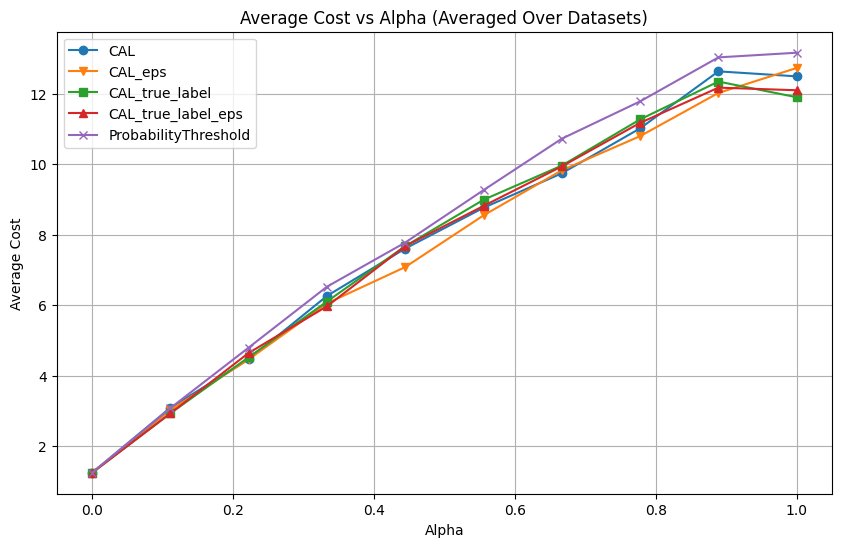

In [23]:
datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"]
plot_avg_cost_over_datasets(avg_costs, alphas, datasets)

In [8]:
alphas = np.linspace(0, 1, 10)
datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"]
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=datasets)

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.
Processing dataset: AluminiumConcentration
Dataset AluminiumConcentration processed.
Processing dataset: BitcoinSentiment
Dataset BitcoinSentiment processed.
Processing dataset: BME
Dataset BME processed.
Processing dataset: ChilledWaterPredictor
Dataset ChilledWaterPredictor processed.


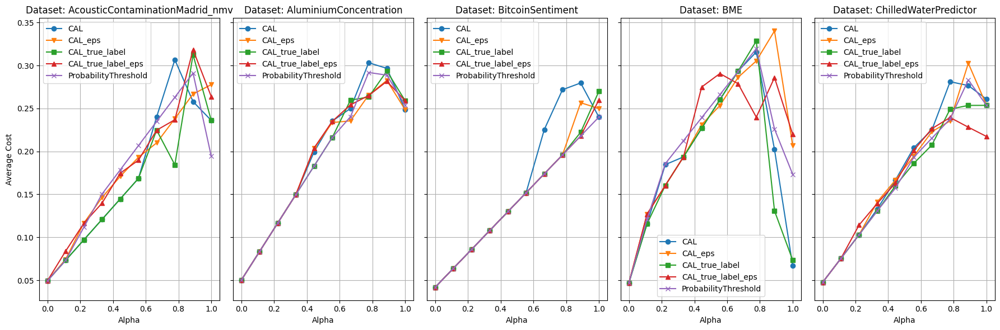

In [9]:
plot_avg_cost_per_dataset(avg_costs, alphas, datasets)

### Use y_triggers instead of pred cost diffs when swapping the costs

In [9]:
alphas = np.linspace(0, 1, 11)
datasets=["AcousticContaminationMadrid_nmv", "AluminiumConcentration", "BitcoinSentiment", "BME", "ChilledWaterPredictor"]
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=datasets)

Processing dataset: AcousticContaminationMadrid_nmv
Processing alpha: 0.0 for dataset: AcousticContaminationMadrid_nmv
CALIMERA
Score: -5.629511945922765e+28
Score: 0.0
Score: 0.0
Score: -5.525829166293826e+28
Score: -5.497881881911255e+28
Score: 0.0
Score: 0.0
Score: 0.0
Score: -4.967236036285654e+28
Score: 0.0
Score: 0.0
Score: 0.0
Score: -2.609003580752399e+28
Score: 0.0
Score: 0.0
Score: 0.0
Score: -3.1349144345559472e+28
Score: -1.852269032735291e+28
Score: -2.2281251589473447e+28
Num swaps predicted: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
CALIMERA with epsilon method
Score: -5.629511945922765e+28
Score: 0.0
Score: 0.0
Score: -5.525829166293826e+28
Score: -5.497881881911255e+28
Score: 0.0
Score: 0.0
Score: 0.0
Score: -4.967236036285654e+28
Score: 0.0
Score: 0.0
Score: 0.0
Score: -2.609003580752399e+28
Score: 0.0
Score: 0.0
Score: 0.0
Score: -3.1349144345559472e+28
Score: -1.852269032735291e+28
Score: -2.2281251589473447e+28
Score target swap: -1.7945010808416783

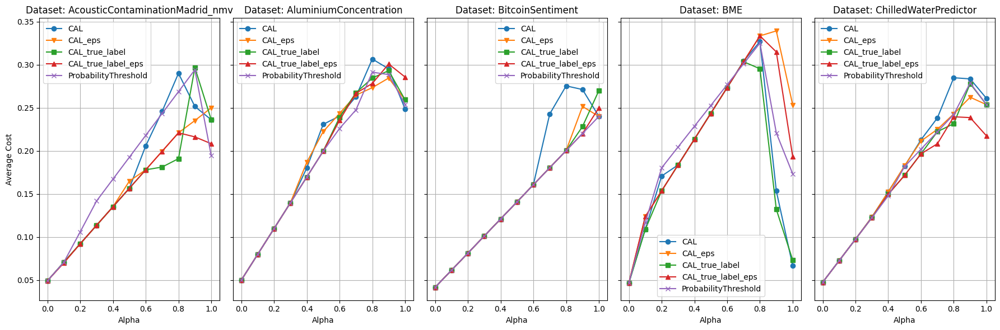

In [12]:
plot_avg_cost_per_dataset(avg_costs, alphas, datasets)

### Unbalanced with predicted cost :

In [13]:
alphas = np.linspace(0, 1, 11)
datasets=["BME","Chinatown","DodgerLoopDay","GunPointAgeSpan","HouseTwenty","MelbournePedestrian","PLAID","Rock","SemgHandGenderCh2","SmoothSubspace","UMD"]
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=datasets,misclf_cost='unb')

Processing dataset: BME
Dataset BME processed.
Processing dataset: Chinatown
Dataset Chinatown processed.
Processing dataset: DodgerLoopDay
Dataset DodgerLoopDay processed.
Processing dataset: GunPointAgeSpan
Dataset GunPointAgeSpan processed.
Processing dataset: HouseTwenty
Dataset HouseTwenty processed.
Processing dataset: MelbournePedestrian
Dataset MelbournePedestrian processed.
Processing dataset: PLAID
Dataset PLAID processed.
Processing dataset: Rock
Dataset Rock processed.
Processing dataset: SemgHandGenderCh2
Dataset SemgHandGenderCh2 processed.
Processing dataset: SmoothSubspace
Dataset SmoothSubspace processed.
Processing dataset: UMD
Dataset UMD processed.


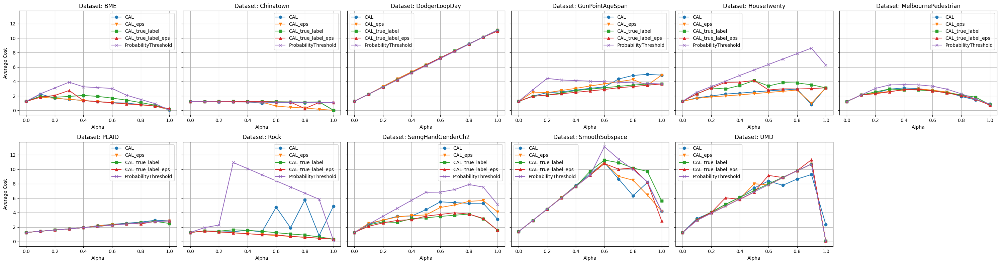

In [14]:
plot_avg_cost_per_dataset(avg_costs, alphas, datasets)

### Unbalanced with target

In [9]:
alphas = np.linspace(0, 1, 11)
datasets=["BME","Chinatown","DodgerLoopDay","GunPointAgeSpan","HouseTwenty","MelbournePedestrian","PLAID","Rock","SemgHandGenderCh2","SmoothSubspace","UMD"]
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=datasets,misclf_cost='unb')

Processing dataset: BME
Processing alpha: 0.0 for dataset: BME
CALIMERA
Num swaps predicted: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
CALIMERA with epsilon method
Num swaps true: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Num swaps predicted: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
CALIMERA true label
Num swaps predicted: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
CALIMERA true label with epsilon method
Num swaps true: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Num swaps predicted: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
ProbabilityThreshold
Processing alpha: 0.1 for dataset: BME
CALIMERA
Num swaps predicted: [24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
CALIMERA with epsilon method
Num swaps true: [80, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Num swaps predicted: [24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
CALIMERA true label
Num swaps predicted: 

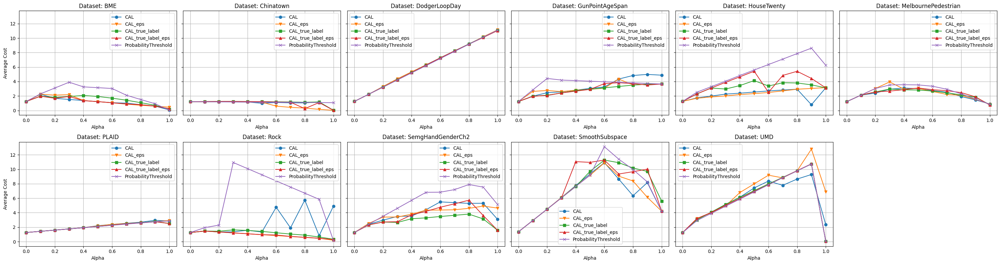

In [14]:
plot_avg_cost_per_dataset(avg_costs, alphas, datasets)

### Use also y_triggers for calimera and calimera true label : 

In [8]:
alphas = np.linspace(0, 1, 10)
avg_costs=get_avg_cost_over_datasets_wrt_alphas(alphas,datasets=["AcousticContaminationMadrid_nmv"],num_samples_eps=50)

Processing dataset: AcousticContaminationMadrid_nmv
Dataset AcousticContaminationMadrid_nmv processed.


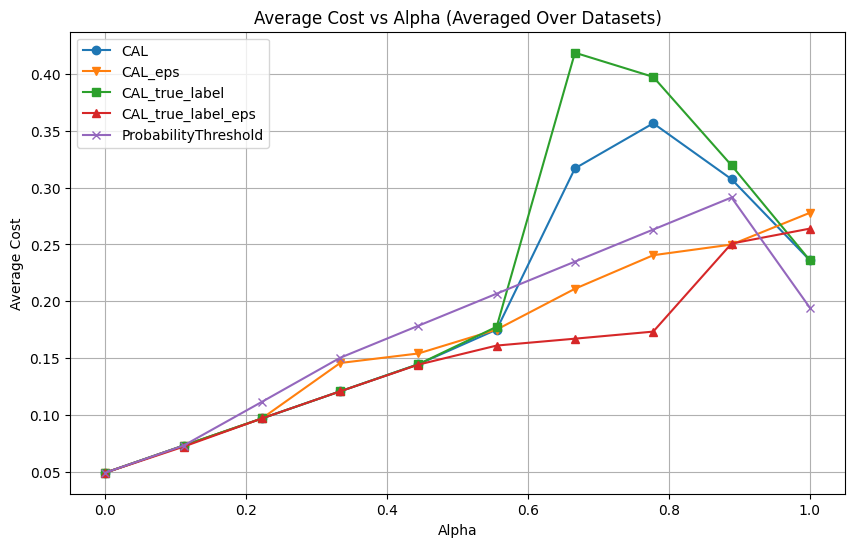

In [9]:
datasets=["AcousticContaminationMadrid_nmv"]
plot_avg_cost_over_datasets(avg_costs, alphas, datasets)

## Experiment 2 : Unbalanced Misclf Cost with MiniRocket Sigmoid    

In [41]:
small_values = 1
misclf_cost = small_values - np.eye(len(classes_alu)) * small_values

idx_min_class = classes_alu[counts_alu.argmin()]
misclf_cost[:, idx_min_class] *= 100
print("Misclf Cost Matrix : \n",misclf_cost)

Misclf Cost Matrix : 
 [[  0.   1.]
 [100.   0.]]


### Trying different trigger models on Unbalanced Aluminum Concentration Dataset :

#### ----Basic calimera

In [42]:
X_classif, X_trigger, y_classif, y_trigger = train_test_split(X_unbalanced_train_alu, y_unbalanced_train_alu, test_size=0.4, random_state=44)
sampling_ratio = 0.05
max_T = X_unbalanced_train_alu.shape[1] 
timestamps = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
# delete potential duplicates, O's 
def delay_cost(t):
    inflexion_point = 0
    return np.exp(((t/X_unbalanced_train_alu.shape[1])-inflexion_point) * np.log(100))

collection_clf = ClassifiersCollection(
    base_classifier=MiniRocketClassifier(n_jobs=-1),
    timestamps=timestamps
)

collection_clf.fit(X_classif, y_classif)
classes, counts = np.unique(y_unbalanced_train_alu, return_counts=True)

trigger = CALIMERA(timestamps,n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger,delay_cost)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


Average cost:  5.4588716013460195
Accuracy :  0.808
Earliness :  0.31055546813532653


In [45]:
trigger = CALIMERA(timestamps,n_jobs=-1,pass_just_probas_for_binary=True)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger,delay_cost)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

Average cost:  5.4588716013460195
Accuracy :  0.808
Earliness :  0.31055546813532653


In [65]:
# Dump the results to a JSON file
dump2json(metrics_unbalanced_misclf_basic, 'tests\\results_unbalanced_misclf_basic_calimera.json')

Results have been successfully dumped to tests\results_unbalanced_misclf_basic_calimera.json.


#### ---- CALIMERA True Label

In [46]:
trigger_true_label = CALIMERA(timestamps,n_jobs=-1,variant='true_label')
metrics_unbalanced_misclf_true_label = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger_true_label,delay_cost)
print("Average cost: ", metrics_unbalanced_misclf_true_label['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_true_label['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_true_label['earliness'])

Average cost:  5.585525438143846
Accuracy :  0.816
Earliness :  0.29256963021243115


### ---- CALIMERA True Label + Just Pass probas for binary


In [47]:
trigger_true_label = CALIMERA(timestamps,n_jobs=-1,variant='true_label',pass_just_probas_for_binary=True)
metrics_unbalanced_misclf_true_label = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger_true_label,delay_cost)
print("Average cost: ", metrics_unbalanced_misclf_true_label['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_true_label['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_true_label['earliness'])

Average cost:  5.585525438143846
Accuracy :  0.816
Earliness :  0.29256963021243115


#### ---- CALIMERA True Label + Epsilon Cross Val

In [49]:
trigger_true_label_eps = CALIMERA(timestamps,n_jobs=-1,variant='true_label',epsilon_method=True)
metrics_unbalanced_misclf_true_label_eps = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger_true_label_eps,delay_cost)
print("Average cost: ", metrics_unbalanced_misclf_true_label_eps['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_true_label_eps['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_true_label_eps['earliness'])

Average cost:  5.585525438143846
Accuracy :  0.816
Earliness :  0.29256963021243115


In [31]:
trigger_true_label_eps.candidate_epsilon

array([ 0.        , -0.01993141, -0.03261883, -0.03723243, -0.05568686,
       -0.08452191, -0.10989675, -0.16179984, -0.20908931, -0.21024272,
       -0.23215735, -0.24253797, -0.28982745, -0.29790126, -0.3209693 ,
       -0.33365672, -0.35211115, -0.41554825, -0.51128061, -0.53665545,
       -0.56087689, -0.5677973 , -0.5689507 , -0.5701041 , -0.62316059,
       -0.6312344 , -0.65891605, -0.66468306, -0.67737048, -0.69697831,
       -0.70505212, -0.70505212, -0.72119975, -0.72119975, -0.78348345,
       -0.80078448, -0.80193788, -0.8123185 , -0.82500592, -0.82731272,
       -0.88036921, -0.91843147, -0.93111889, -0.97840837, -1.01416383,
       -1.02223764, -1.03838527, -1.08336794, -1.10066897, -1.12373701,
       -1.13181082])

In [32]:
trigger_true_label_eps.opt_epsilon

-0.1617998366827269

#### ----Calimera variant $\hat{P} - \hat{P}$

In [66]:

trigger = CALIMERA(timestamps,n_jobs=-1,variant='p_hat_p_hat')
metrics_unbalanced_misclf_p_hat = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_p_hat['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_p_hat['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_p_hat['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  4.128176239181745
Accuracy :  0.816
Earliness :  0.9443524783634932


In [67]:
# Dump the results to a JSON file
dump2json(metrics_unbalanced_misclf_p_hat, 'tests\\results_unbalanced_misclf_var_p_hat_p_hat.json')

Results have been successfully dumped to tests\results_unbalanced_misclf_var_p_hat_p_hat.json.


#### ----Calimera variant Transpose

In [68]:
trigger = CALIMERA(timestamps,n_jobs=-1,variant='transpose')
metrics_unbalanced_misclf_transpose = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_transpose['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_transpose['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_transpose['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  10.044764752163651
Accuracy :  0.8
Earliness :  0.08952950432730133


In [69]:
# Dump the results to a JSON file
dump2json(metrics_unbalanced_misclf_transpose, 'tests\\results_unbalanced_misclf_var_transpose.json')

Results have been successfully dumped to tests\results_unbalanced_misclf_var_transpose.json.


#### ----Calimera variant Prior

In [73]:
trigger = CALIMERA(timestamps,n_jobs=-1,variant='corrected_prior')
metrics_unbalanced_misclf_prior = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_prior['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_prior['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_prior['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  5.231881982690795
Accuracy :  0.84
Earliness :  0.7997639653815893


In [74]:
# Dump the results to a JSON file
dump2json(metrics_unbalanced_misclf_prior, 'tests\\results_unbalanced_misclf_var_prior.json')

Results have been successfully dumped to tests\results_unbalanced_misclf_var_prior.json.


#### ----Economy $\gamma$

In [75]:
trigger = EconomyGamma(timestamps,n_jobs=-1)
metrics_unbalanced_misclf_eco = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_eco['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_eco['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_eco['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  1.6372635719905588
Accuracy :  0.784
Earliness :  0.6825271439811172


In [76]:
# Dump the results to a JSON file
dump2json(metrics_unbalanced_misclf_eco, 'tests\\results_unbalanced_misclf_economy_gamma.json')

Results have been successfully dumped to tests\results_unbalanced_misclf_economy_gamma.json.


#### ----Probability Threshold

In [77]:
trigger = EconomyGamma(timestamps,n_jobs=-1)
metrics_unbalanced_misclf_eco = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_eco['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_eco['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_eco['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  1.6372635719905588
Accuracy :  0.784
Earliness :  0.6825271439811172


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWa

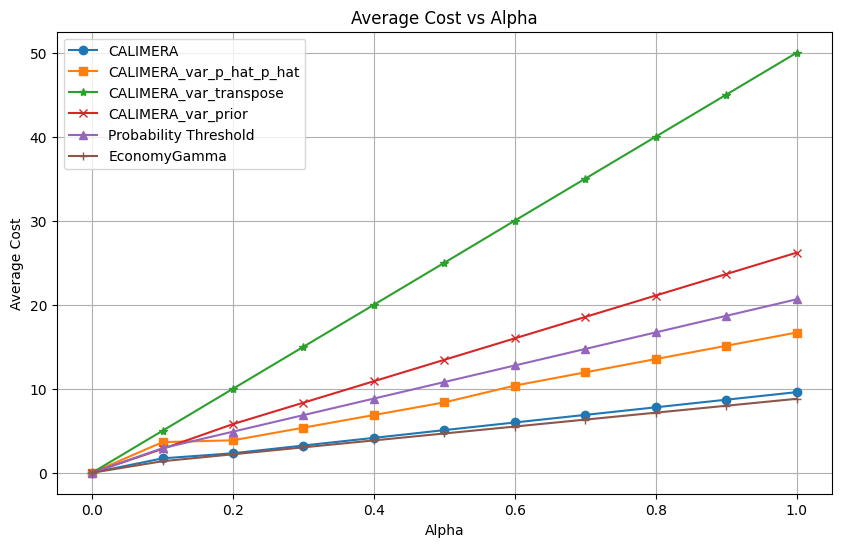

In [78]:
alphas = np.linspace(0., 1.0, 11)
plot_avg_cost_wrt_alphas(collection_clf,misclf_cost,alphas)

## Experiment 3 : Impact of classifier (and type of calibration/scaling)

### 3.1 Changing just the type of regression (by default sigmoid/isotonic) in probability calibration step :

In [26]:
sampling_ratio = 0.05
max_T = X_train_alu.shape[1] 
timestamps_alu = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
# delete potential duplicates, O's 
timestamps_alu = check_timestamps(timestamps_alu)
# Another split in our training set beteween classification and trigger data
X_classif_alu, X_trigger_alu, y_classif_alu, y_trigger_alu = train_test_split(X_train_alu, y_train_alu, test_size=0.4, random_state=44)
collection_clf = ClassifiersCollection(
    base_classifier=MiniRocketClassifier(n_jobs=-1),
    timestamps=timestamps_alu,
    cv_method = 'isotonic'
    
)
collection_clf.fit(X_classif_alu, y_classif_alu)

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


ClassifiersCollection(base_classifier=MiniRocketClassifier(n_jobs=-1),
                      classifiers=[CalibratedClassifierCV(cv='prefit',
                                                          estimator=MiniRocketClassifier(n_jobs=-1),
                                                          method='isotonic'),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=MiniRocketClassifier(n_jobs=-1),
                                                          method='isotonic'),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=MiniRocketClassifier(n_jobs=-1...
                                                          method='isotonic'),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=MiniRocketClassifier(n_jobs=-1),
                                                          method='isotonic'),
                                   CalibratedClassifierCV(cv='prefit',
                                                          estimator=MiniRocketClassifier(n_jobs=-1),
                                                          method='isotonic')],
                      cv_method='isotonic', min_length=1,
                      timestamps=array([ 127,  254,  381,  508,  635,  762,  889, 1016, 1143, 1271, 1398,
       1525, 1652, 1779, 1906, 2033, 2160, 2287, 2414, 2542]))

#### 3.1.1 Zero-One Mis Clf Cost

#### ----Basic CALIMERA

In [27]:
trigger = CALIMERA(timestamps_alu,n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_basic = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_basic['average_cost'])
print("Accuracy : ", metrics_misclf_basic['accuracy'])
print("Earliness : ", metrics_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.18766625454272973
Accuracy :  0.7063492063492064
Earliness :  0.08168171543466586


#### ----CALIMERA True Label

In [57]:
trigger = CALIMERA(timestamps_alu,n_jobs=-1,variant='true_label')
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_basic = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_basic['average_cost'])
print("Accuracy : ", metrics_misclf_basic['accuracy'])
print("Earliness : ", metrics_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.1599009653691006
Accuracy :  0.7301587301587301
Earliness :  0.04996066089693155


#### -----CALIMERA True LAabel Eps Cross Val

In [58]:
trigger = CALIMERA(timestamps_alu,n_jobs=-1,variant='true_label',epsilon_method='True')
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_basic = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_basic['average_cost'])
print("Accuracy : ", metrics_misclf_basic['accuracy'])
print("Earliness : ", metrics_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
c:\Users\WTHK0243\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\WTHK0243\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Average cost:  0.6031746031746031
Accuracy :  0.7936507936507936
Earliness :  1.0


In [59]:
trigger.candidate_epsilon

array([ 0.0493211 ,  0.04271794,  0.03611477,  0.0295116 ,  0.02290844,
        0.01630527,  0.00970211,  0.00309894, -0.00350422, -0.01010739])

In [60]:
trigger.opt_epsilon

0.04271793567406074

#### ----CALIMERA Variant $\hat{P} - \hat{P} $

In [81]:
trigger = CALIMERA(timestamps_alu,variant='p_hat_p_hat',n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_p_hat_p_hat = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_p_hat_p_hat['average_cost'])
print("Accuracy : ", metrics_misclf_p_hat_p_hat['accuracy'])
print("Earliness : ", metrics_misclf_p_hat_p_hat['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.16386921933735457
Accuracy :  0.7222222222222222
Earliness :  0.04996066089693155


#### ----CALIMERA Variant Transpose

In [82]:
trigger = CALIMERA(timestamps_alu,variant='transpose',n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_transpose = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_transpose['average_cost'])
print("Accuracy : ", metrics_misclf_transpose['accuracy'])
print("Earliness : ", metrics_misclf_transpose['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.18766625454272973
Accuracy :  0.7063492063492064
Earliness :  0.08168171543466586


#### ----CALIMERA Variant Prior

In [83]:
trigger = CALIMERA(timestamps_alu,variant='corrected_prior',n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_prior = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_prior['average_cost'])
print("Accuracy : ", metrics_misclf_prior['accuracy'])
print("Earliness : ", metrics_misclf_prior['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.16386921933735457
Accuracy :  0.7222222222222222
Earliness :  0.04996066089693155


#### ----Economy $\gamma$

In [84]:
trigger = EconomyGamma(timestamps_alu,n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_eco = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_eco['average_cost'])
print("Accuracy : ", metrics_misclf_eco['accuracy'])
print("Earliness : ", metrics_misclf_eco['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.16386921933735457
Accuracy :  0.7222222222222222
Earliness :  0.04996066089693155


#### ----Probability Threshold

In [85]:
trigger = ProbabilityThreshold(timestamps_alu,n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_eco = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_eco['average_cost'])
print("Accuracy : ", metrics_misclf_eco['accuracy'])
print("Earliness : ", metrics_misclf_eco['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.16386921933735457
Accuracy :  0.7222222222222222
Earliness :  0.04996066089693155


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWa

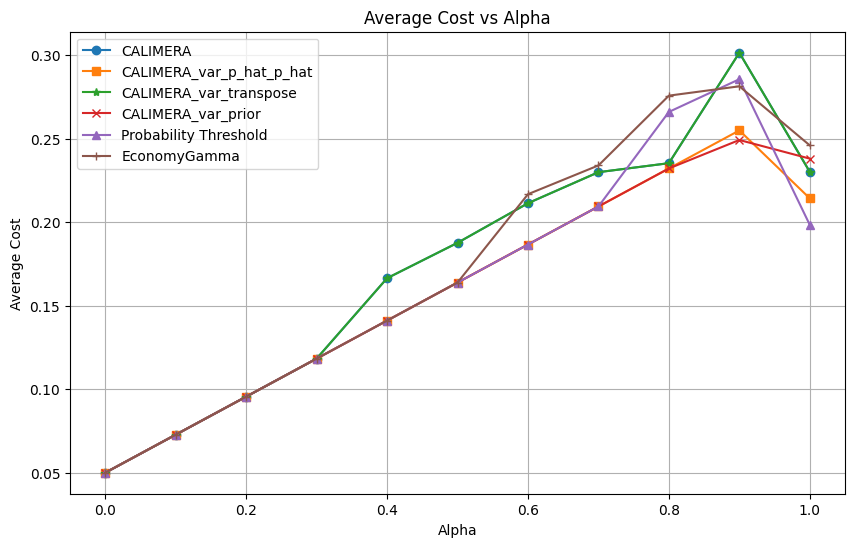

In [86]:
alphas = np.linspace(0., 1.0, 11)
plot_avg_cost_wrt_alphas(collection_clf,misclf_cost,alphas,timestamps=timestamps_alu)

#### 3.1.2 Unbalanced Mis Clf Cost

In [29]:
small_values = 1
misclf_cost = small_values - np.eye(len(classes_alu)) * small_values

idx_min_class = classes_alu[counts_alu.argmin()]
misclf_cost[:, idx_min_class] *= 100
print("Misclf Cost Matrix : \n",misclf_cost)

Misclf Cost Matrix : 
 [[  0.   1.]
 [100.   0.]]


#### ----Basic CALIMERA

In [30]:
X_classif, X_trigger, y_classif, y_trigger = train_test_split(X_unbalanced_train_alu, y_unbalanced_train_alu, test_size=0.4, random_state=44)
sampling_ratio = 0.05
max_T = X_unbalanced_train_alu.shape[1] 
timestamps_unb = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
# delete potential duplicates, O's 
timestamps_unb=check_timestamps(timestamps_unb)
collection_clf = ClassifiersCollection(
    base_classifier=MiniRocketClassifier(n_jobs=-1),
    timestamps=timestamps_unb,
    cv_method = 'isotonic'
    
)
collection_clf.fit(X_classif, y_classif)
classes, counts = np.unique(y_unbalanced_train_alu, return_counts=True)

trigger = CALIMERA(timestamps_unb,n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  2.2472777340676644
Accuracy :  0.776
Earliness :  0.31055546813532653


#### ----CALIMERA Variant $\hat{P} - \hat{P}$

In [89]:
trigger = CALIMERA(timestamps_unb,variant='p_hat_p_hat',n_jobs=-1)
metrics_unbalanced_misclf = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  2.822679779701022
Accuracy :  0.768
Earliness :  0.6613595594020456


#### ----CALIMERA Variant Prior

In [92]:
trigger = CALIMERA(timestamps_unb,variant='corrected_prior',n_jobs=-1)
metrics_unbalanced_misclf = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  5.2438819826907945
Accuracy :  0.816
Earliness :  0.7997639653815893


#### ----CALIMERA Variant Transpose

In [93]:
trigger = CALIMERA(timestamps_unb,variant='transpose',n_jobs=-1)
metrics_unbalanced_misclf = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  10.024980330448468
Accuracy :  0.8
Earliness :  0.04996066089693155


#### ----Economy $\gamma$

In [94]:
trigger = EconomyGamma(timestamps_unb,n_jobs=-1)
metrics_unbalanced_misclf = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  1.9890999213217937
Accuracy :  0.76
Earliness :  0.5701998426435878


#### ----Probability Treshold

In [95]:
trigger = ProbabilityThreshold(timestamps_unb,n_jobs=-1)
metrics_unbalanced_misclf = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  5.732
Accuracy :  0.832
Earliness :  1.0


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWa

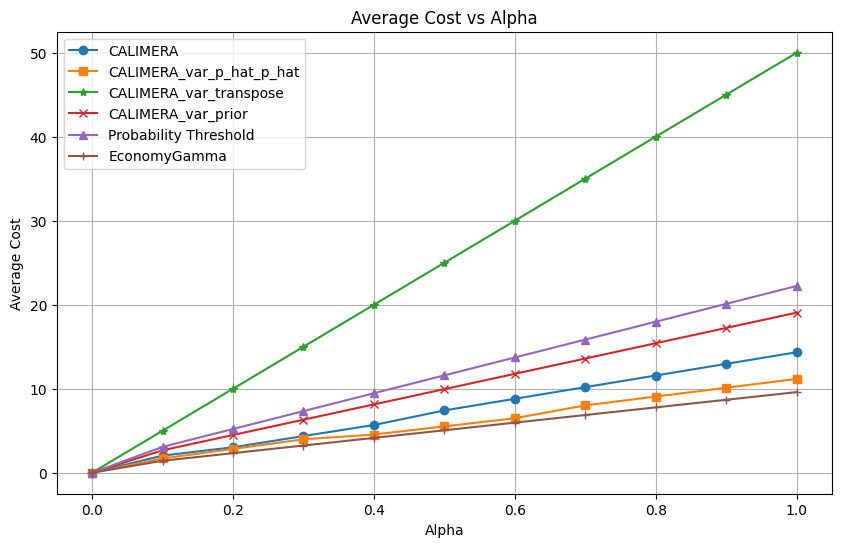

In [96]:
alphas = np.linspace(0., 1.0, 11)
plot_avg_cost_wrt_alphas(collection_clf,misclf_cost,alphas,timestamps=timestamps_unb)

### 3.2 Changing the type of classifier : MiniRocket ---> RidgeClassifierCV

#### 3.2.1 Zero-One Mis Clf :

In [32]:
sampling_ratio = 0.05
max_T = X_train_alu.shape[1] 
timestamps_alu = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
# delete potential duplicates, O's 
timestamps_alu = check_timestamps(timestamps_alu)
# Another split in our training set beteween classification and trigger data
X_classif_alu, X_trigger_alu, y_classif_alu, y_trigger_alu = train_test_split(X_train_alu, y_train_alu, test_size=0.4, random_state=44)
# create a pipeline with the classifier and the trigger
clf = make_pipeline(
    SplineTransformer(),
    CalibratedClassifierCV(RidgeClassifierCV(), method="sigmoid") 
)
collection_clf = ClassifiersCollection(
    base_classifier=clf,
    timestamps=timestamps_alu,
    calibration=False
)
collection_clf.fit(X_classif_alu, y_classif_alu)


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


ClassifiersCollection(base_classifier=Pipeline(steps=[('splinetransformer',
                                                       SplineTransformer()),
                                                      ('calibratedclassifiercv',
                                                       CalibratedClassifierCV(estimator=RidgeClassifierCV()))]),
                      calibration=False,
                      classifiers=[Pipeline(steps=[('splinetransformer',
                                                    SplineTransformer()),
                                                   ('calibratedclassifiercv',
                                                    CalibratedClassifierCV(estimator=RidgeClassifierCV()))])...
                                                   ('calibratedclassifiercv',
                                                    CalibratedClassifierCV(estimator=RidgeClassifierCV()))]),
                                   Pipeline(steps=[('splinetransformer',
                                                    SplineTransformer()),
                                                   ('calibratedclassifiercv',
                                                    CalibratedClassifierCV(estimator=RidgeClassifierCV()))])],
                      min_length=1,
                      timestamps=array([ 127,  254,  381,  508,  635,  762,  889, 1016, 1143, 1271, 1398,
       1525, 1652, 1779, 1906, 2033, 2160, 2287, 2414, 2542]))

#### ----Basic CALIMERA 

In [33]:
trigger = CALIMERA(timestamps_alu,n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_basic = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_basic['average_cost'])
print("Accuracy : ", metrics_misclf_basic['accuracy'])
print("Earliness : ", metrics_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.18270671762017154
Accuracy :  0.7142857142857143
Earliness :  0.07969914952605747


#### ----Calimera Variant $\hat{P} - \hat{P}$

In [99]:
trigger = CALIMERA(timestamps_alu,variant='p_hat_p_hat',n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_p_hat_p_hat = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_p_hat_p_hat['average_cost'])
print("Accuracy : ", metrics_misclf_p_hat_p_hat['accuracy'])
print("Earliness : ", metrics_misclf_p_hat_p_hat['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.17974223521037044
Accuracy :  0.6904761904761905
Earliness :  0.04996066089693155


#### ----Calimera Variant Transpose 

In [100]:
trigger = CALIMERA(timestamps_alu,variant='transpose',n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_transpose = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_transpose['average_cost'])
print("Accuracy : ", metrics_misclf_transpose['accuracy'])
print("Earliness : ", metrics_misclf_transpose['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.18270671762017154
Accuracy :  0.7142857142857143
Earliness :  0.07969914952605747


#### ----Calimera Variant Prior

In [101]:
trigger = CALIMERA(timestamps_alu,variant='corrected_prior',n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_prior = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_prior['average_cost'])
print("Accuracy : ", metrics_misclf_prior['accuracy'])
print("Earliness : ", metrics_misclf_prior['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.17974223521037044
Accuracy :  0.6904761904761905
Earliness :  0.04996066089693155


#### ----Economy $\gamma$

In [102]:
trigger = EconomyGamma(timestamps_alu,n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_eco = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_eco['average_cost'])
print("Accuracy : ", metrics_misclf_eco['accuracy'])
print("Earliness : ", metrics_misclf_eco['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.19699055861526352
Accuracy :  0.6904761904761905
Earliness :  0.08445730770671762


#### ----Probability Threshold

In [103]:
trigger = ProbabilityThreshold(timestamps_alu,n_jobs=-1)
misclf_cost = 1 - np.eye(len(classes_alu))
metrics_misclf_eco = train_early_classifier(X_trigger_alu,y_trigger_alu,X_test_alu,y_test_alu,0.5, timestamps_alu,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_misclf_eco['average_cost'])
print("Accuracy : ", metrics_misclf_eco['accuracy'])
print("Earliness : ", metrics_misclf_eco['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.1930285489490839
Accuracy :  0.6825396825396826
Earliness :  0.06859678043785046


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWa

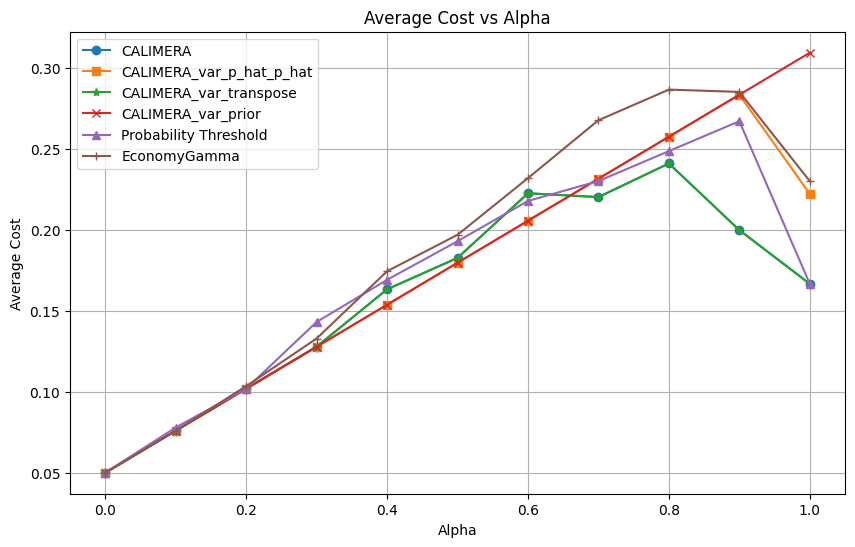

In [104]:
alphas = np.linspace(0., 1.0, 11)
plot_avg_cost_wrt_alphas(collection_clf,misclf_cost,alphas,timestamps=timestamps_alu)

#### 3.2.2 Unbalanced MisClf Cost

In [105]:
small_values = 1
misclf_cost = small_values - np.eye(len(classes_alu)) * small_values

idx_min_class = classes_alu[counts_alu.argmin()]
misclf_cost[:, idx_min_class] *= 100
print("Misclf Cost Matrix : \n",misclf_cost)

Misclf Cost Matrix : 
 [[  0.   1.]
 [100.   0.]]


#### ----Basic CALIMERA 

In [106]:
X_classif, X_trigger, y_classif, y_trigger = train_test_split(X_unbalanced_train_alu, y_unbalanced_train_alu, test_size=0.4, random_state=44)
sampling_ratio = 0.05
max_T = X_unbalanced_train_alu.shape[1] 
timestamps_unb = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
# delete potential duplicates, O's 
timestamps_unb=check_timestamps(timestamps_unb)

clf = make_pipeline(
    SplineTransformer(),
    CalibratedClassifierCV(RidgeClassifierCV(), method="sigmoid") 
)
collection_clf = ClassifiersCollection(
    base_classifier=clf,
    timestamps=timestamps_unb,
    calibration=False
)

collection_clf.fit(X_classif, y_classif)
classes, counts = np.unique(y_unbalanced_train_alu, return_counts=True)

trigger = CALIMERA(timestamps_unb,n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  4.765142407553107
Accuracy :  0.872
Earliness :  0.6902848151062155


#### ----Calimera Variant $\hat{P}-\hat{P}$

In [107]:
trigger = CALIMERA(timestamps_unb,variant='p_hat_p_hat',n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  5.718955153422502
Accuracy :  0.808
Earliness :  0.15791030684500393


#### ----Calimera Variant Transpose :

In [108]:
trigger = CALIMERA(timestamps_unb,variant='transpose',n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  5.693365853658537
Accuracy :  0.872
Earliness :  0.17073170731707318


#### ----Calimera Variant Prior

In [109]:
trigger = CALIMERA(timestamps_unb,variant='prior',n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  6.860980330448466
Accuracy :  0.792
Earliness :  0.04996066089693155


#### ----Economy $\gamma$

In [110]:
trigger = EconomyGamma(timestamps_unb,n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  4.828075531077893
Accuracy :  0.872
Earliness :  0.8161510621557828


#### ----Probability Threshold

In [111]:
trigger =   ProbabilityThreshold(timestamps_unb,n_jobs=-1)
metrics_unbalanced_misclf = train_early_classifier(X_trigger,y_trigger,X_unbalanced_test_alu,y_unbalanced_test_alu,0.5, timestamps_unb,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  4.881778127458694
Accuracy :  0.872
Earliness :  0.9235562549173878


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWa

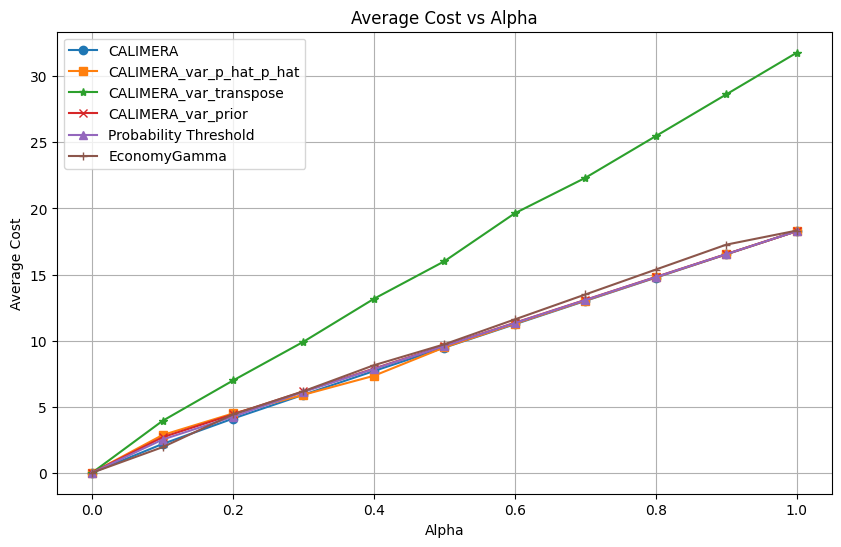

In [112]:
alphas = np.linspace(0., 1.0, 11)
plot_avg_cost_wrt_alphas(collection_clf,misclf_cost,alphas,timestamps=timestamps_unb)

### Trying other datasets from whole cylinders (Unbalanced, non z-normalized)

### Chinatown

In [22]:
def get_info_dataset(dataset):
    data_dict = load_dataset(dataset, split=0.8, z_normalize=True)
    X_train = data_dict['X_train']

    y_train = data_dict['y_train']
    X_test = data_dict['X_test']
    y_test = data_dict['y_test']
    classes, counts = np.unique(y_train, return_counts=True)
    colors = itertools.cycle(plt.cm.tab10.colors)

# vizualisation of the dataset
    fig, axes = plt.subplots(nrows=len(classes), ncols=1, figsize=(12,6))

    for i, cls in enumerate(classes):
        rd_idx = np.random.choice(np.where(y_train==cls)[0], size=10)
        c = next(colors)
        for j, idx in enumerate(rd_idx):
            axes[i].plot(X_train[idx].squeeze(), color=c, alpha=0.8, lw=1,
                     label=f"Class no {cls}" if j == 0 else "")
            if j == 0:
                axes[i].legend()
    plt.show()
    print("Number of classes in train set: ", len(classes))
    print("Number of samples in train set: ", len(y_train))
    print("Number of features in train set: ", X_train.shape[1])
    print("Number of samples per class in train set: ", counts)
    print("Number of samples in test set: ", len(y_test))
    print("Number of features in test set: ", X_test.shape[1])
    print("Number of samples per class in test set: ", np.unique(y_test, return_counts=True)[1])
    print("Number of classes in test set: ", len(np.unique(y_test)))
    return X_train, y_train, X_test, y_test, classes, counts



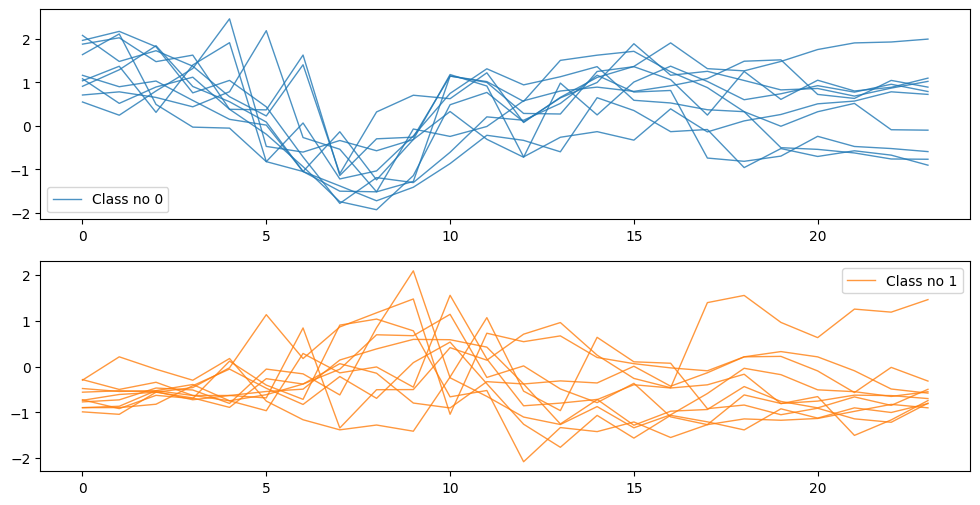

Number of classes in train set:  2
Number of samples in train set:  290
Number of features in train set:  24
Number of samples per class in train set:  [ 83 207]
Number of samples in test set:  73
Number of features in test set:  24
Number of samples per class in test set:  [21 52]
Number of classes in test set:  2


In [23]:
X_train_china, y_train_china, X_test_china, y_test_china, classes_china, counts_china=get_info_dataset('Chinatown')

### DodgerLoopDay

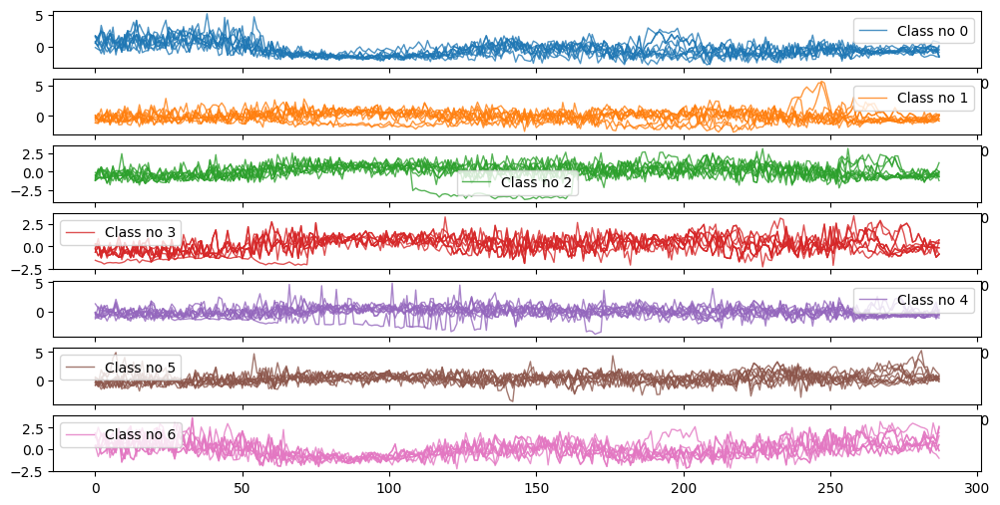

Number of classes in train set:  7
Number of samples in train set:  126
Number of features in train set:  288
Number of samples per class in train set:  [19 17 16 17 19 20 18]
Number of samples in test set:  32
Number of features in test set:  288
Number of samples per class in test set:  [5 4 4 5 5 5 4]
Number of classes in test set:  7


In [7]:
X_train_dodger, y_train_dodger, X_test_dodger, y_test_dodger, classes_dodger, counts_dodger=get_info_dataset('DodgerLoopDay')

### SmoothSubSpace

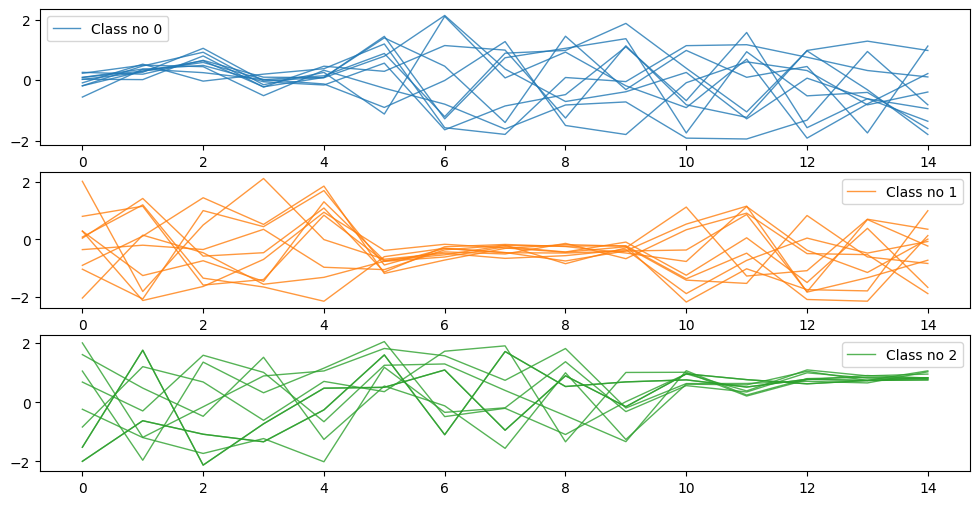

Number of classes in train set:  3
Number of samples in train set:  240
Number of features in train set:  15
Number of samples per class in train set:  [80 80 80]
Number of samples in test set:  60
Number of features in test set:  15
Number of samples per class in test set:  [20 20 20]
Number of classes in test set:  3


In [23]:
X_train_subspace, y_train_subspace, X_test_subspace, y_test_subspace, classes_subspace, counts_subspace=get_info_dataset('SmoothSubSpace')

### GunPointAgeSpan

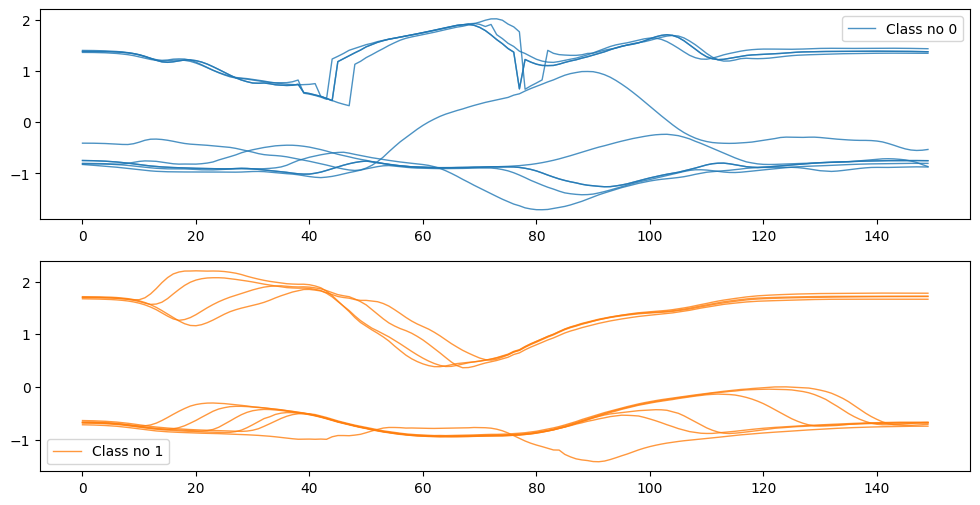

Number of classes in train set:  2
Number of samples in train set:  360
Number of features in train set:  150
Number of samples per class in train set:  [182 178]
Number of samples in test set:  91
Number of features in test set:  150
Number of samples per class in test set:  [46 45]
Number of classes in test set:  2


In [31]:
X_train_gunpoint, y_train_gunpoint, X_test_gunpoint, y_test_gunpoint, classes_gunpoint, counts_gunpoint=get_info_dataset('GunPointAgeSpan')

### ----Ridge Classifier and Calibrated Classifier CV Sigmoid Method

#### ---- Monitoring Accuracy

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


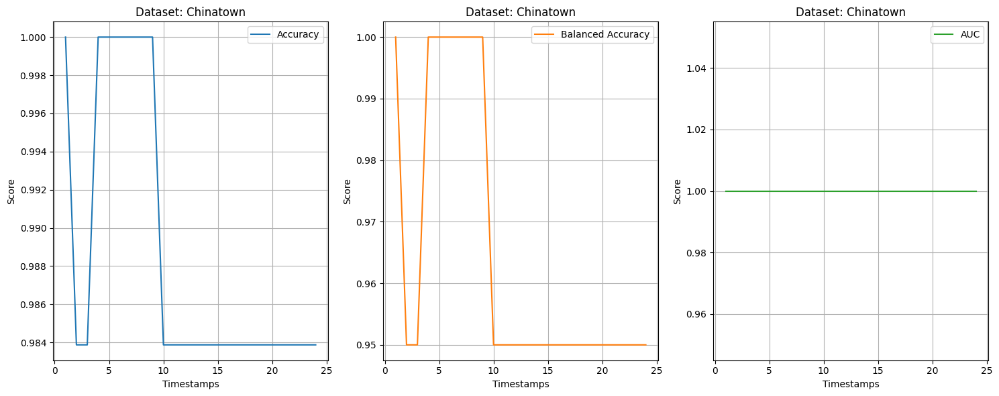

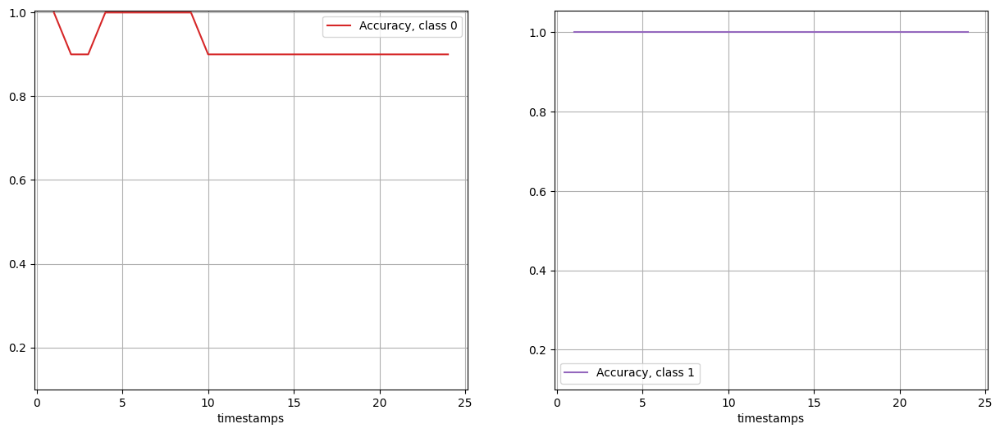

In [11]:
monitor_accuracy('Chinatown',clf_type='ridge', clf_method='isotonic')

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


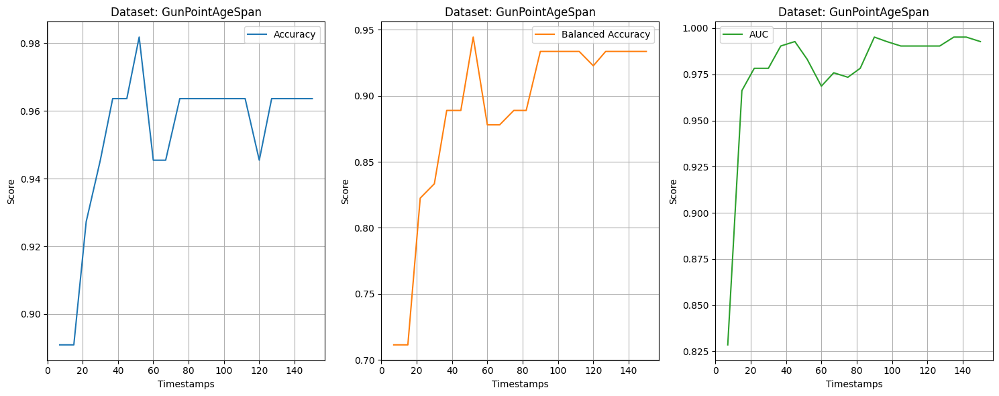

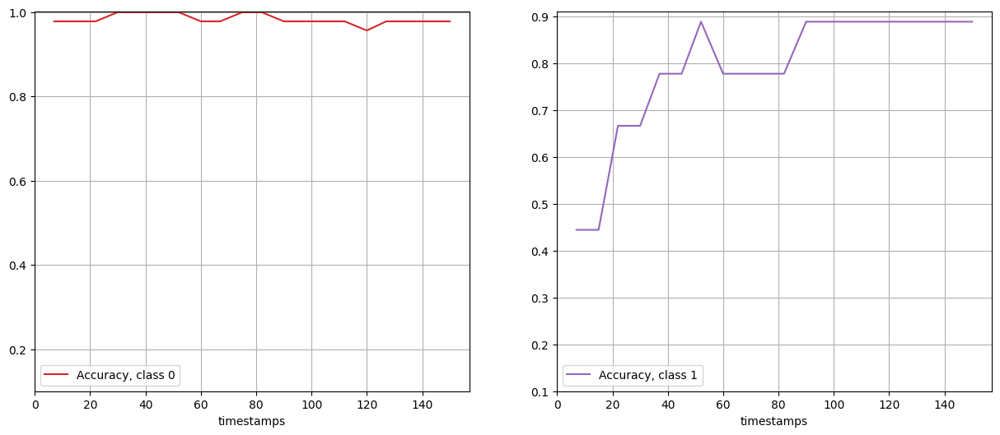

In [ ]:
monitor_accuracy('GunPointAgeSpan',clf_type='rocket', clf_method='isotonic')

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:110: UserWarning: Removed duplicates in argument 'timestamps'.
  warn("Removed duplicates in argument 'timestamps'.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:114: UserWarning: Removed 0 from 'timestamps', first valid timestamps is usually 1.
  warn("Removed 0 from 'timestamps', first valid timestamps is usually 1.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


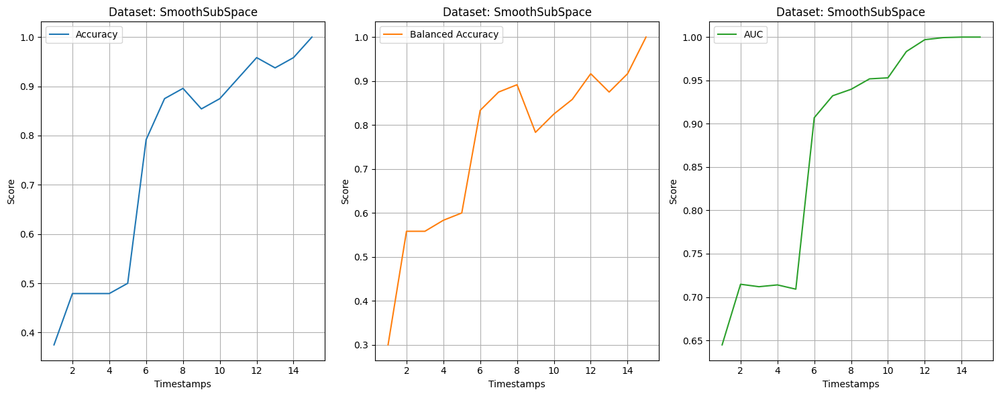

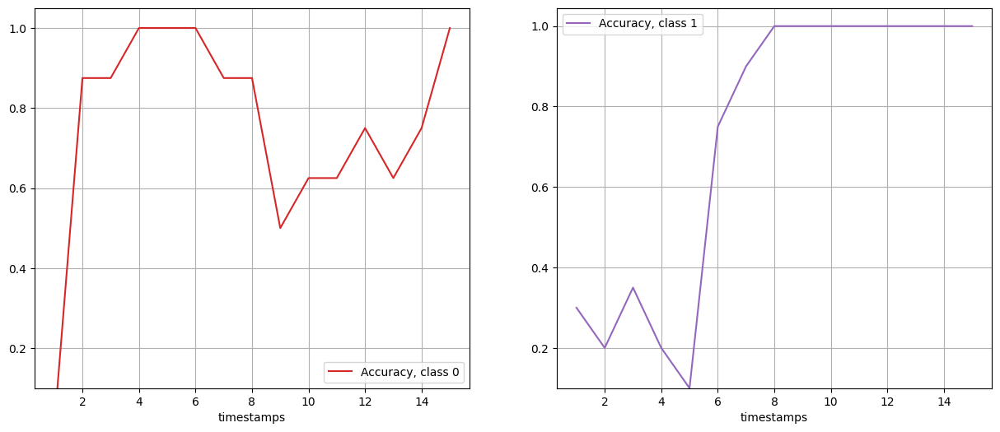

In [ ]:
monitor_accuracy('SmoothSubSpace',clf_type='rocket', clf_method='isotonic')

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


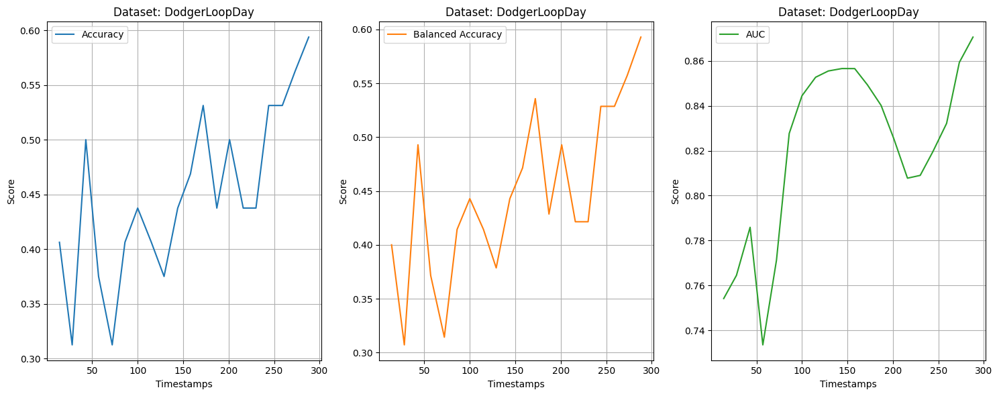

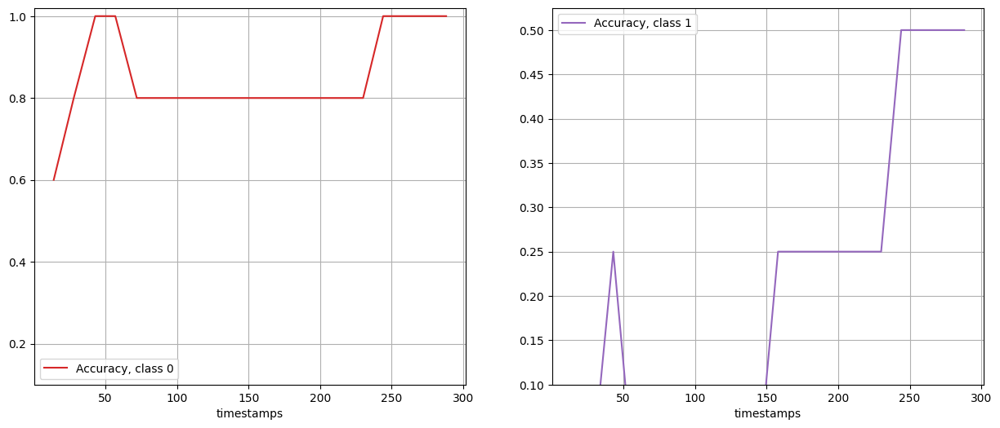

In [ ]:
monitor_accuracy('DodgerLoopDay',clf_type='rocket', clf_method='isotonic')

Processing dataset: GunPointAgeSpan


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrice

Dataset GunPointAgeSpan processed.
Processing dataset: DodgerLoopDay


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrice

Dataset DodgerLoopDay processed.
Processing dataset: SmoothSubspace


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:110: UserWarning: Removed duplicates in argument 'timestamps'.
  warn("Removed duplicates in argument 'timestamps'.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:114: UserWarning: Removed 0 from 'timestamps', first valid timestamps is usually 1.
  warn("Removed 0 from 'timestamps', first valid timestamps is usually 1.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No del

Dataset SmoothSubspace processed.


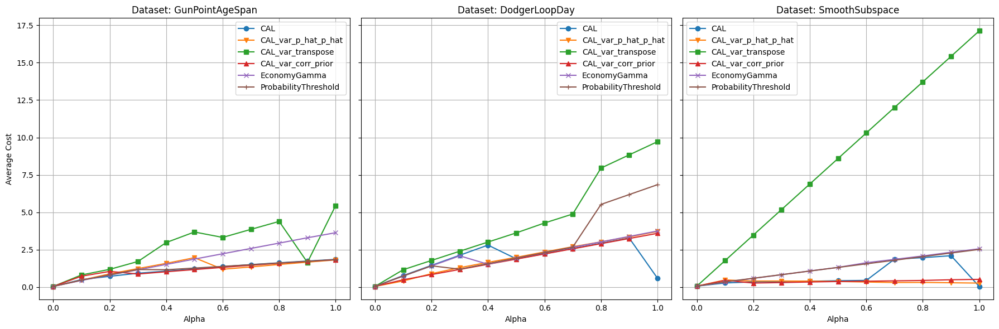

In [115]:
datasets = ['GunPointAgeSpan' ,'DodgerLoopDay', 'SmoothSubspace']
alphas = np.linspace(0., 1.0, 11)
avg_costs = get_avg_cost_over_datasets_wrt_alphas(alphas,clf_type='ridge',clf_method='sigmoid',datasets=datasets,misclf_cost='unbalanced')
plot_avg_cost_per_dataset(avg_costs, alphas, datasets)

#### ----Ridge Classifier and Calibrated Classifier CV Isotonic Method

#### ----Monitoring Accuracy

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


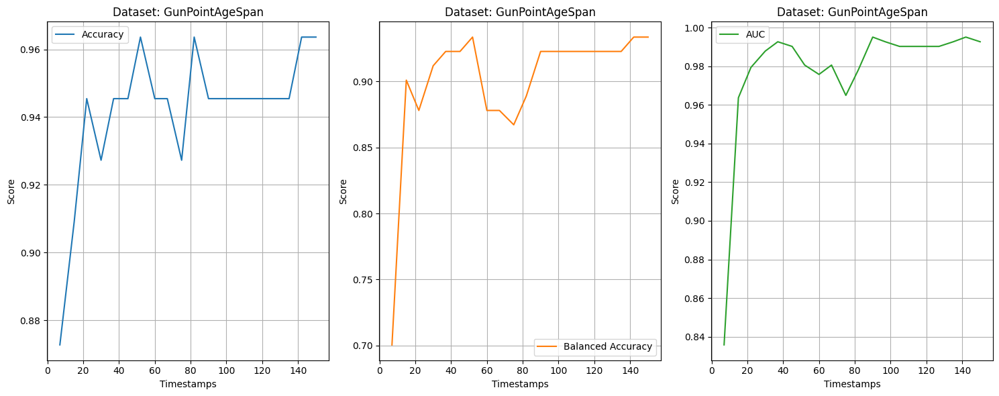

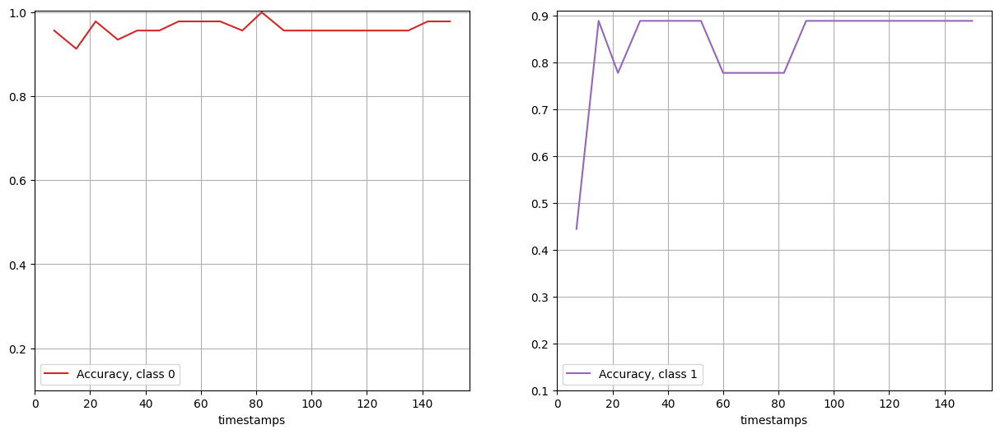

In [111]:
monitor_accuracy('GunPointAgeSpan',clf_method='isotonic')

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


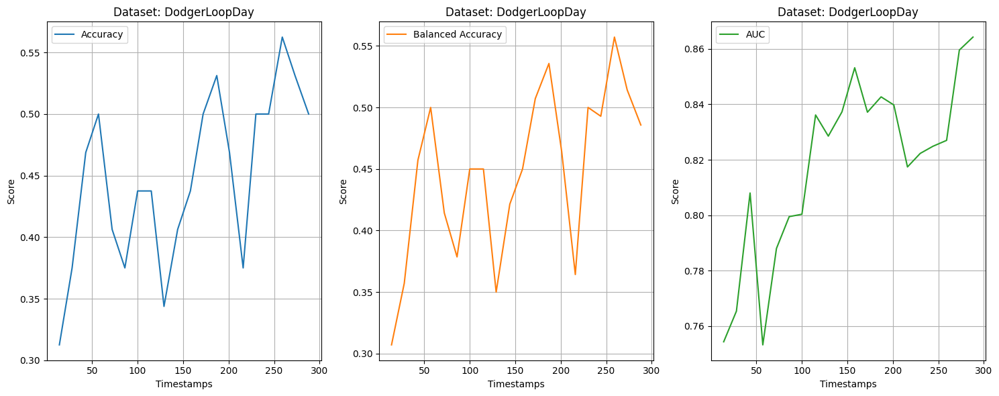

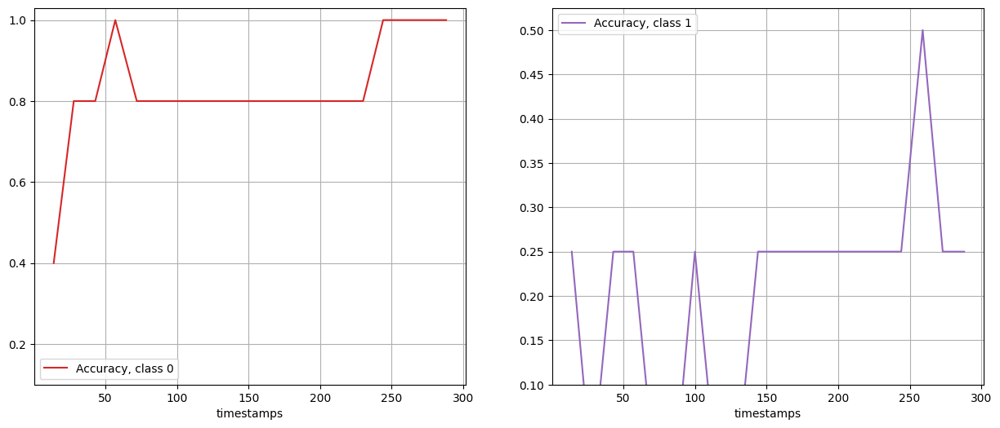

In [112]:
monitor_accuracy('DodgerLoopDay',clf_method='isotonic')

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:110: UserWarning: Removed duplicates in argument 'timestamps'.
  warn("Removed duplicates in argument 'timestamps'.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:114: UserWarning: Removed 0 from 'timestamps', first valid timestamps is usually 1.
  warn("Removed 0 from 'timestamps', first valid timestamps is usually 1.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")


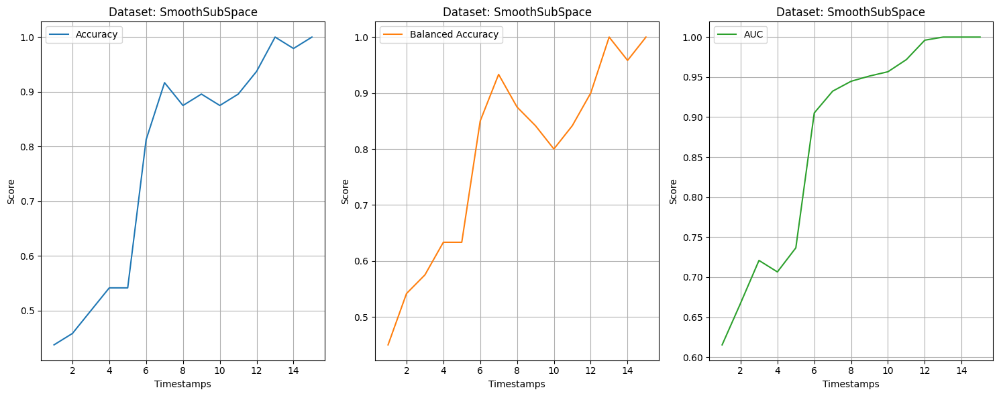

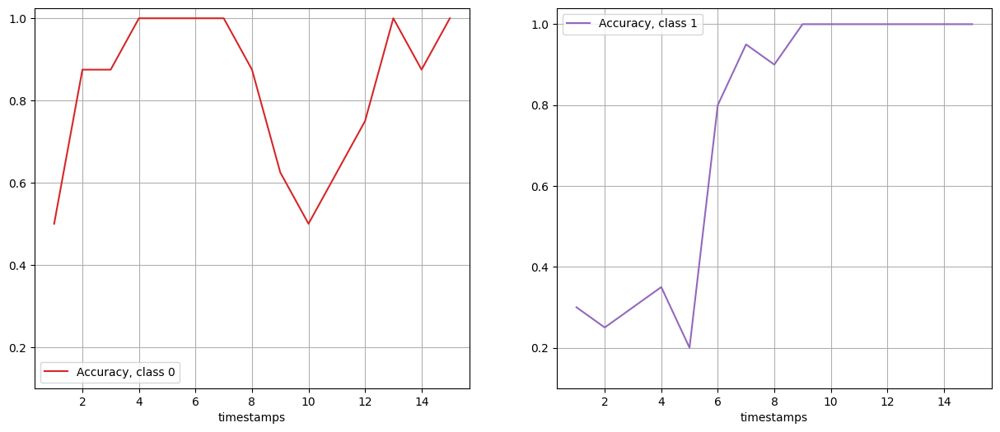

In [113]:
monitor_accuracy('SmoothSubSpace',clf_method='isotonic')

Processing dataset: GunPointAgeSpan


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrice

Dataset GunPointAgeSpan processed.
Processing dataset: DodgerLoopDay


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrice

Dataset DodgerLoopDay processed.
Processing dataset: SmoothSubspace


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:110: UserWarning: Removed duplicates in argument 'timestamps'.
  warn("Removed duplicates in argument 'timestamps'.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\utils.py:114: UserWarning: Removed 0 from 'timestamps', first valid timestamps is usually 1.
  warn("Removed 0 from 'timestamps', first valid timestamps is usually 1.")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No del

Dataset SmoothSubspace processed.


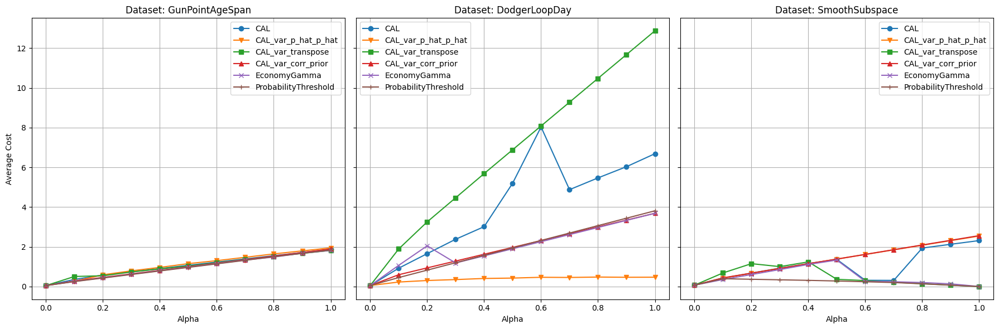

In [116]:
datasets = ['GunPointAgeSpan' ,'DodgerLoopDay', 'SmoothSubspace']
alphas = np.linspace(0., 1.0, 11)
avg_costs = get_avg_cost_over_datasets_wrt_alphas(alphas,clf_type='ridge',clf_method='isotonic',datasets=datasets,misclf_cost='unbalanced')
plot_avg_cost_per_dataset(avg_costs, alphas, datasets)

#### ----CALIMERA TrueLabel 

In [37]:
classes_china, counts_china = np.unique(y_train_china,return_counts=True)

small_values = 1
misclf_cost = small_values - np.eye(len(classes_china)) * small_values

idx_min_class = classes_china[counts_china.argmin()]
misclf_cost[:, idx_min_class] *= 100
print("Misclf Cost Matrix : \n",misclf_cost)
X_classif_china, X_trigger_china, y_classif_china, y_trigger_china = train_test_split(X_train_china, y_train_china, test_size=0.4, random_state=44)
sampling_ratio = 0.05
max_T = X_train_china.shape[1] 
timestamps = [int(max_T * (sampling_ratio * i)) for i in range(1, int(1/sampling_ratio)+1)]
# delete potential duplicates, O's 


collection_clf = ClassifiersCollection(
        base_classifier=RidgeClassifierCV(),
        feature_extraction={"method": "minirocket", "path": "models/", "params": {"random_state":42, "n_jobs": -1}},
        timestamps=timestamps,
        cv_method='isotonic' # change it to isotonic after testing
)

collection_clf.fit(X_classif_china, y_classif_china)
classes, counts = np.unique(y_train_china, return_counts=True)

trigger = CALIMERA(timestamps,variant='true_label',n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger_china,y_trigger_china,X_test_china,y_test_china,0.5, timestamps,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

Misclf Cost Matrix : 
 [[  0.   1.]
 [100.   0.]]


C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\_base.py:35: UserWarning: No min_length procided, using a minimum length of 1 by default
  warn("No min_length procided, using a minimum length of 1 by default")
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\features_engineering\features_extraction.py:48: UserWarning: Time series provided are too short, (length = 1) for minirocket, using timestamps as features
  warn(f"Time series provided are too short, (length = {X.shape[1]}) for {self.method},"
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\features_engineering\features_extraction.py:48: UserWarning: Time series provided are too short, (length = 2) for minirocket, using timestamps as features
  warn(f"Time series provided are too short, (length = {X.shape[1]}) for {self.method},"
C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\classification\features_engineering\features_

Average cost:  0.1906392694063927
Accuracy :  0.9863013698630136
Earliness :  0.3675799086757991


#### ----ChinaTown CALIMERA TrueLabel + Eps Cross Val :

In [38]:

trigger = CALIMERA(timestamps,variant='true_label',epsilon_method=True,n_jobs=-1)
metrics_unbalanced_misclf_basic = train_early_classifier(X_trigger_china,y_trigger_china,X_test_china,y_test_china,0.5, timestamps,collection_clf,misclf_cost, trigger)
print("Average cost: ", metrics_unbalanced_misclf_basic['average_cost'])
print("Accuracy : ", metrics_unbalanced_misclf_basic['accuracy'])
print("Earliness : ", metrics_unbalanced_misclf_basic['earliness'])

C:\Users\WTHK0243\OneDrive - orange.com\Bureau\ml_edm\src\ml_edm\cost_matrices.py:83: UserWarning: No delay cost defined, using default linear delay function
  warn("No delay cost defined, using default linear delay function")


Average cost:  0.11015981735159819
Accuracy :  0.9863013698630136
Earliness :  0.20662100456621005


In [39]:
trigger.candidate_epsilon

array([ 0.0799467 , -0.17242764, -0.42480198, -0.67717631, -0.92955065,
       -1.18192499, -1.43429932, -1.68667366, -1.939048  , -2.19142233])

In [40]:
trigger.opt_epsilon

-0.1724276399654716

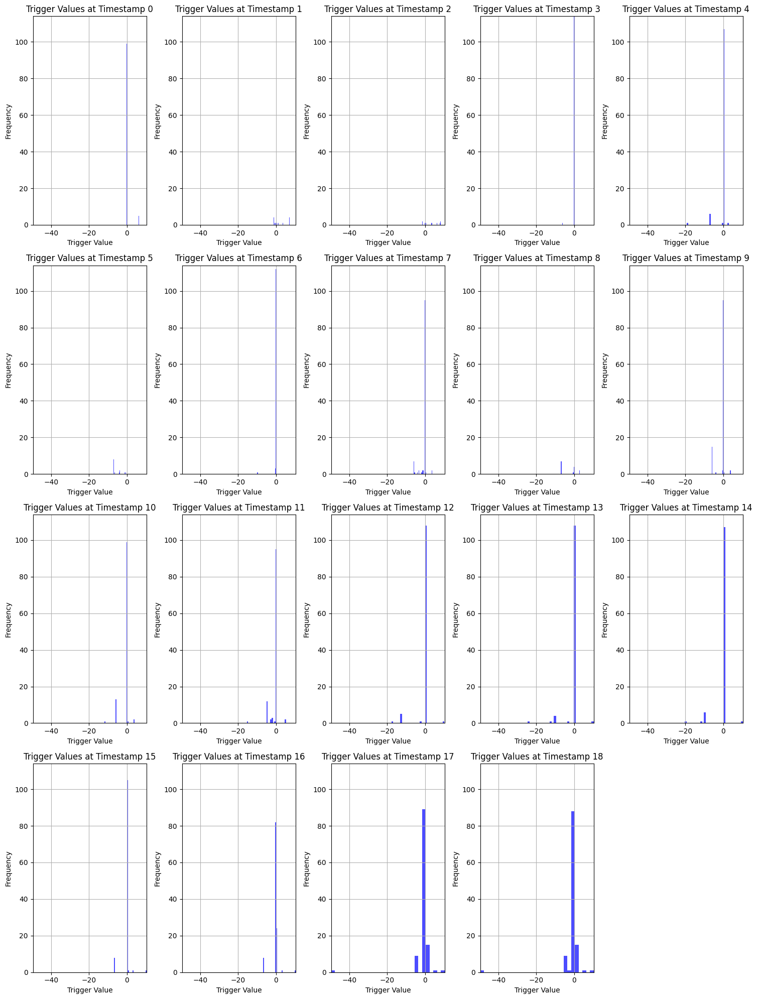

In [44]:
visualize_trigger_values_grid(trigger.y_triggers,num_lines=4)

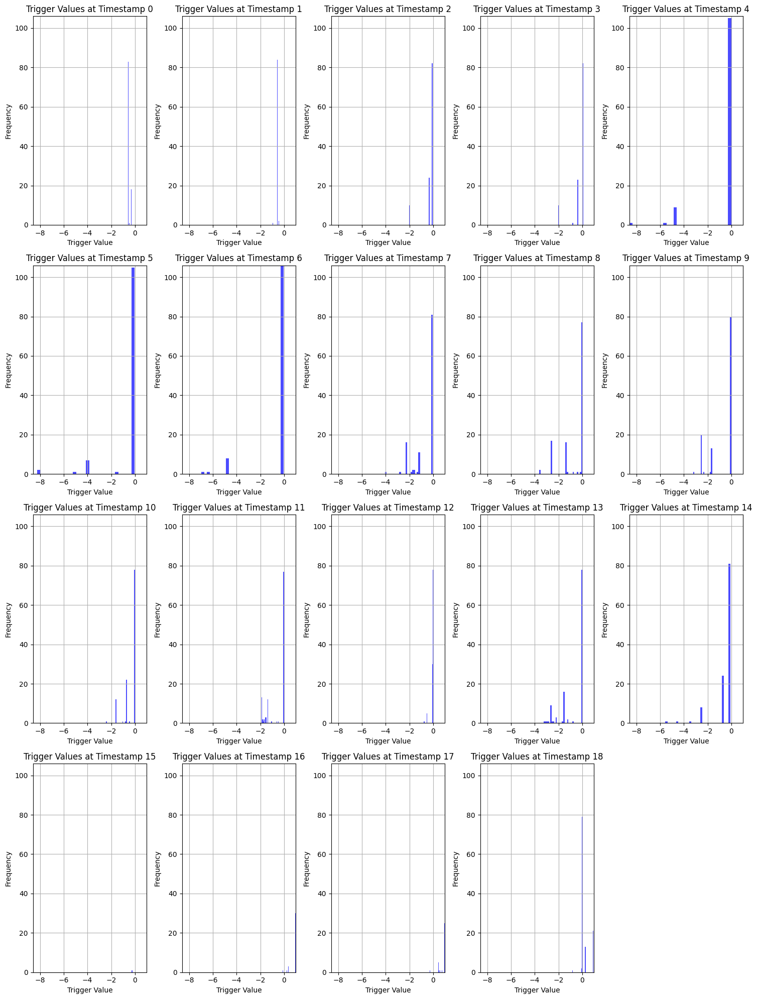

In [45]:
visualize_trigger_values_grid(trigger.pred_cost_diffs.T,num_lines = 4)